In [ ]:
import itertools
import numpy as np
import pandas as pd
from scipy.spatial import distance_matrix
import matplotlib
import matplotlib.pylab as plt
import seaborn as sns

!pip install pulp
import pulp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.7/17.7 MB 39.0 MB/s eta 0:00:00


In [ ]:
#create dataframe
def create_df(customer_count):
  df = pd.DataFrame({
      'x': np.random.randint(0, 100, customer_count),
      'y': np.random.randint(0, 100, customer_count),
      'demand': np.random.randint(1, 4, customer_count),
      'priority': np.random.randint(1, 2, customer_count),
  })

  df.iloc[0]['x'] = 0
  df.iloc[0]['y'] = 0
  df.iloc[0]['demand'] = 0
  df.iloc[0]['priority'] = 0
  df.iloc[-1]['x'] = 50
  df.iloc[-1]['y'] = 50
  df.iloc[-1]['demand'] = 0
  df.iloc[0]['priority'] = 0

  print(df)
  return df


In [ ]:
# get distance matrix
def dist_mat(df):
  distances = pd.DataFrame(distance_matrix(df[['x', 'y']].values, df[['x', 'y']].values), index=df.index, columns=df.index).values

  # fig, ax = plt.subplots(figsize=(8, 7))
  # sns.heatmap(distances, ax=ax, cmap='Blues', annot=True, fmt='.0f', cbar=True, cbar_kws={"shrink": .3}, linewidths=.1)
  # plt.title('distance matrix')
  # plt.show()

  return distances

In [ ]:
def plot_points(df):
  # check VRP state

  plt.figure(figsize=(5, 5))

  # draw problem state
  for i, row in df.iterrows():
      if i == 0:
          plt.scatter(row['x'], row['y'], c='red')
          plt.text(row['x'] + 1, row['y'] + 1, 'taxi')
      if i == -1:
          plt.scatter(row['x'], row['y'], c='green')
          plt.text(row['x'] + 1, row['y'] + 1, 'hotspot')
      else:
          plt.scatter(row['x'], row['y'], c='black')
          demand = row['demand']
          plt.text(row['x'] + 1, row['y'] + 1, f'{i}({demand})')

  plt.xlim([-10, 110])
  plt.ylim([-10, 110])
  plt.title('points: id(demand)')
  plt.show()

In [ ]:
# solve with pulp
def pulp_solve(df, distances, customer_count):
  demands = df['demand'].values

  for vehicle_count in range(1,vehicle_counts+1):

    # definition of LpProblem instance
    problem = pulp.LpProblem("CVRP", pulp.LpMinimize)

    # definition of variables which are 0/1
    # already includes constraint sum(xii) = 0
    x = [[[pulp.LpVariable("x%s_%s,%s"%(i,j,k), cat="Binary") if i != j else None for k in range(vehicle_count)]for j in range(customer_count)] for i in range(customer_count)]
    u = pulp.LpVariable.dicts('u', (i for i in range(1, customer_count)), lowBound=0, cat='Continuous')

    # add objective function
    problem += pulp.lpSum(distances[i][j] * x[i][j][k] if i != j else 0
                          for k in range(vehicle_count)
                          for j in range(customer_count)
                          for i in range (customer_count))

  #CONSTRAINTS

    # pickup all points with exactly one cab
    for j in range(1,customer_count-1):
        problem += pulp.lpSum(x[i][j][k] for i in range(customer_count) for k in range(vehicle_count)) == 1


    #depart from Taxi
    for k in range(vehicle_count):
        problem += pulp.lpSum(x[0][j][k] for j in range(1,customer_count)) == 1
        problem += pulp.lpSum(x[i][0][k] for i in range(1,customer_count)) == 0

    #arrive at Hotspot
    for k in range(vehicle_count):
        problem += pulp.lpSum(x[i][customer_count-1][k] for i in range(customer_count-1)) == 1
        problem += pulp.lpSum(x[customer_count-1][j][k] for j in range(customer_count-1)) == 0

    # demand collected on the route is less than Vehicle Capacity
    for k in range(vehicle_count):
        problem += pulp.lpSum(df.demand[j]*x[i][j][k] if i != j else 0
                              for i in range(customer_count) for j in range(customer_count)) <= vehicle_capacity

    #if arrive then leave
    for k in range(vehicle_count):
        for j in range(1,customer_count-1):
            problem += pulp.lpSum( pulp.lpSum(x[i][j][k] for i in range(0,customer_count-1)) ) == ( pulp.lpSum(x[j][m][k] for m in range(1,customer_count)) )

    # Subtour Elimination (MTZ constraints)
    for i in range(1, customer_count):
        problem += u[i] >= 1  # Ensures that each node (except the depot) is visited at least once
        problem += u[i] <= customer_count - 1  # Sets an upper bound for u[i]
    for k in range(vehicle_count):
        for i in range(1, customer_count):
            for j in range(1, customer_count):
                if i != j:
                    problem += u[i] - u[j] + (customer_count - 1) * x[i][j][k] <= customer_count- 2

    # solve problem
    status = problem.solve()
    print(status)

    if status == 1:
        print('Vehicle Requirements:', vehicle_count)
        print('Moving Distance:', pulp.value(problem.objective))
        break

  # visualization : plotting with matplolib

  plt.figure(figsize=(8,8))
  for i in range(customer_count):
      if i == 0:
          plt.scatter(df.iloc[i]['x'], df.iloc[i]['y'], c='green', s=200)
          plt.text(df.iloc[i]['x'], df.iloc[i]['y'], "Depot 1", fontsize=14)
      elif i == customer_count -1:
          plt.scatter(df.iloc[i]['x'], df.iloc[i]['y'], c='red', s=200)
          plt.text(df.iloc[i]['x'], df.iloc[i]['y'], "Hotspot", fontsize=14)
      else:
          plt.scatter(df.iloc[i]['x'], df.iloc[i]['y'], c='orange', s=200)
          plt.text(df.iloc[i]['x'], df.iloc[i]['y'], str(i)+" ("+ str(df.iloc[i]['demand']) + ")", fontsize=10)

  for k in range(vehicle_count):
      for i in range(customer_count):
          for j in range(customer_count):
              if i != j and pulp.value(x[i][j][k]) == 1:
                  plt.arrow(df.iloc[i]['x'], df.iloc[i]['y'], df.iloc[j]['x']-df.iloc[i]['x'], df.iloc[j]['y']-df.iloc[i]['y'], head_width=2, head_length=2, fc='black', ec='black')

                  mid_x = (df.iloc[i]['x'] + df.iloc[j]['x']) / 2
                  mid_y = (df.iloc[i]['y'] + df.iloc[j]['y']) / 2
                  plt.text(mid_x, mid_y, f"Cab {k}", ha="center", va="center", fontsize=12, color = 'purple')



  plt.show()


  rejected_list = set()

  for k in range(vehicle_count):
    CP = 0
    SP = 0

    nodes = set()
    terminate = 0
    for i in range(customer_count-1):
        if terminate==1:
          break
        for j in range(1, customer_count):
            if i != j and pulp.value(x[i][j][k]) == 1:

              CP += pulp.value(distances[i][j] * x[i][j][k])

              if i==0 or i==customer_count-1:
                continue
              else:
                SP += distances[i][customer_count-1]*demands[i]
                if df.iloc[i].priority >=2:
                  nodes = set()
                  terminate = 1
                  break
                else:
                  nodes.add(i)

              i = j
              break
        if i==customer_count-1:
          break

    if terminate == 0:
      Gain = 1.5*SP - CP
      print(k, CP, SP, Gain)
      print(nodes)
      if Gain<20:
          rejected_list = set(list(rejected_list) + list(nodes))


  rejected_df = df.iloc[list(rejected_list)]

  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)
  rejected_df
  print(rejected_df)
  return rejected_df

In [ ]:
# define VRP
vehicle_capacity = 3
vehicle_counts = 20
count = 0

In [ ]:
def Optimizer(rejected_df):
  global count
  print("Iteration ", count)
  count+=1
  if count==10:
    return
  customer_count = np.random.randint(4, 7)
  df = create_df(customer_count)
  hotspot = df.iloc[[customer_count-1]]
  df = pd.concat([df.iloc[:customer_count-1], rejected_df], ignore_index = True)
  df = pd.concat([df, hotspot], ignore_index = True)
  print(df)

  distances = dist_mat(df)
  plot_points(df)
  rejected = pulp_solve(df, distances, len(df))
  Optimizer(rejected)

Iteration  10
    x   y  demand  priority
0   0   0       0         0
1  44  63       2         1
2  99  36       2         1
3  60  98       3         1
4  80  35       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  44  63       2         1
2  99  36       2         1
3  60  98       3         1
4  80  35       2         1
5  50  50       0         1


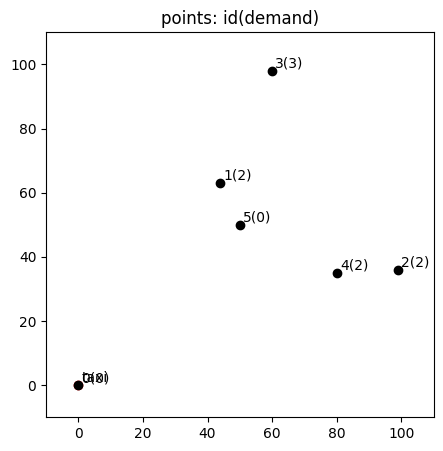

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 532.2664150101417


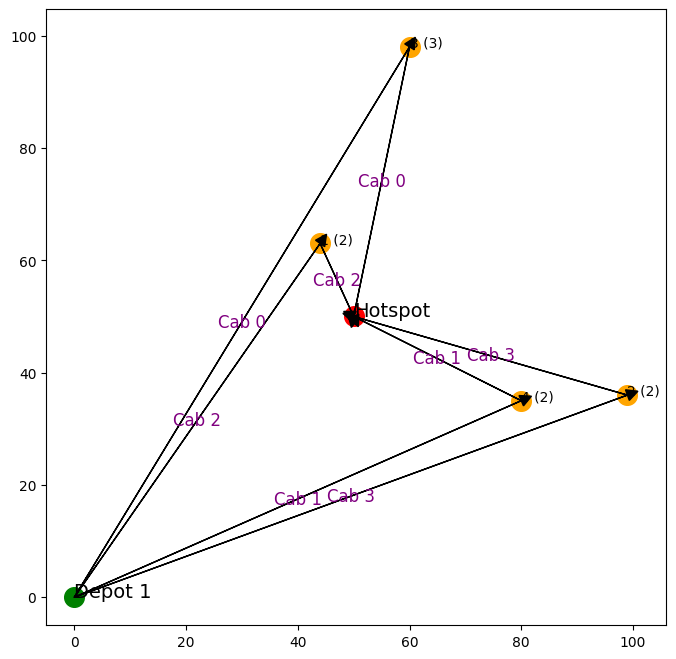

0 163.93926206631085 147.09180806557515 56.69845003205188
{3}
1 120.86226564536176 67.08203932499369 -20.23920665787122
{4}
2 91.16181887702886 28.635642126552707 -48.208355687199806
{1}
3 156.30306842144026 101.92153844992725 -3.4207607465493766
{2}
    x   y  demand  priority
1  44  63       2         2
2  99  36       2         2
4  80  35       2         2
Iteration  11
    x   y  demand  priority
0   0   0       0         0
1  40  52       1         1
2  27  56       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  40  52       1         1
2  27  56       1         1
3  44  63       2         2
4  99  36       2         2
5  80  35       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


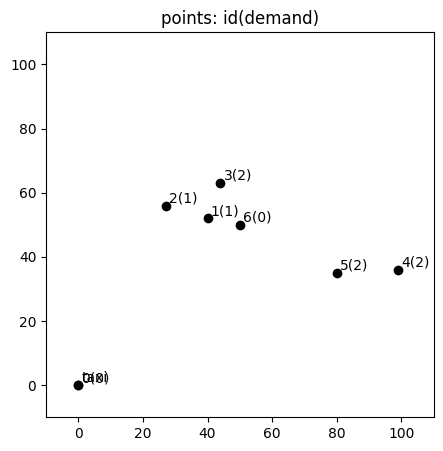

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 392.15670259929703


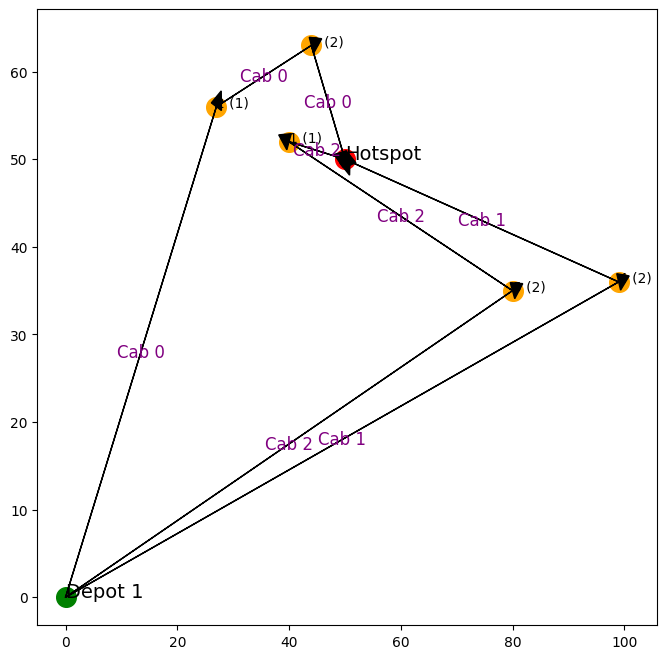

2 97.51928501005048 10.198039027185569 -82.22222646927213
{1}
    x   y  demand  priority
1  40  52       1         2
Iteration  12
    x   y  demand  priority
0   0   0       0         0
1   2  95       3         1
2  36  96       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   2  95       3         1
2  36  96       2         1
3  40  52       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


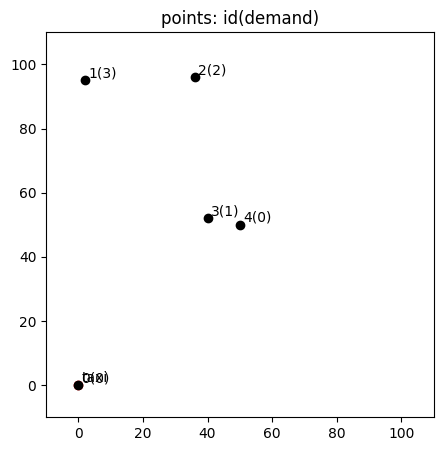

-1
1
Vehicle Requirements: 2
Moving Distance: 317.7237149375231


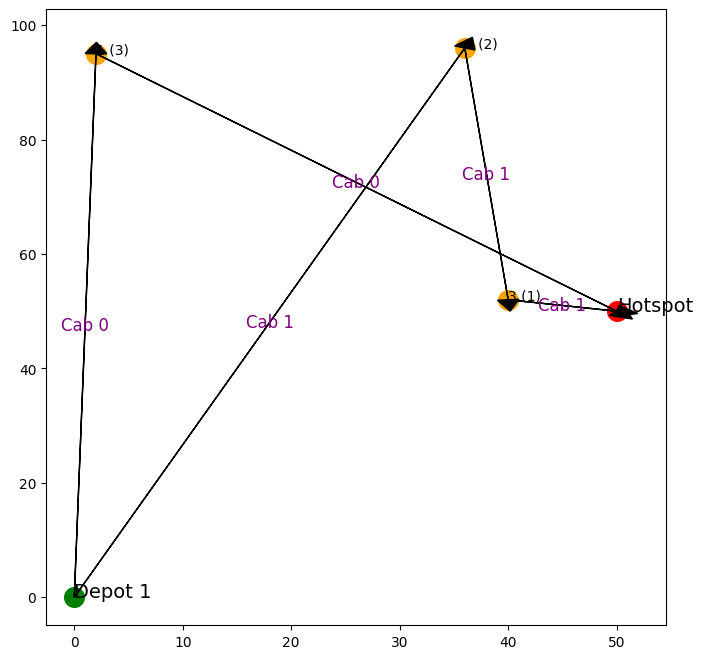

0 160.8161868977781 197.38540979515176 135.26192779494954
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  13
    x   y  demand  priority
0   0   0       0         0
1  61  74       2         1
2  80  19       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  61  74       2         1
2  80  19       1         1
3  50  50       0         1


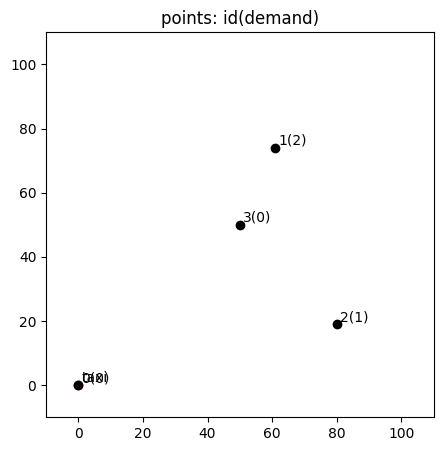

1
Vehicle Requirements: 1
Moving Distance: 166.81540391147965


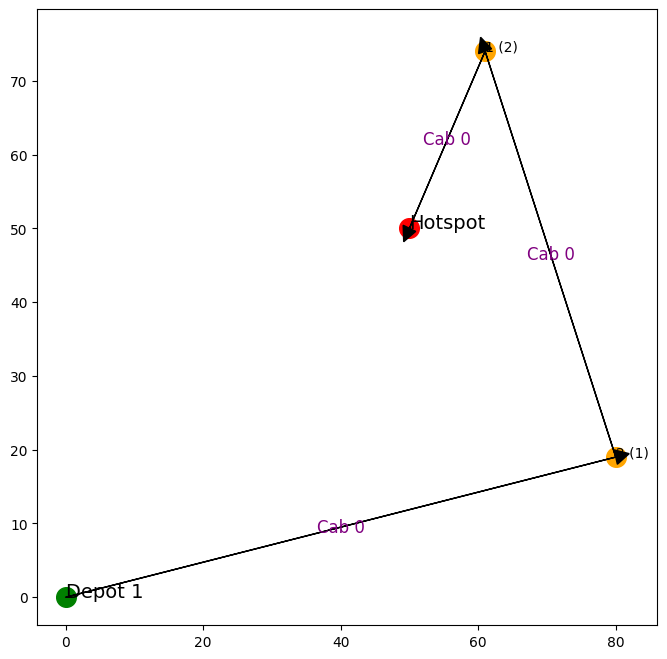

0 108.62605780757502 52.80151512977634 -29.423785112910508
{1}
    x   y  demand  priority
1  61  74       2         2
Iteration  14
    x   y  demand  priority
0   0   0       0         0
1  81  54       3         1
2  23  62       3         1
3  67  75       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  81  54       3         1
2  23  62       3         1
3  67  75       3         1
4  61  74       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


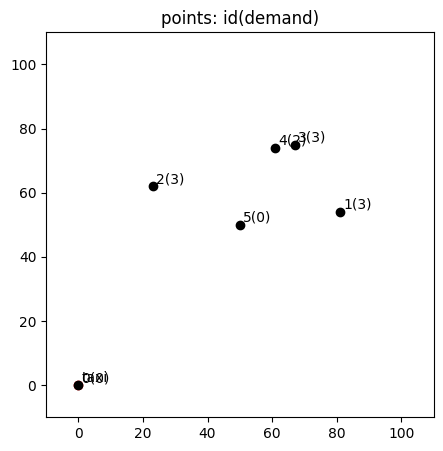

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 477.3846853134084


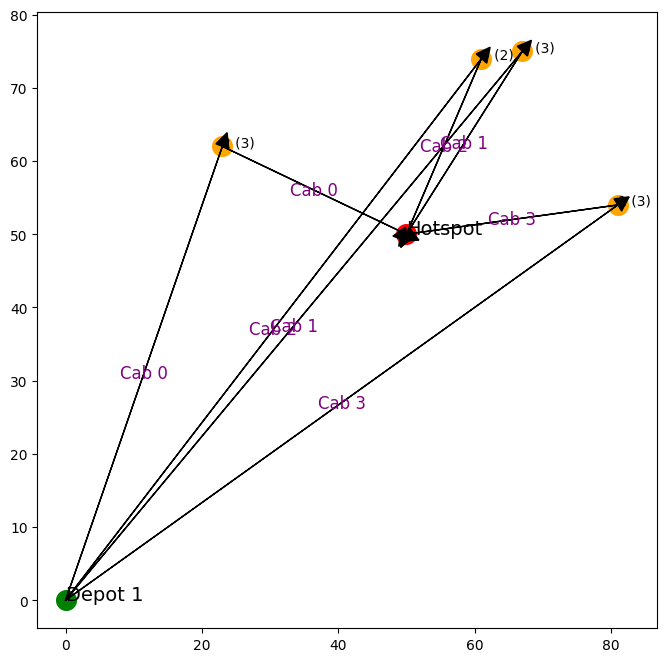

0 95.67523587485007 88.63972021616495 37.28434444939734
{2}
1 130.80081760985897 90.69729874698585 5.245130510619816
{3}
3 128.60688365370328 93.7709976485267 12.049612819086775
{1}
    x   y  demand  priority
1  81  54       3         2
3  67  75       3         2
Iteration  15
    x   y  demand  priority
0   0   0       0         0
1  67  38       3         1
2  71  79       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  67  38       3         1
2  71  79       2         1
3  81  54       3         2
4  67  75       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


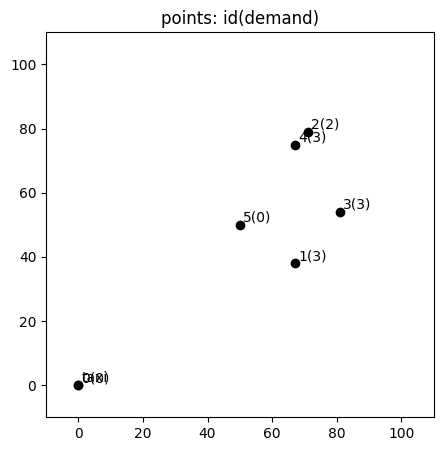

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 499.26411004299996


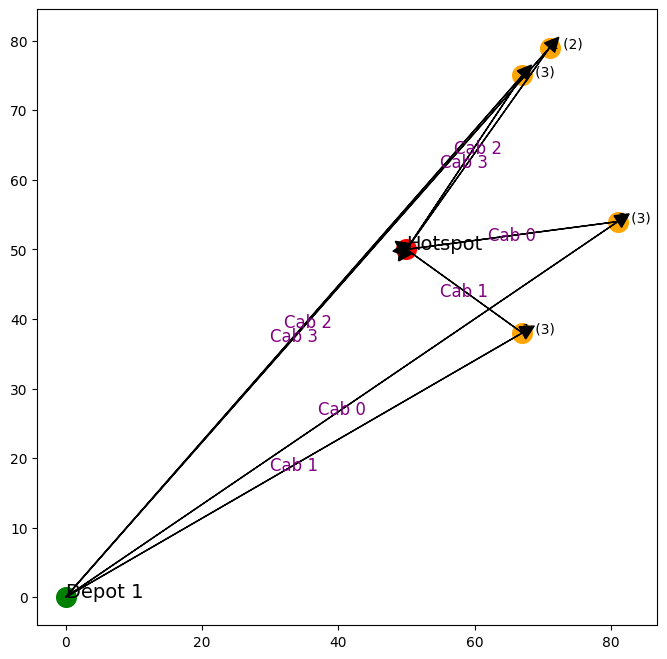

1 97.83462169329167 62.42595614005444 -4.195687483210008
{1}
2 142.02178708614608 71.61005515987263 -34.606704346337125
{2}
    x   y  demand  priority
1  67  38       3         2
2  71  79       2         2
Iteration  16
    x   y  demand  priority
0   0   0       0         0
1  48  22       2         1
2  23   5       1         1
3  23  29       3         1
4  70  49       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  48  22       2         1
2  23   5       1         1
3  23  29       3         1
4  70  49       1         1
5  67  38       3         2
6  71  79       2         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


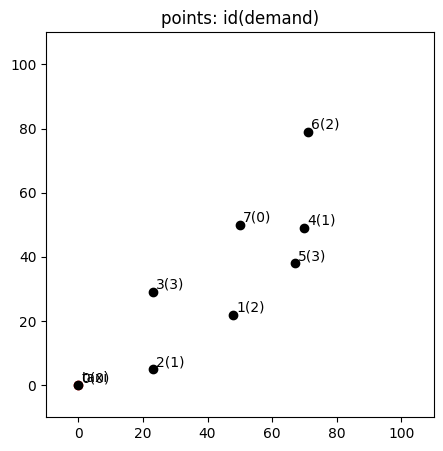

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 402.1619496253668


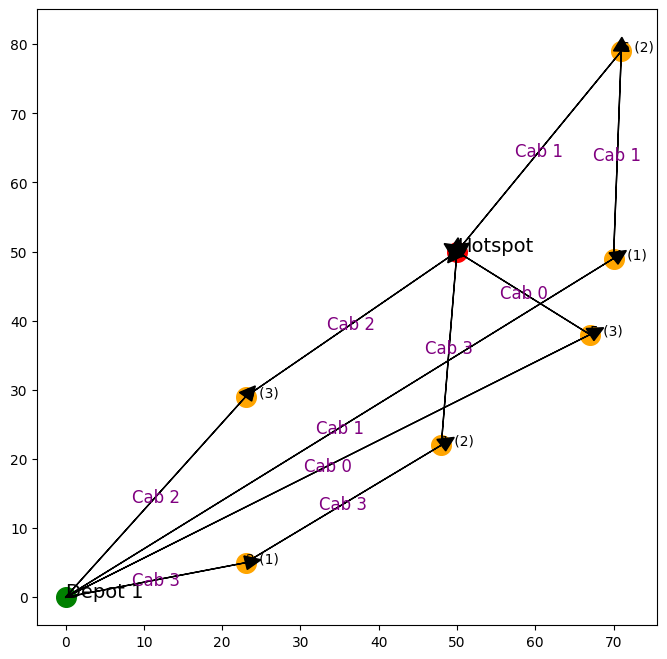

2 71.21877379961764 102.61578825892244 82.70490858876603
{3}
3 51.60854228711604 56.142675390472796 32.60547079859316
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  17
    x   y  demand  priority
0   0   0       0         0
1  35  70       3         1
2  58  82       2         1
3  13  84       1         1
4  11  77       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  35  70       3         1
2  58  82       2         1
3  13  84       1         1
4  11  77       2         1
5  50  50       0         1


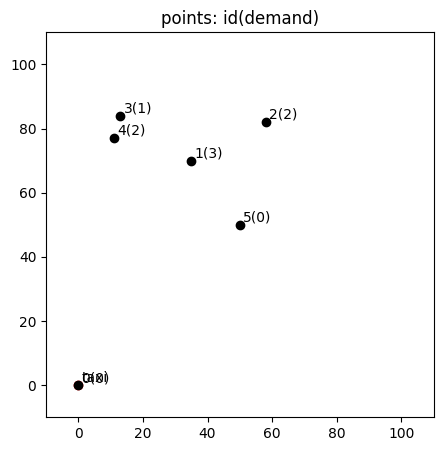

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 371.99749437875687


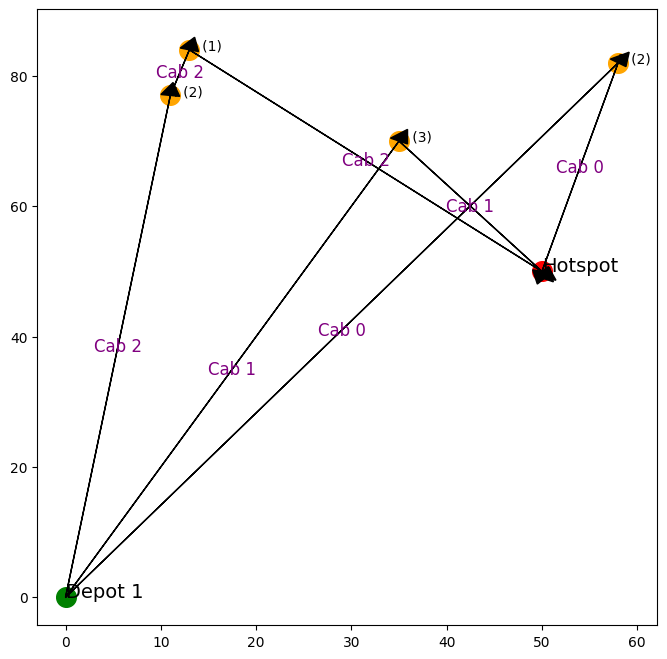

0 133.42388124085903 65.96969000988257 -34.469346226035185
{2}
1 103.26237921249263 75.0 9.237620787507367
{1}
2 128.03112403612468 50.24937810560445 -52.657056877718006
{3}
    x   y  demand  priority
1  35  70       3         2
2  58  82       2         2
3  13  84       1         2
Iteration  18
    x   y  demand  priority
0   0   0       0         0
1  57  38       2         1
2  19  32       2         1
3  48  57       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  57  38       2         1
2  19  32       2         1
3  48  57       3         1
4  35  70       3         2
5  58  82       2         2
6  13  84       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


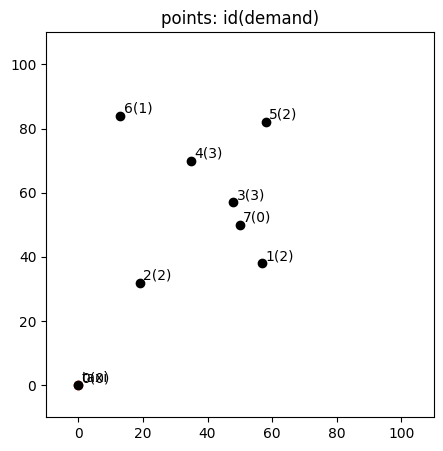

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 503.55061372817283


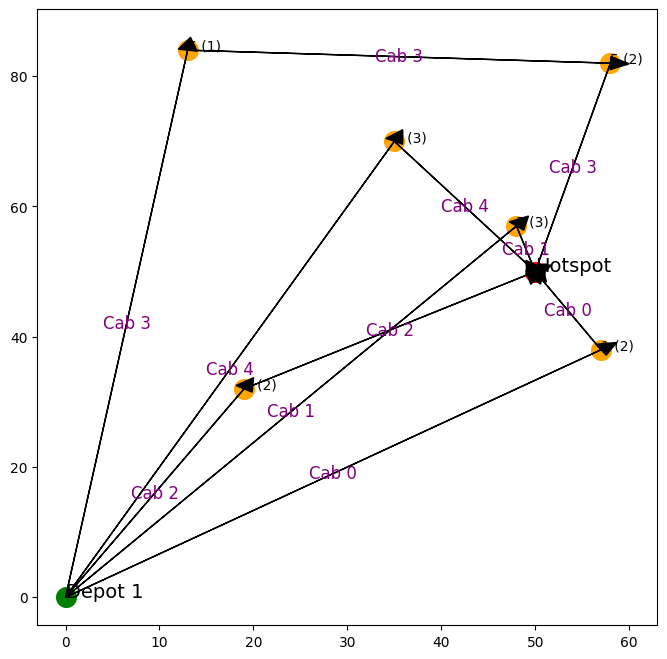

0 82.3979182232656 27.784887978899608 -40.72058625491619
{1}
1 81.79856397952585 21.840329667841555 -49.03806947776352
{3}
2 73.06248478972662 71.69379331573968 34.47820518388289
{2}
    x   y  demand  priority
1  57  38       2         2
3  48  57       3         2
Iteration  19
    x   y  demand  priority
0   0   0       0         0
1  65  82       1         1
2  42  81       2         1
3  71  41       3         1
4  31  98       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  65  82       1         1
2  42  81       2         1
3  71  41       3         1
4  31  98       2         1
5  57  38       2         2
6  48  57       3         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


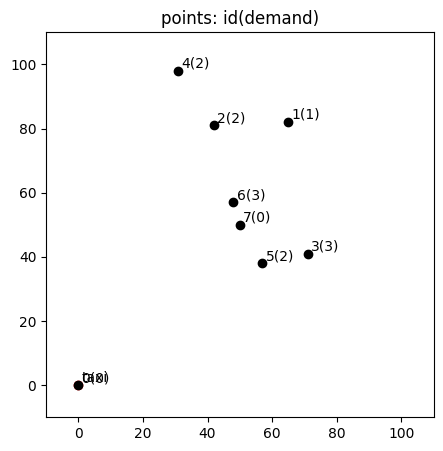

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 567.9926330256177


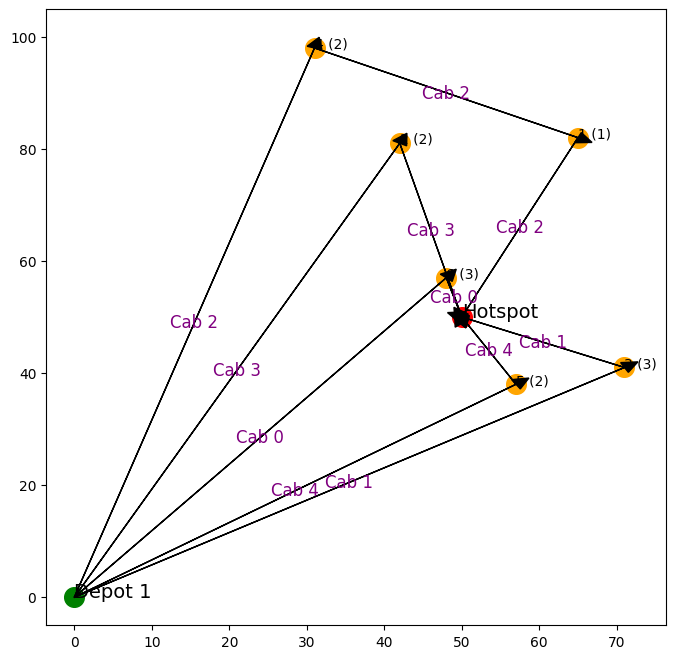

1 104.83512328867026 68.54195795277518 -2.0221863595075007
{3}
2 138.1273799364065 35.34119409414458 -85.11558879518962
{1}
3 123.25705914163754 64.03124237432849 -27.210195580144813
{2}
    x   y  demand  priority
1  65  82       1         2
2  42  81       2         2
3  71  41       3         2
Iteration  20
    x   y  demand  priority
0   0   0       0         0
1  15  15       2         1
2  91  38       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  15  15       2         1
2  91  38       1         1
3  65  82       1         2
4  42  81       2         2
5  71  41       3         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


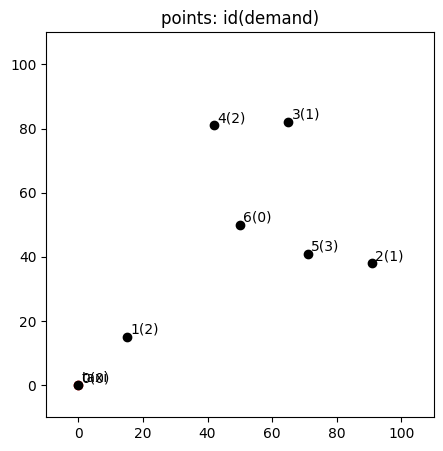

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 397.77673649033625


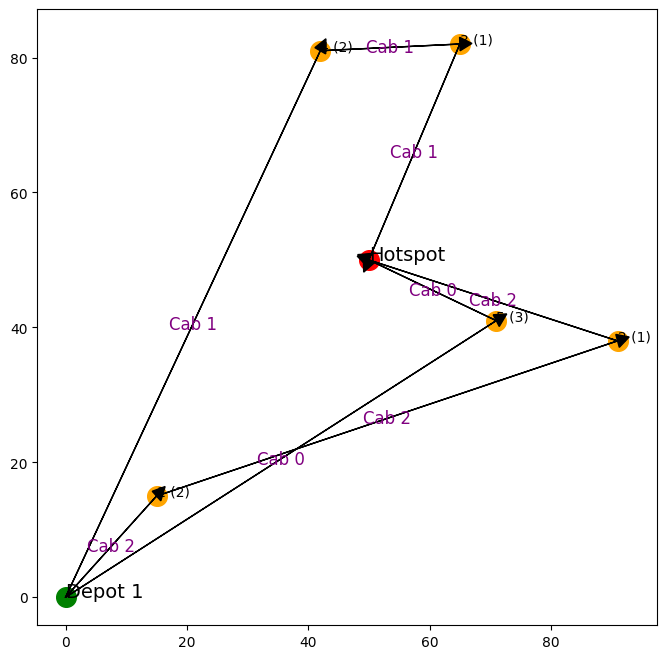

2 143.33725228660535 141.7149680927043 69.2351998524511
{1, 2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  21
    x   y  demand  priority
0   0   0       0         0
1  10  28       3         1
2  29  76       3         1
3  76  48       2         1
4   6  45       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  10  28       3         1
2  29  76       3         1
3  76  48       2         1
4   6  45       1         1
5  50  50       0         1


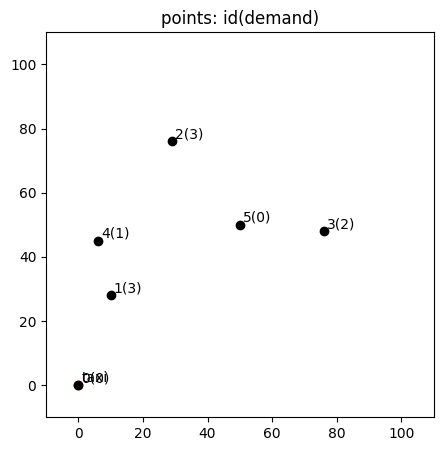

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 331.6887844916968


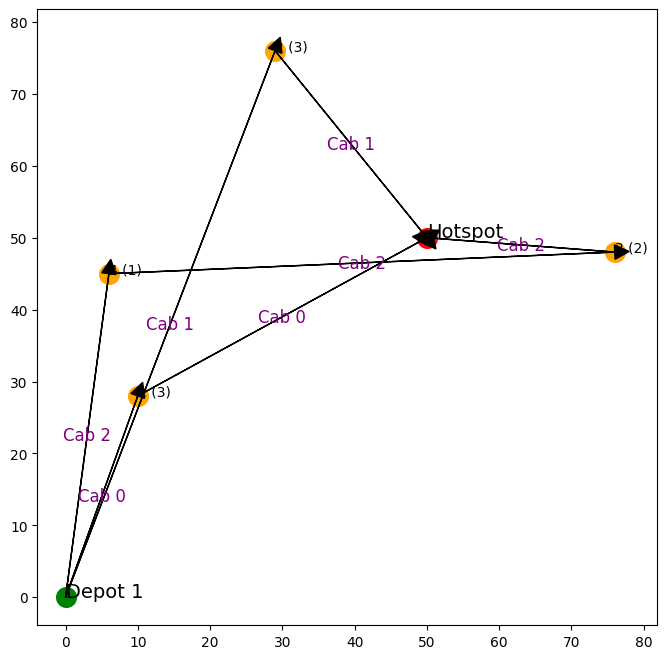

0 75.38298633669032 136.95254652615992 130.04583345254954
{1}
1 114.76649446051779 100.26464980241042 35.630480243097836
{2}
2 71.47504747207526 52.15361924162119 6.755381390356533
{3}
    x   y  demand  priority
3  76  48       2         2
Iteration  22
    x   y  demand  priority
0   0   0       0         0
1  81  90       2         1
2  54  17       2         1
3  21  50       2         1
4  77   8       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  81  90       2         1
2  54  17       2         1
3  21  50       2         1
4  77   8       1         1
5  76  48       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


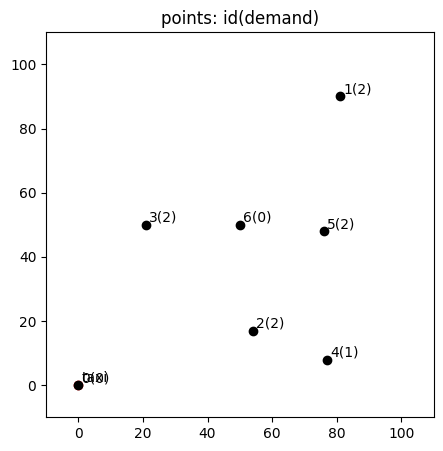

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 488.2779638872137


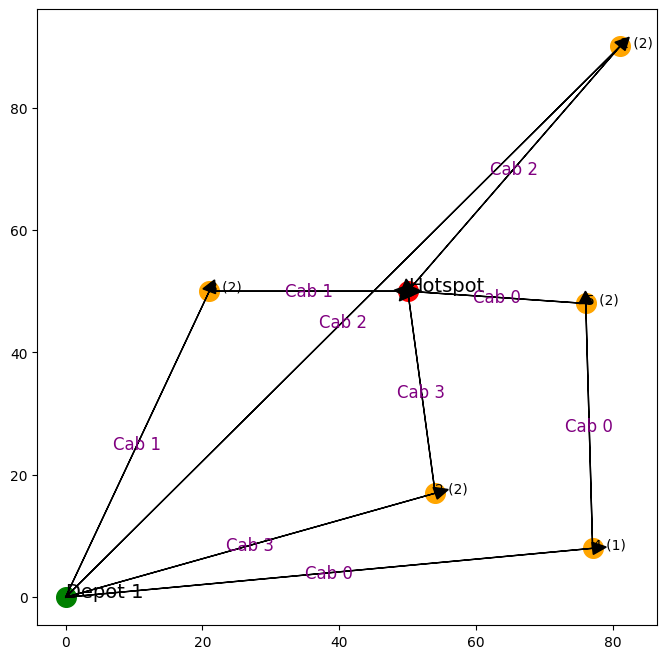

1 83.230987451825 58.0 3.7690125481749988
{3}
2 171.6889401391834 101.21264743103995 -19.869968992623456
{1}
3 89.85425969606197 66.48308055437865 9.870361135505988
{2}
    x   y  demand  priority
1  81  90       2         2
2  54  17       2         2
3  21  50       2         2
Iteration  23
    x   y  demand  priority
0   0   0       0         0
1  76  23       3         1
2  37   2       1         1
3  27  36       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  76  23       3         1
2  37   2       1         1
3  27  36       1         1
4  81  90       2         2
5  54  17       2         2
6  21  50       2         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


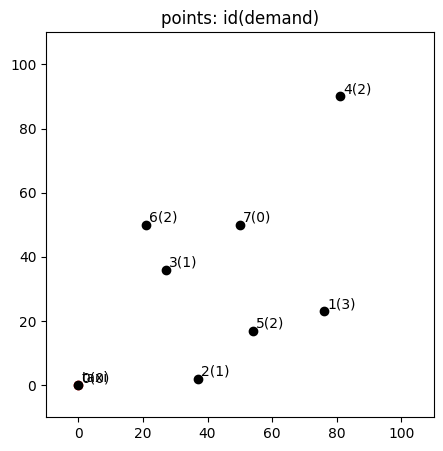

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 465.05932628989245


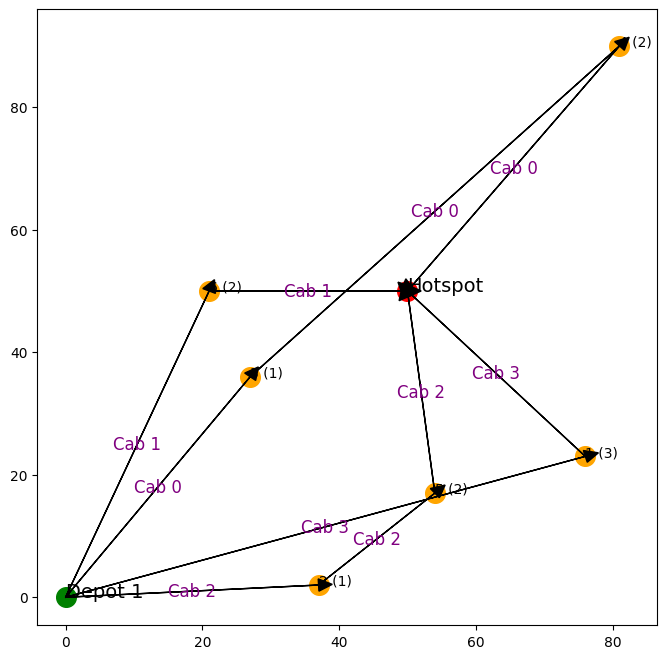

3 116.8873597524039 112.44998888394788 51.78762357351793
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  24
    x   y  demand  priority
0   0   0       0         0
1  59  94       3         1
2  54  54       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  59  94       3         1
2  54  54       1         1
3  50  50       0         1


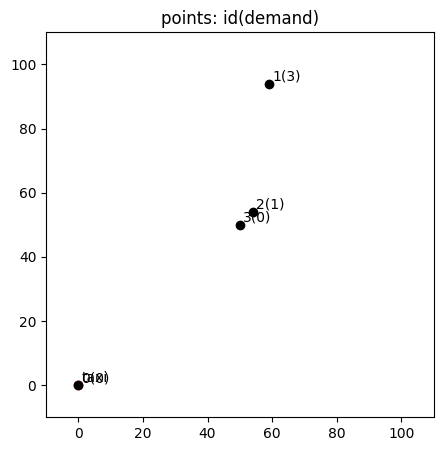

-1
1
Vehicle Requirements: 2
Moving Distance: 237.91739028277254


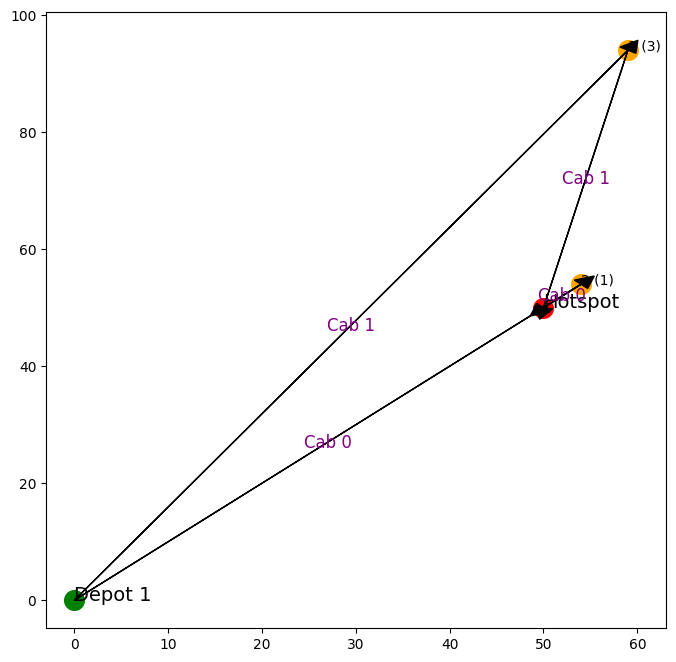

0 82.02438661763952 5.656854249492381 -73.53910524340095
{2}
1 155.89300366513302 134.7330694373137 46.20660049083753
{1}
    x   y  demand  priority
2  54  54       1         2
Iteration  25
    x   y  demand  priority
0   0   0       0         0
1  94   9       2         1
2  87  81       3         1
3  73  49       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  94   9       2         1
2  87  81       3         1
3  73  49       1         1
4  54  54       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


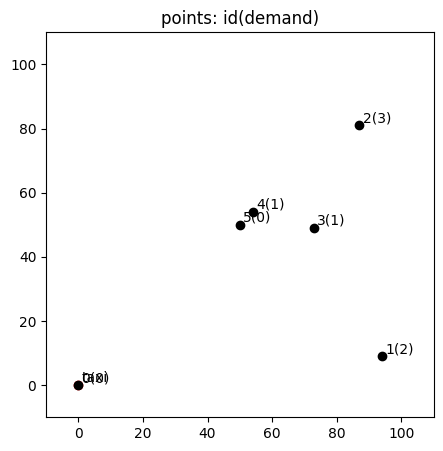

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 411.79316171414484


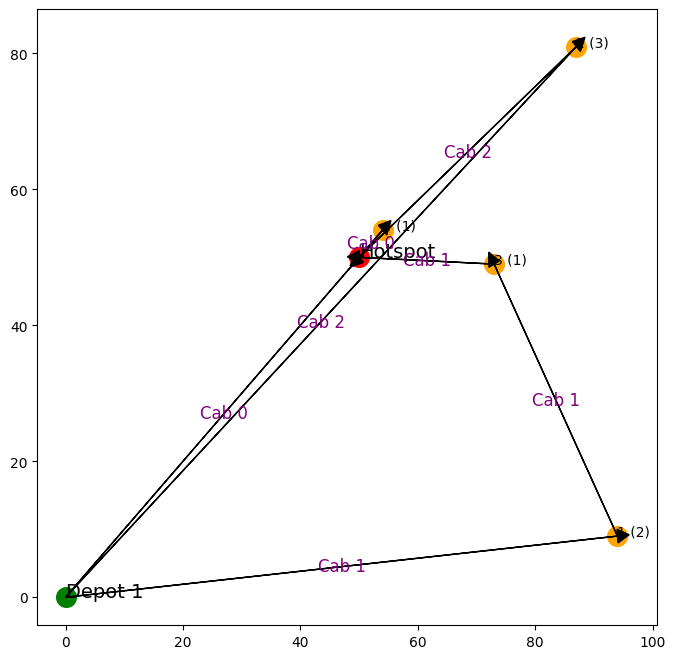

1 162.62902501496296 143.30472849648183 52.328067729759766
{1, 3}
2 167.1397500815424 144.81022063376605 50.07558086910669
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  26
    x   y  demand  priority
0   0   0       0         0
1  19  74       2         1
2   4  75       2         1
3  54  85       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  19  74       2         1
2   4  75       2         1
3  54  85       3         1
4  50  50       0         1


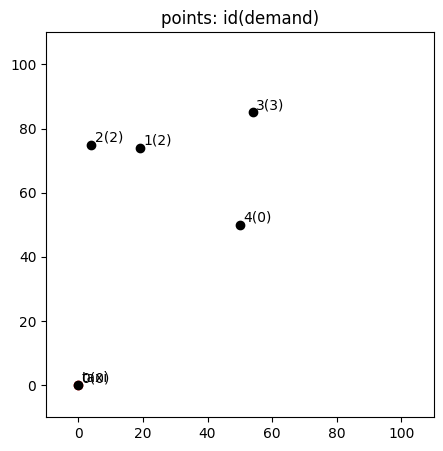

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 378.9963668706769


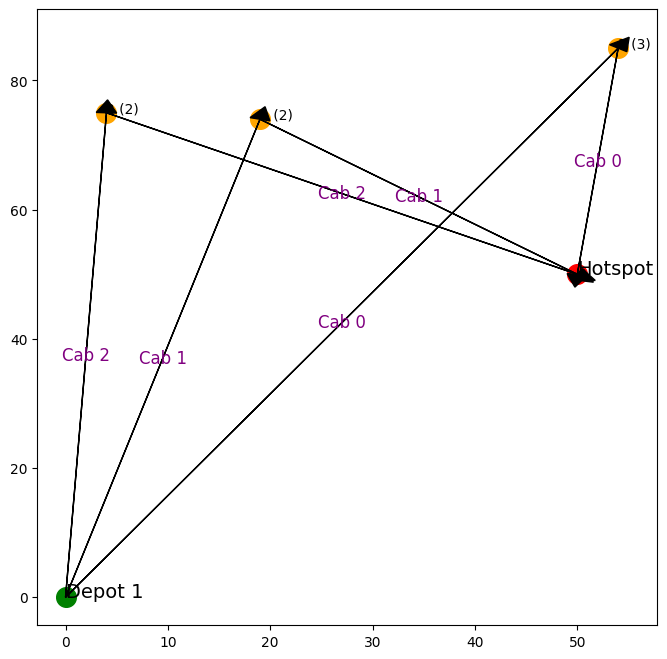

0 135.93036214986012 105.68348972285122 22.594872434416715
{3}
1 115.60485334748155 78.40918313565064 2.008921355994403
{1}
2 127.4611513733353 104.70912090166739 29.60252997916578
{2}
    x   y  demand  priority
1  19  74       2         2
Iteration  27
    x   y  demand  priority
0   0   0       0         0
1  98   0       1         1
2  89   9       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  98   0       1         1
2  89   9       3         1
3  19  74       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


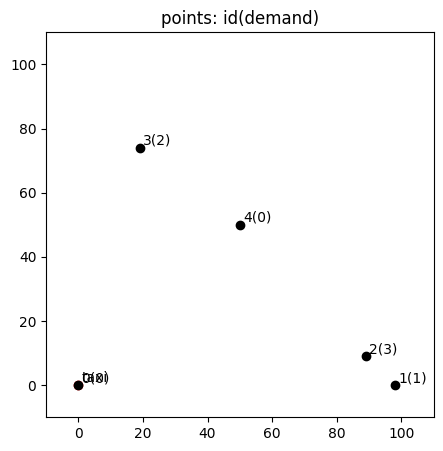

-1
1
Vehicle Requirements: 2
Moving Distance: 391.48979997970287


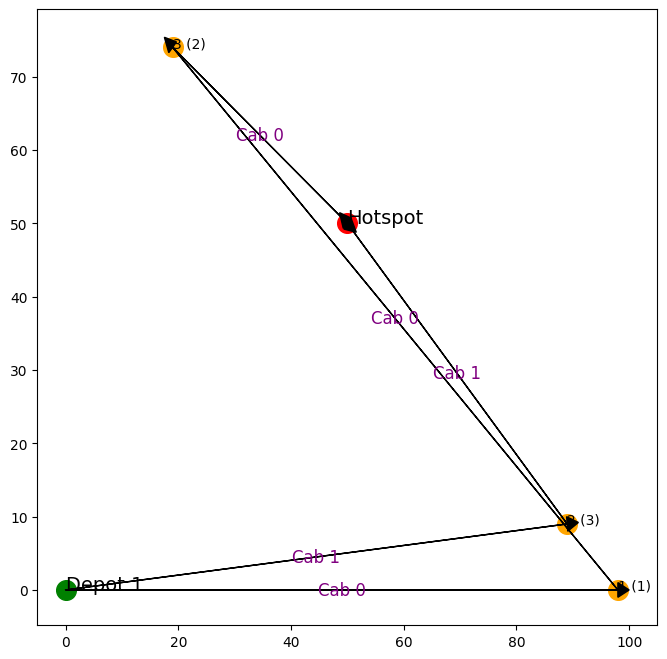

1 146.04011614437562 169.7586522095413 108.59786216993635
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  28
    x   y  demand  priority
0   0   0       0         0
1  37  93       1         1
2   3  85       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  37  93       1         1
2   3  85       3         1
3  50  50       0         1


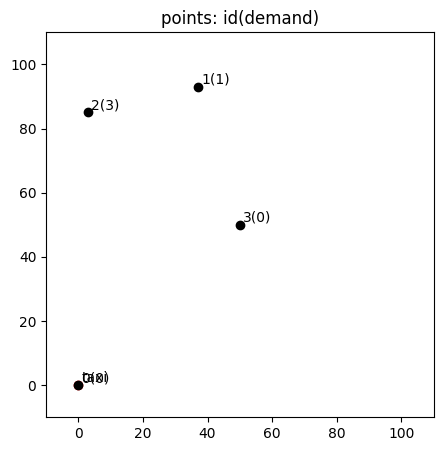

-1
1
Vehicle Requirements: 2
Moving Distance: 288.66538042263556


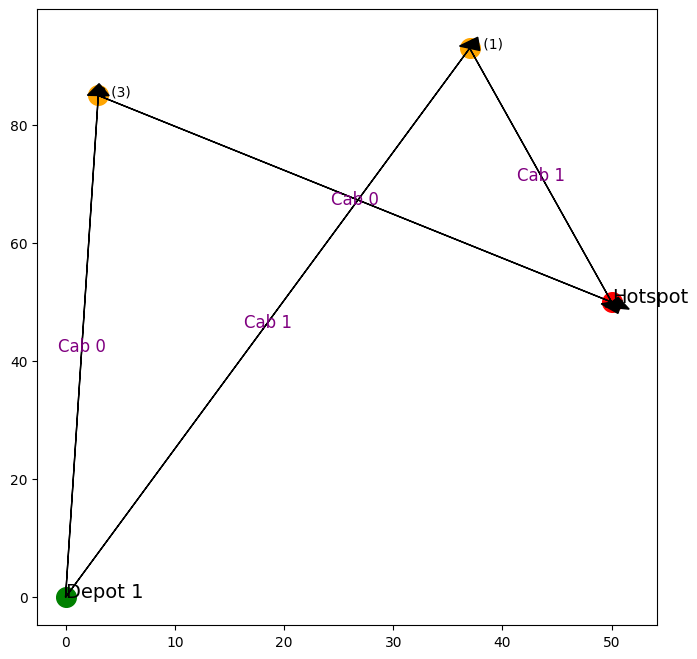

0 143.65326599579413 175.80102388780335 120.0482698359109
{2}
1 145.01211442684144 44.9221548904324 -77.62888209119284
{1}
    x   y  demand  priority
1  37  93       1         2
Iteration  29
    x   y  demand  priority
0   0   0       0         0
1  45  66       2         1
2  67  18       3         1
3   7  97       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  45  66       2         1
2  67  18       3         1
3   7  97       2         1
4  37  93       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


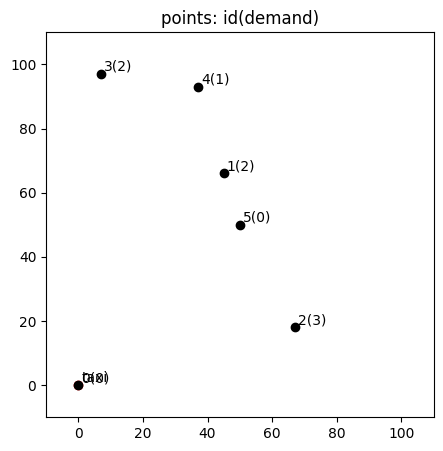

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 374.6952426187922


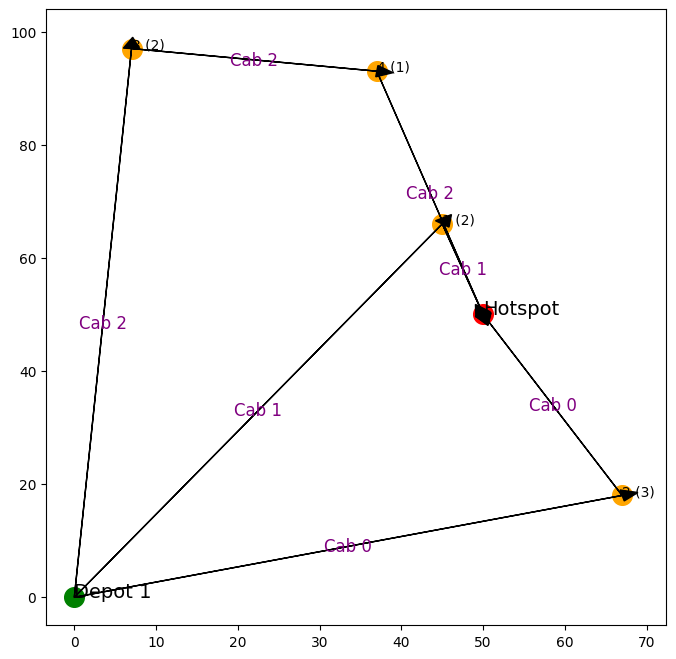

0 105.61113014779667 108.70602559196062 57.44790824014427
{2}
1 96.6442163484063 33.52610922848042 -46.35505250568567
{1}
    x   y  demand  priority
1  45  66       2         2
Iteration  30
    x   y  demand  priority
0   0   0       0         0
1  28  99       1         1
2  80  46       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  28  99       1         1
2  80  46       1         1
3  45  66       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


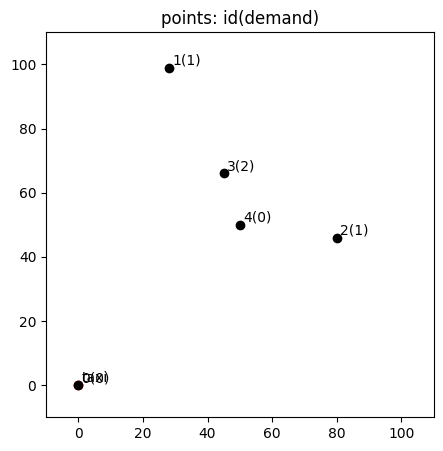

-1
1
Vehicle Requirements: 2
Moving Distance: 279.3155740428958


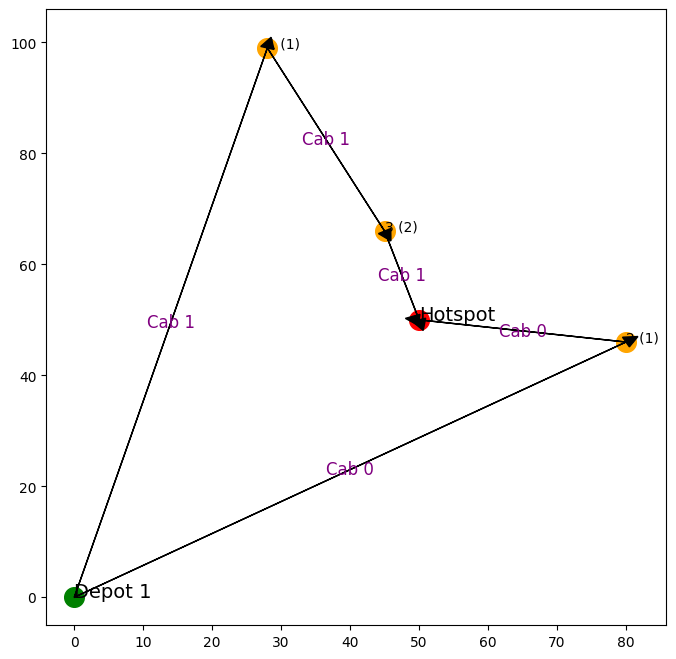

0 122.54766786131773 30.265491900843113 -77.14943001005307
{2}
    x   y  demand  priority
2  80  46       1         2
Iteration  31
    x   y  demand  priority
0   0   0       0         0
1  46  54       3         1
2  42  97       1         1
3  72  68       2         1
4   5  91       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  46  54       3         1
2  42  97       1         1
3  72  68       2         1
4   5  91       3         1
5  80  46       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


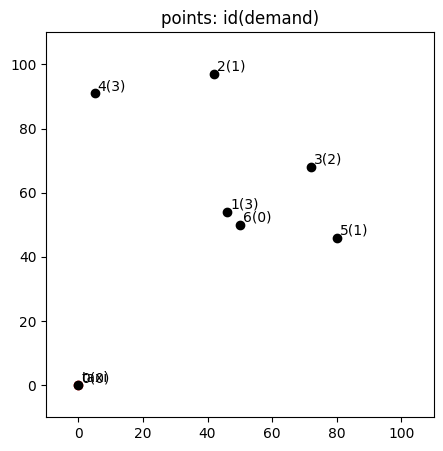

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 526.1029486086804


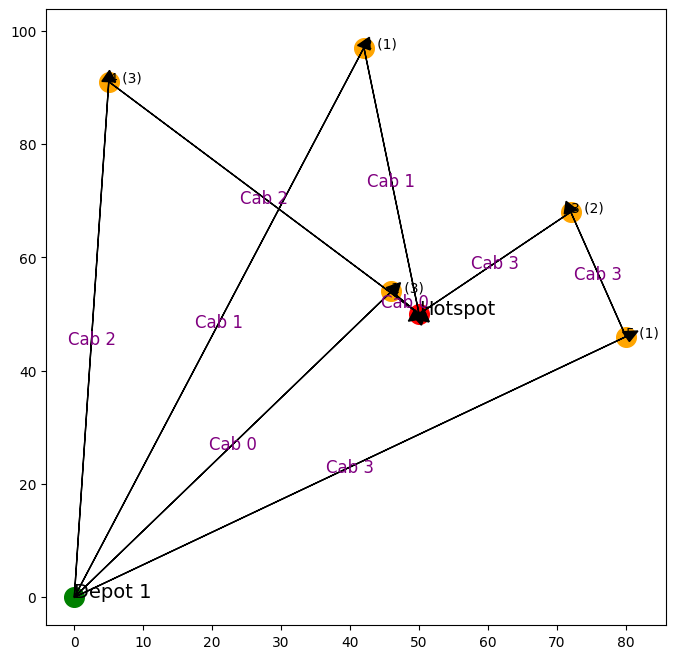

0 76.59344565336518 16.970562748477143 -51.13760153064946
{1}
1 153.37840222488435 47.67598976424087 -81.86441757852305
{2}
2 152.01418414141327 182.6307750626931 121.93197845262634
{4}
3 120.70751676757841 56.85068161420758 -35.431494346267044
{3}
    x   y  demand  priority
1  46  54       3         2
2  42  97       1         2
3  72  68       2         2
Iteration  32
    x   y  demand  priority
0   0   0       0         0
1  80  93       2         1
2  10  13       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  80  93       2         1
2  10  13       2         1
3  46  54       3         2
4  42  97       1         2
5  72  68       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


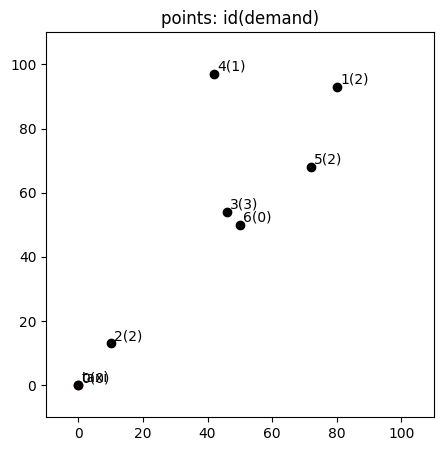

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 471.28714978114886


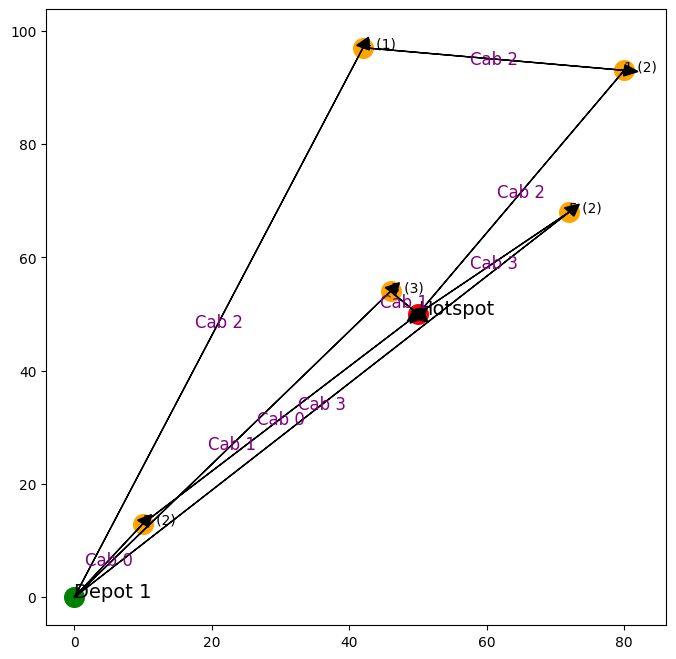

0 70.88975037015784 108.97706180660222 92.57584233974548
{2}
2 158.13331937631682 104.86181383134664 -0.8405986292968635
{1}
    x   y  demand  priority
1  80  93       2         2
Iteration  33
    x   y  demand  priority
0   0   0       0         0
1   7  77       1         1
2  46  65       3         1
3  77  37       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   7  77       1         1
2  46  65       3         1
3  77  37       3         1
4  80  93       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


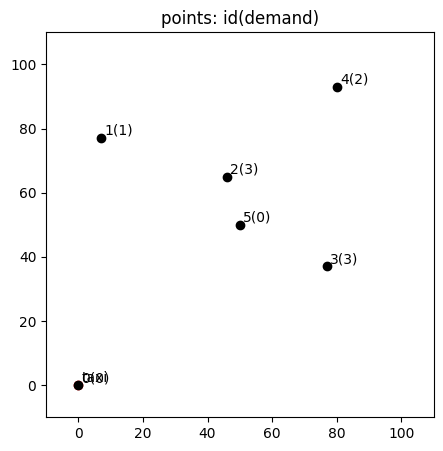

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 415.03084316908905


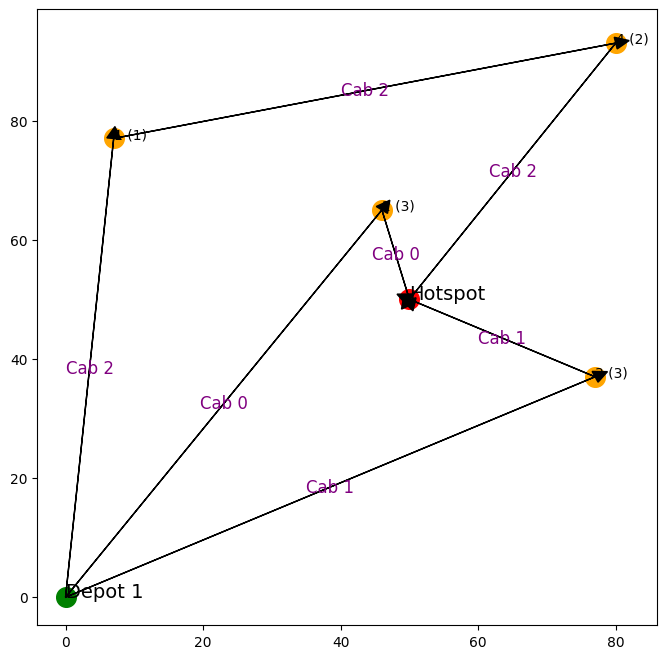

0 95.15457090273384 46.57252408878007 -25.29578476956374
{2}
1 115.39498066423756 89.89994438263018 19.454935909707714
{3}
    x   y  demand  priority
2  46  65       3         2
3  77  37       3         2
Iteration  34
    x   y  demand  priority
0   0   0       0         0
1   8   3       2         1
2  92  60       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   8   3       2         1
2  92  60       1         1
3  46  65       3         2
4  77  37       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


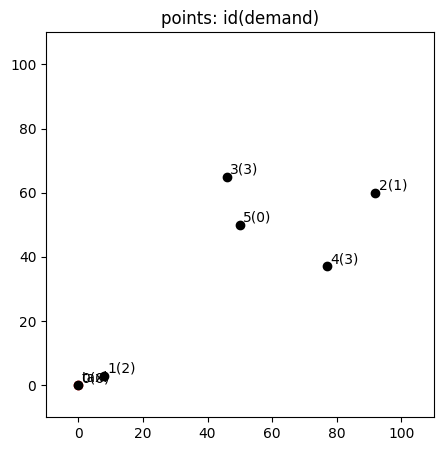

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 363.78116749626656


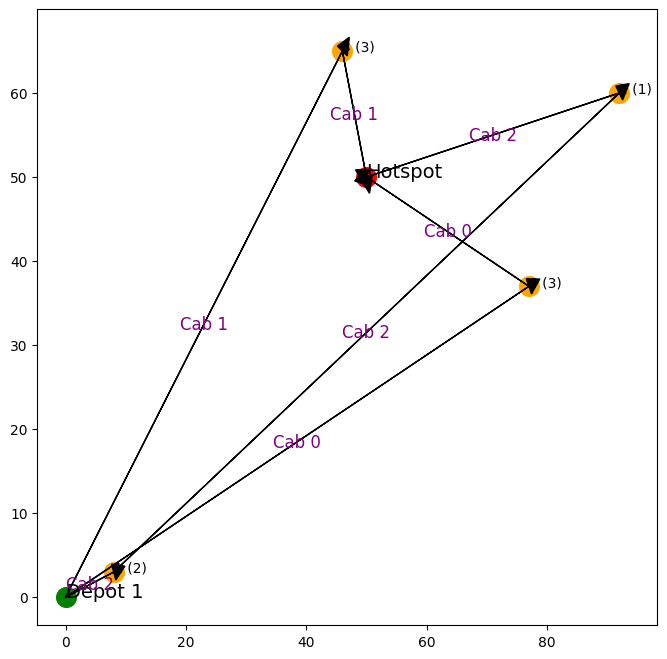

2 153.23161592929512 169.2375423644012 100.62469761730671
{1, 2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  35
    x   y  demand  priority
0   0   0       0         0
1  66   5       2         1
2  54  31       2         1
3  74   4       3         1
4  45  72       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  66   5       2         1
2  54  31       2         1
3  74   4       3         1
4  45  72       3         1
5  50  50       0         1


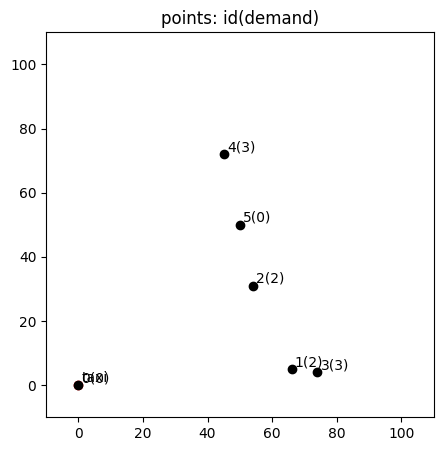

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 429.0903617344633


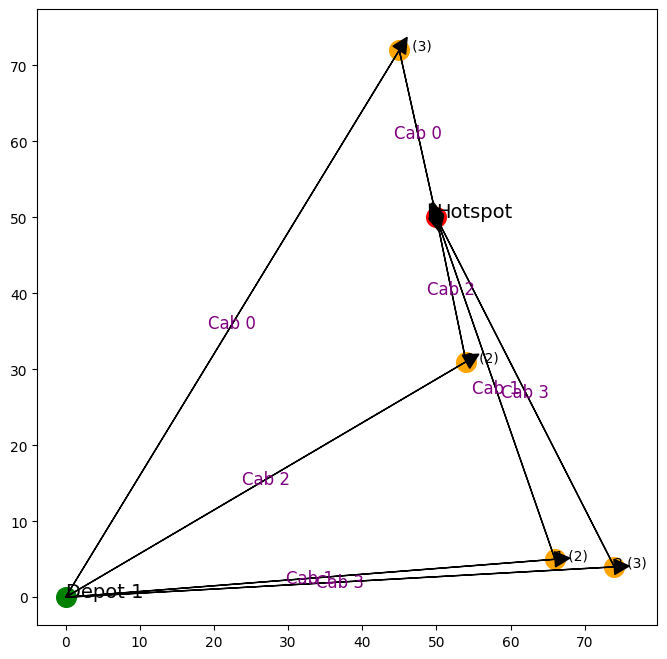

0 107.4668585338664 67.68308503607086 -5.942230979760097
{4}
1 113.94893871852986 95.51963149007642 29.330508516584757
{1}
2 81.68204814317998 38.8329756778952 -23.43258462633719
{2}
3 125.99251633888701 155.65346125287417 107.48767554042422
{3}
    x   y  demand  priority
2  54  31       2         2
4  45  72       3         2
Iteration  36
    x   y  demand  priority
0   0   0       0         0
1  54  50       3         1
2  18  63       2         1
3  10  33       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  54  50       3         1
2  18  63       2         1
3  10  33       3         1
4  54  31       2         2
5  45  72       3         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


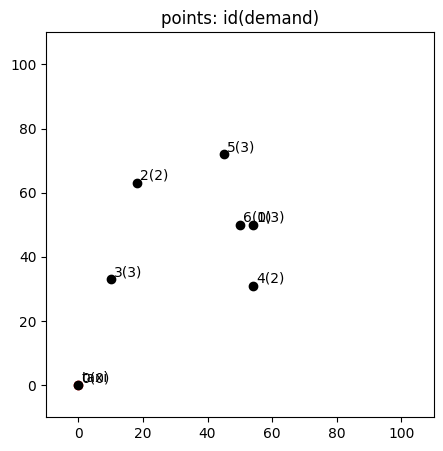

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 444.74771265414324


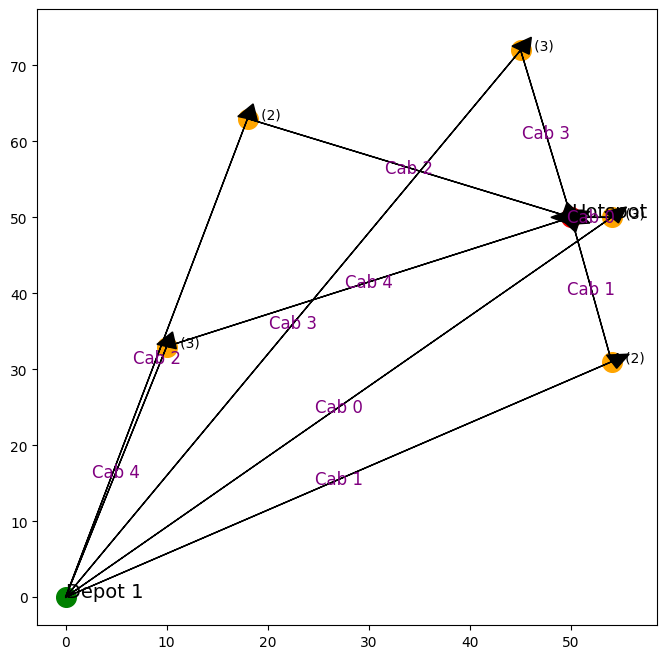

0 77.59347797189639 12.0 -59.59347797189639
{1}
2 100.06082108186575 69.07966415668217 3.558675153157509
{2}
4 77.94450692333479 130.3878828726044 117.6373173855718
{3}
    x   y  demand  priority
1  54  50       3         2
2  18  63       2         2
Iteration  37
    x   y  demand  priority
0   0   0       0         0
1  72  91       1         1
2  74   7       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  72  91       1         1
2  74   7       3         1
3  54  50       3         2
4  18  63       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


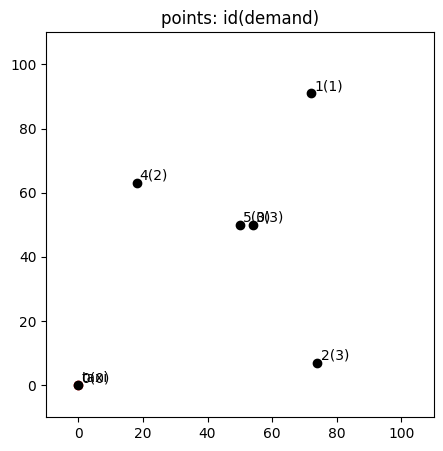

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 374.04628552050366


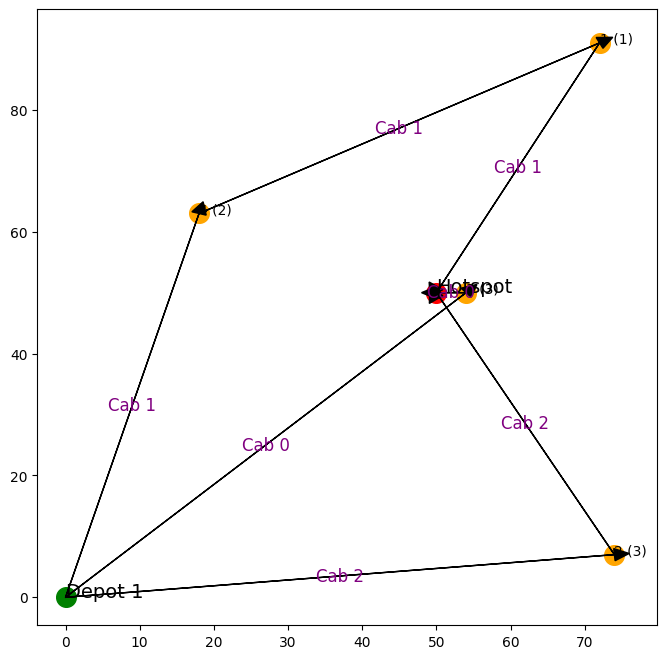

1 112.05054950005203 46.52956049652737 -42.256208755260985
{1}
2 123.57463274557304 147.73286702694156 98.0246677948393
{2}
    x   y  demand  priority
1  72  91       1         2
Iteration  38
    x   y  demand  priority
0   0   0       0         0
1  38  23       2         1
2  77  42       3         1
3   9  16       1         1
4  35  84       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  38  23       2         1
2  77  42       3         1
3   9  16       1         1
4  35  84       1         1
5  72  91       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


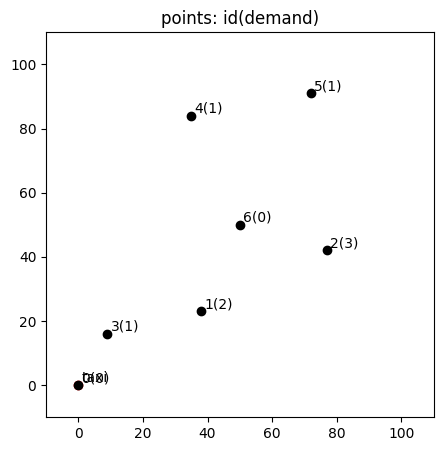

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 365.17960222560686


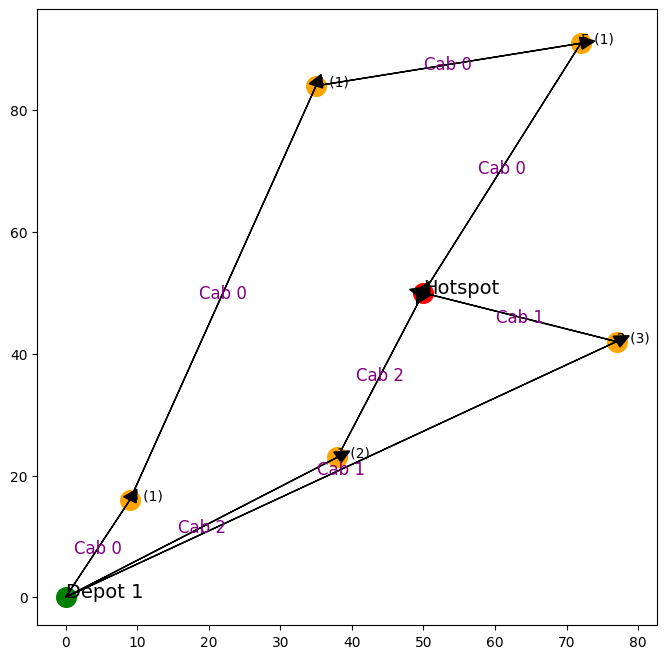

1 115.87000428364912 84.48076704197234 10.85114627930939
{2}
2 73.96503803441394 59.09314681077663 14.67468218175101
{1}
    x   y  demand  priority
1  38  23       2         2
2  77  42       3         2
Iteration  39
    x   y  demand  priority
0   0   0       0         0
1  59  44       3         1
2  88  64       1         1
3  62  67       2         1
4  79  85       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  59  44       3         1
2  88  64       1         1
3  62  67       2         1
4  79  85       3         1
5  38  23       2         2
6  77  42       3         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


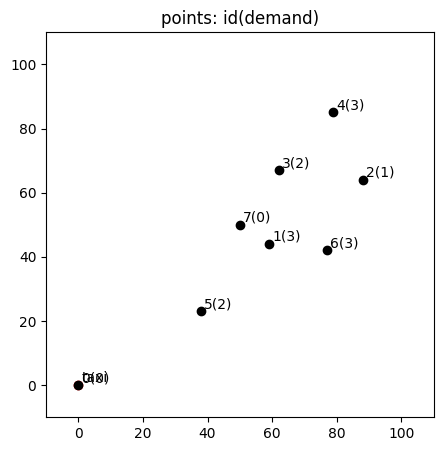

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 591.5412568087403


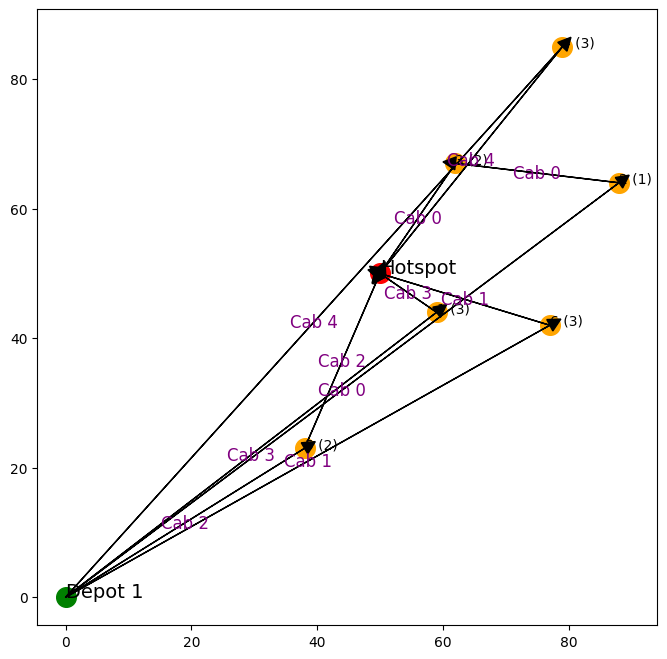

0 155.79292077317317 82.1142175560028 -32.62159443916897
{2, 3}
3 84.41692556502076 32.449961479175904 -35.7419833462569
{1}
4 161.4963681524833 136.35981812836215 43.043359040059926
{4}
    x   y  demand  priority
1  59  44       3         2
2  88  64       1         2
3  62  67       2         2
Iteration  40
    x   y  demand  priority
0   0   0       0         0
1  93  18       3         1
2  25  23       1         1
3  86  97       1         1
4  33  49       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  93  18       3         1
2  25  23       1         1
3  86  97       1         1
4  33  49       1         1
5  59  44       3         2
6  88  64       1         2
7  62  67       2         2
8  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


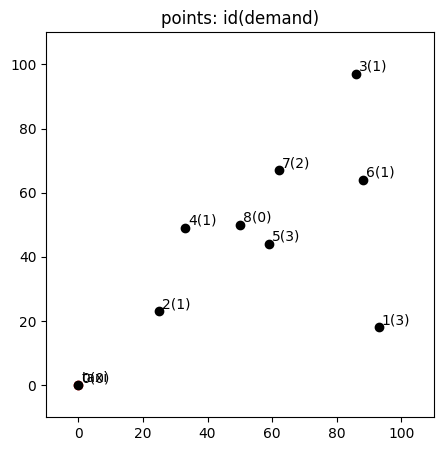

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 548.160837817423


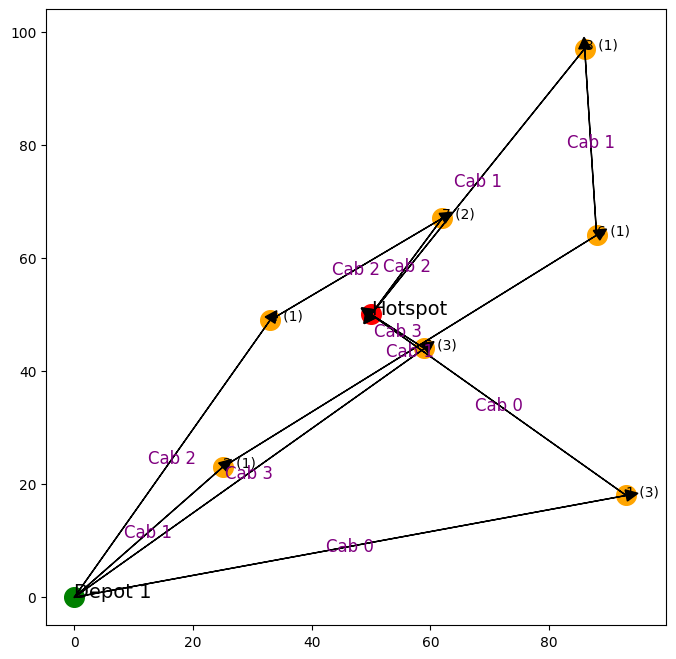

0 148.32629355611124 160.80111939908875 92.87538554252188
{1}
1 168.34009785725334 95.99977944841093 -24.340428684636947
{2, 3}
    x   y  demand  priority
2  25  23       1         2
3  86  97       1         2
Iteration  41
    x   y  demand  priority
0   0   0       0         0
1  69  36       2         1
2  74  85       3         1
3  97  85       3         1
4  56  15       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  69  36       2         1
2  74  85       3         1
3  97  85       3         1
4  56  15       2         1
5  25  23       1         2
6  86  97       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


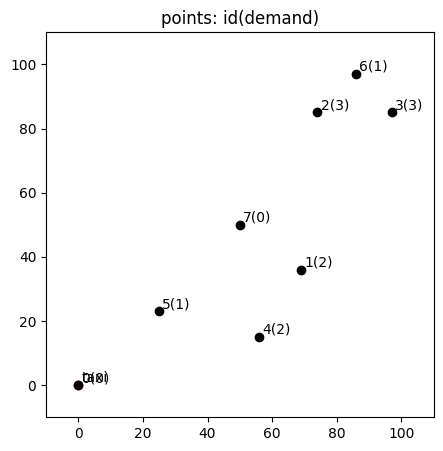

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 644.5612007821317


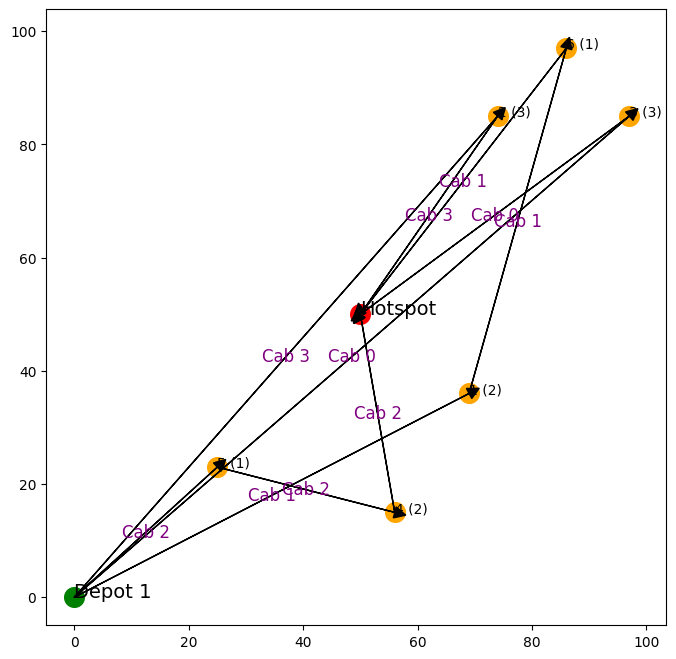

0 187.57320665915725 175.80102388780335 76.12832917254778
{3}
2 69.48113731205547 71.02112361825881 37.05054811533276
{4}
3 155.1369037389046 127.31457104353767 35.83495282640189
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  42
    x   y  demand  priority
0   0   0       0         0
1  10  39       1         1
2  86  49       3         1
3  19  52       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  10  39       1         1
2  86  49       3         1
3  19  52       1         1
4  50  50       0         1


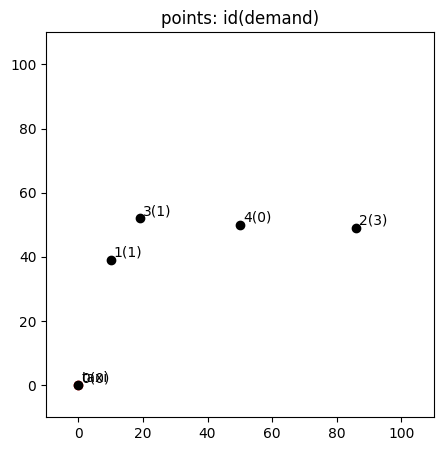

-1
1
Vehicle Requirements: 2
Moving Distance: 222.13116384215


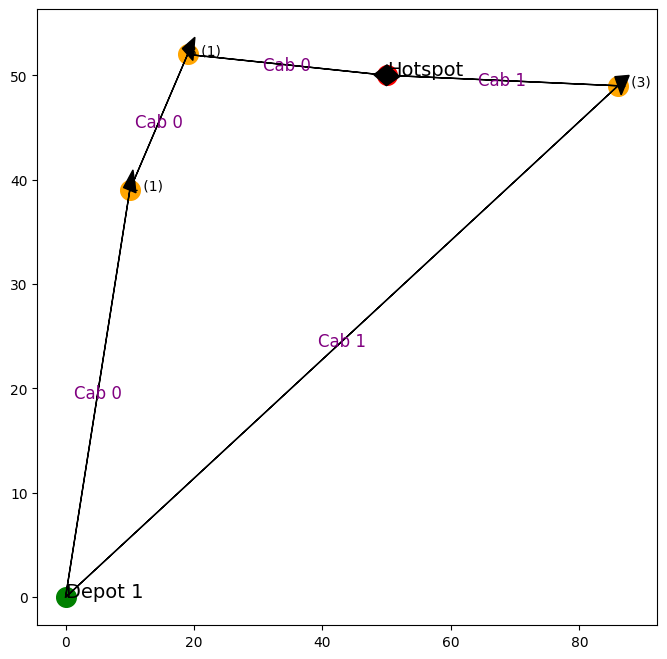

0 87.13748171325483 72.54938615940122 21.686597525847006
{1, 3}
1 134.99368212889516 108.04165863221465 27.068805819426814
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  43
    x   y  demand  priority
0   0   0       0         0
1  46  17       3         1
2  14   3       2         1
3  17  68       1         1
4  98  82       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  46  17       3         1
2  14   3       2         1
3  17  68       1         1
4  98  82       2         1
5  50  50       0         1


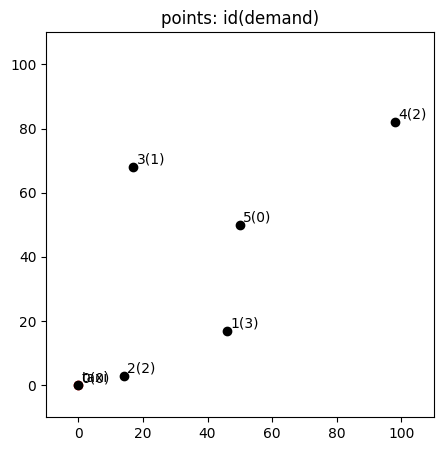

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 365.7857904170577


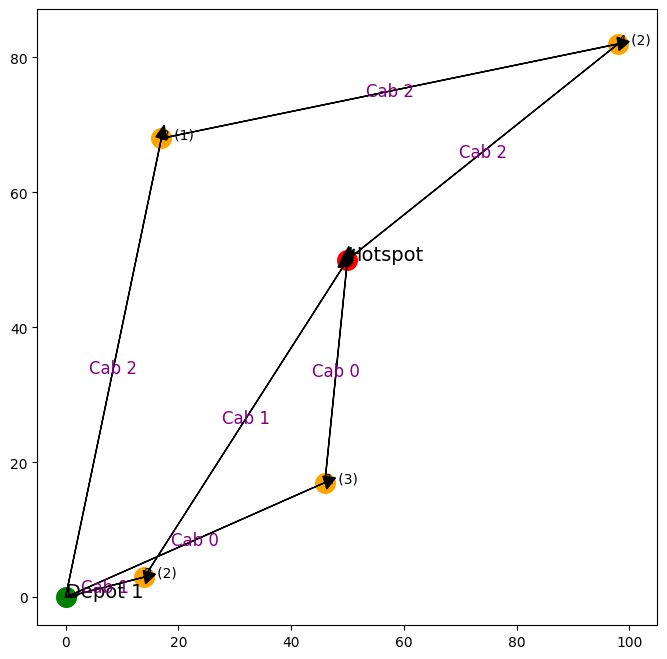

0 82.28233961814624 99.72462083156796 67.3045916292057
{1}
1 73.5208615257391 118.40608092492548 104.0882598616491
{2}
2 209.98258927317235 152.96753307327265 19.46871033673662
{3, 4}
    x   y  demand  priority
3  17  68       1         2
4  98  82       2         2
Iteration  44
    x   y  demand  priority
0   0   0       0         0
1  56  71       2         1
2  18  24       1         1
3  36  84       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  56  71       2         1
2  18  24       1         1
3  36  84       3         1
4  17  68       1         2
5  98  82       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


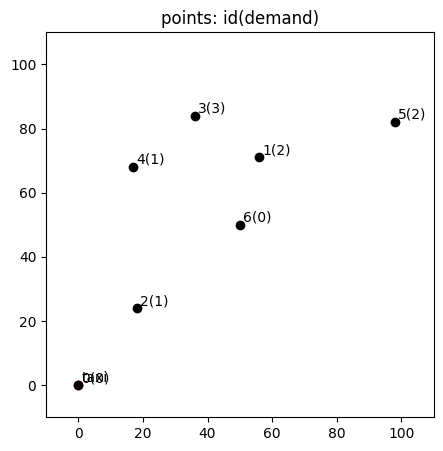

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 445.7089446503338


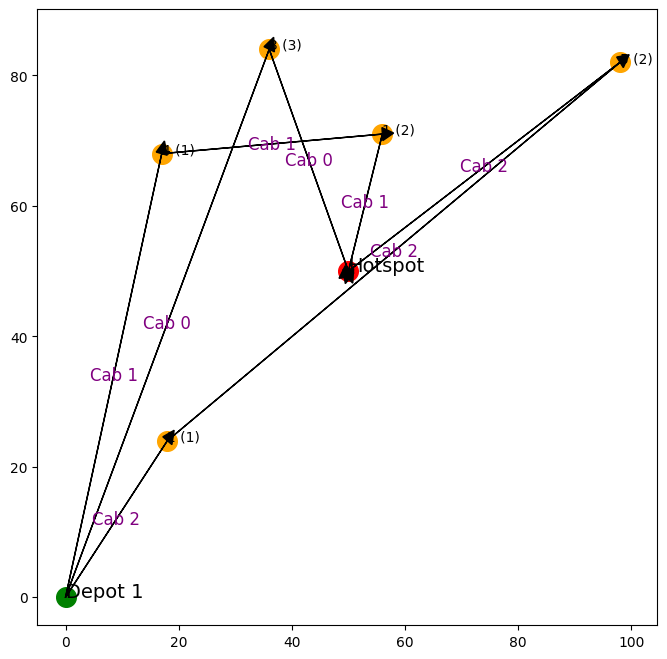

0 128.1588298920674 110.30865786510141 37.30415690558473
{3}
1 91.93312530334178 43.68065933568311 -26.41213629981712
{1}
    x   y  demand  priority
1  56  71       2         2
Iteration  45
    x   y  demand  priority
0   0   0       0         0
1   4  51       2         1
2  63  28       3         1
3  71  94       2         1
4  70  89       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   4  51       2         1
2  63  28       3         1
3  71  94       2         1
4  70  89       3         1
5  56  71       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


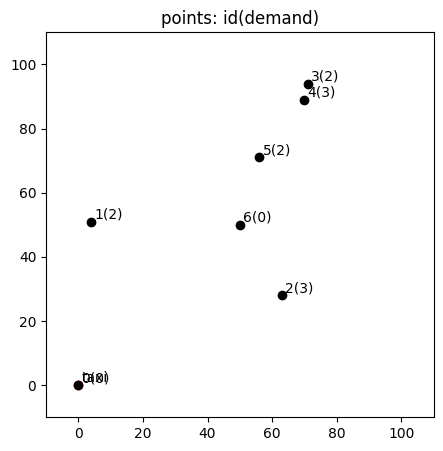

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 627.5446902490213


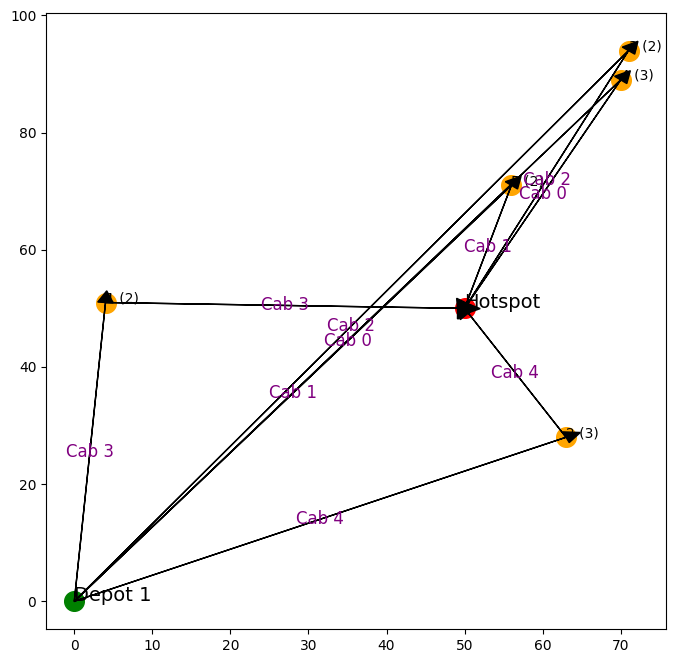

0 157.0590687220095 131.48764200486676 40.172394285290636
{4}
2 166.55516608818579 97.50897394599124 -20.291705169198906
{3}
3 97.16749053102401 92.02173656261873 40.86511431290407
{1}
4 94.49586929093401 76.66159403508382 20.496521761691724
{2}
    x   y  demand  priority
3  71  94       2         2
Iteration  46
    x   y  demand  priority
0   0   0       0         0
1  53  53       1         1
2  28  13       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  53  53       1         1
2  28  13       1         1
3  71  94       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


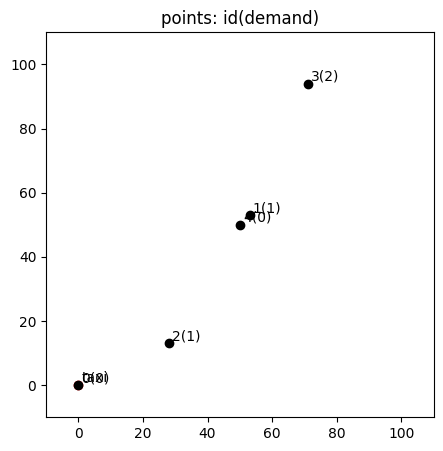

-1
1
Vehicle Requirements: 2
Moving Distance: 240.7377307377137


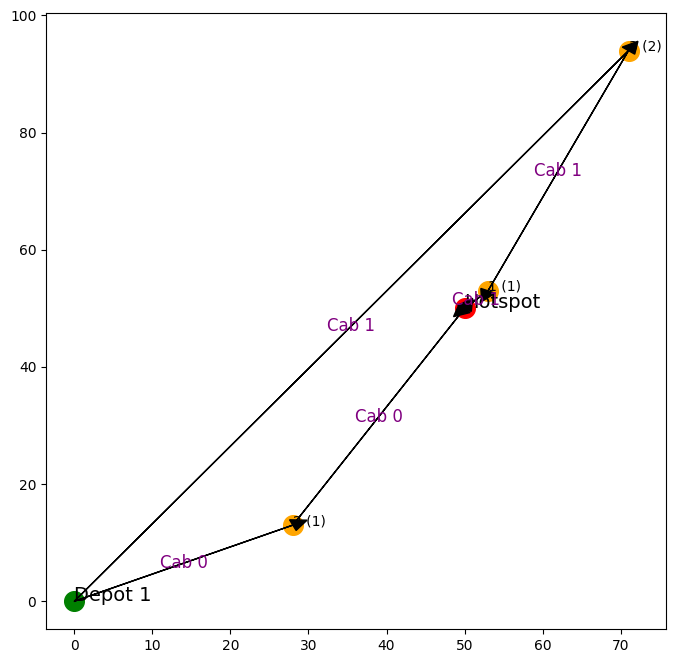

0 73.91718458092802 43.04648650006177 -9.347454830835375
{2}
1 122.04331980230945 4.242640687119285 -115.67935877163053
{1}
    x   y  demand  priority
1  53  53       1         2
2  28  13       1         2
Iteration  47
    x   y  demand  priority
0   0   0       0         0
1   8  87       3         1
2  67  85       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   8  87       3         1
2  67  85       3         1
3  53  53       1         2
4  28  13       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


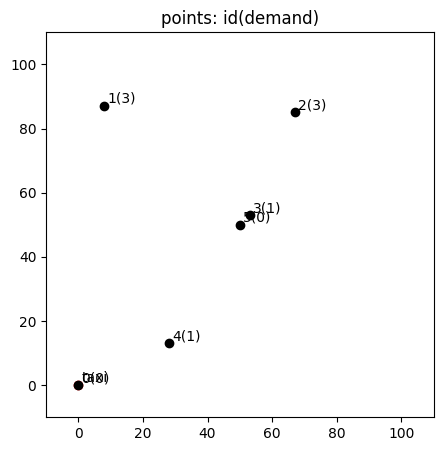

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 372.76488100150436


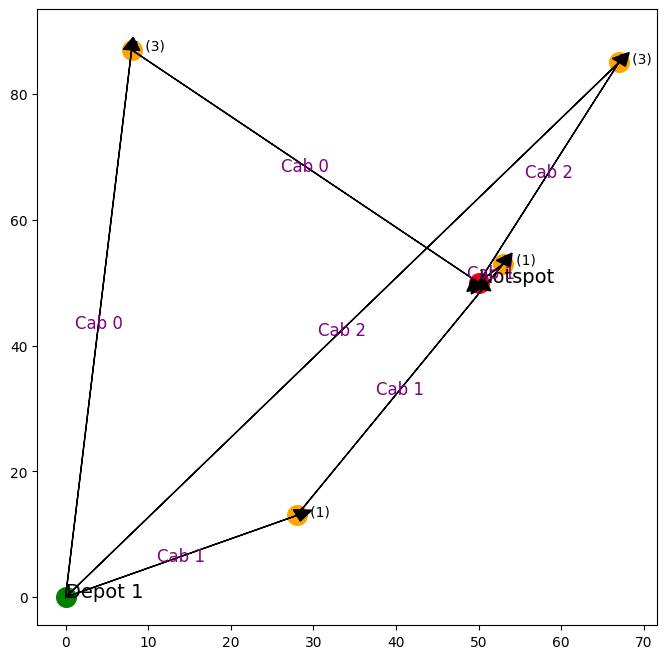

0 143.34024971735687 167.91962362987834 108.53918572746065
{1}
2 147.14138685587895 116.73045875006231 27.95430126921451
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  48
    x   y  demand  priority
0   0   0       0         0
1  67  55       1         1
2  34  80       1         1
3  87  57       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  67  55       1         1
2  34  80       1         1
3  87  57       3         1
4  50  50       0         1


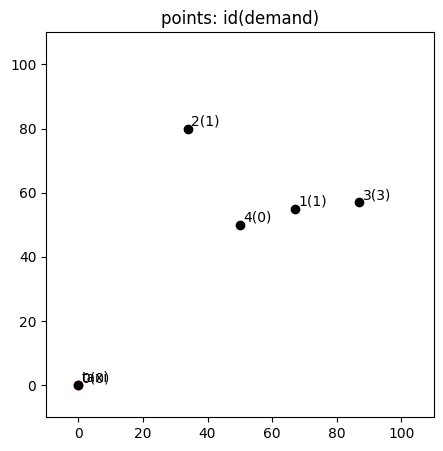

-1
1
Vehicle Requirements: 2
Moving Distance: 287.711739191725


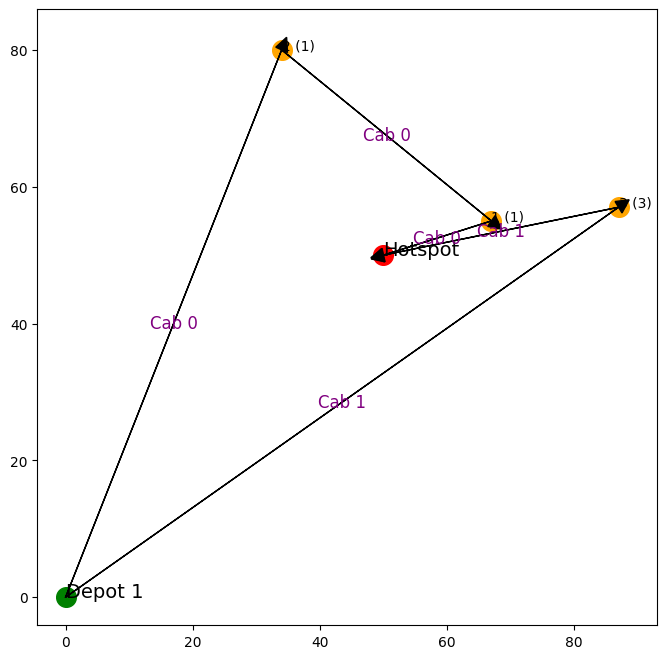

0 104.64530039507227 17.72004514666935 -78.06523267506824
{1}
1 141.66595570768376 112.96902230257639 27.78757774618083
{3}
    x   y  demand  priority
1  67  55       1         2
Iteration  49
    x   y  demand  priority
0   0   0       0         0
1  56   8       3         1
2  59  80       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  56   8       3         1
2  59  80       1         1
3  67  55       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


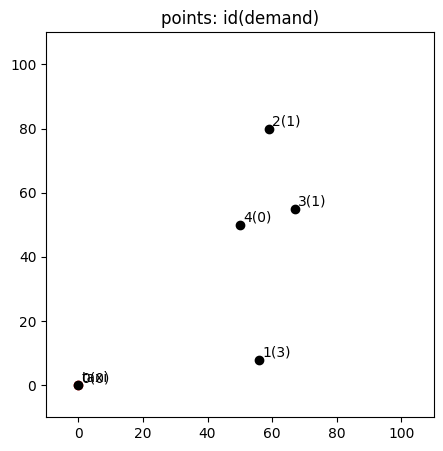

-1
1
Vehicle Requirements: 2
Moving Distance: 242.36702327336369


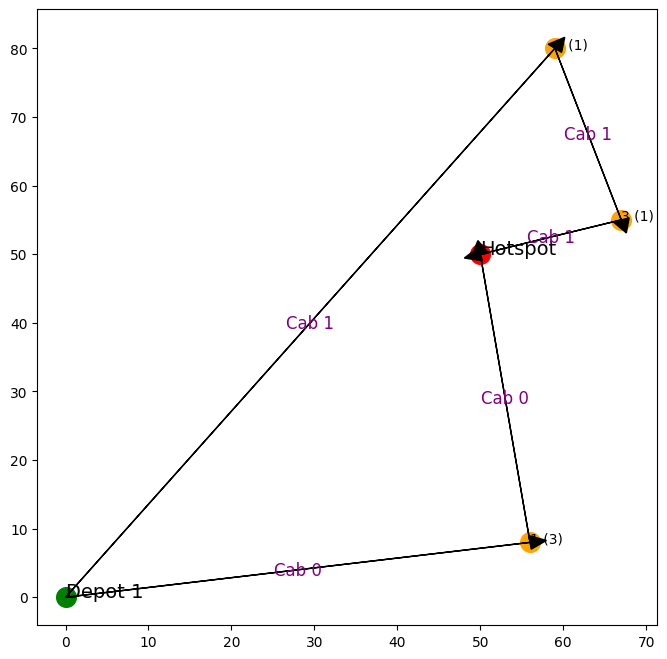

0 98.99494936611666 127.27922061357856 91.92388155425118
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  50
    x   y  demand  priority
0   0   0       0         0
1  31  21       2         1
2  78   1       1         1
3   7  19       1         1
4  91  88       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  31  21       2         1
2  78   1       1         1
3   7  19       1         1
4  91  88       2         1
5  50  50       0         1


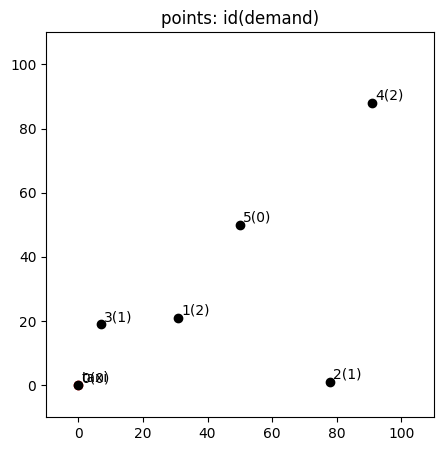

-1
1
Vehicle Requirements: 2
Moving Distance: 300.87552945113794


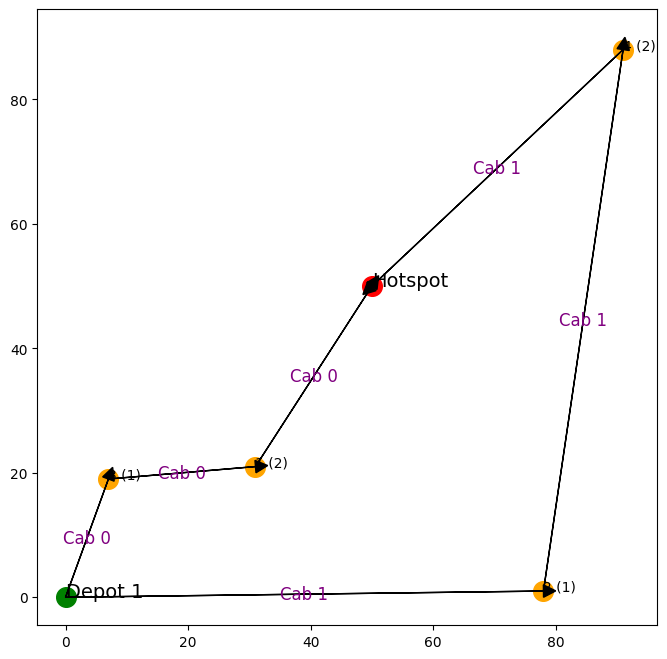

0 54.918328378036016 69.33974329343886 49.09128656212227
{1}
1 221.87401191551731 168.23920311307933 30.484792754101676
{2, 4}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  51
    x   y  demand  priority
0   0   0       0         0
1  13  19       1         1
2  19  50       2         1
3  19  23       2         1
4  64  69       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  13  19       1         1
2  19  50       2         1
3  19  23       2         1
4  64  69       2         1
5  50  50       0         1


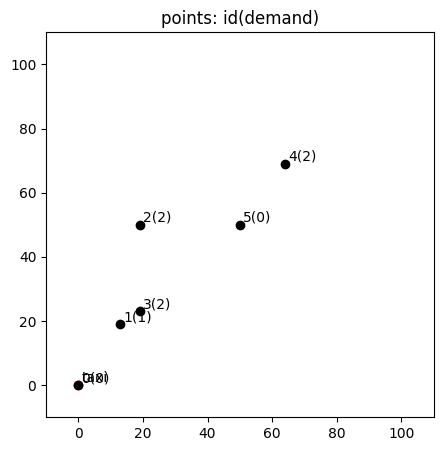

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 273.4746554953378


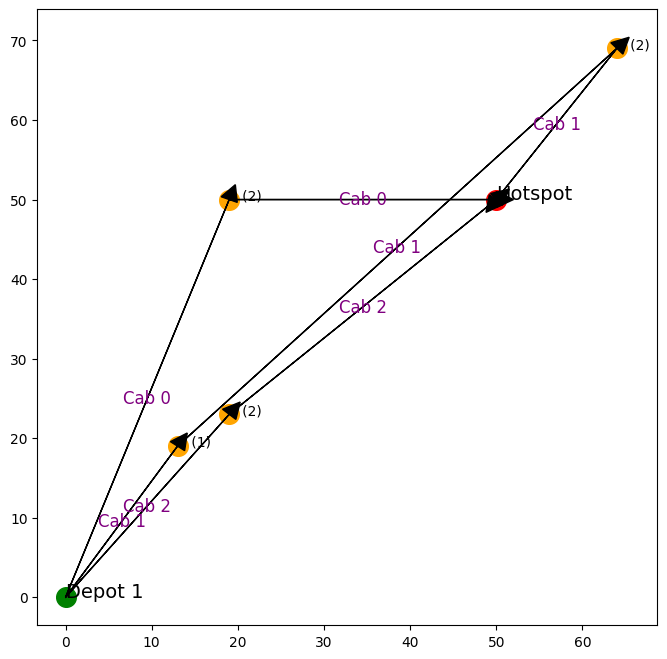

0 84.48831648126533 62.0 8.51168351873467
{2}
1 118.04386165153095 95.47176842941246 25.16379099258775
{1, 4}
2 70.94247736254152 82.21921916437786 52.38635138402526
{3}
    x   y  demand  priority
2  19  50       2         2
Iteration  52
    x   y  demand  priority
0   0   0       0         0
1  54  99       2         1
2  57  23       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  54  99       2         1
2  57  23       1         1
3  19  50       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


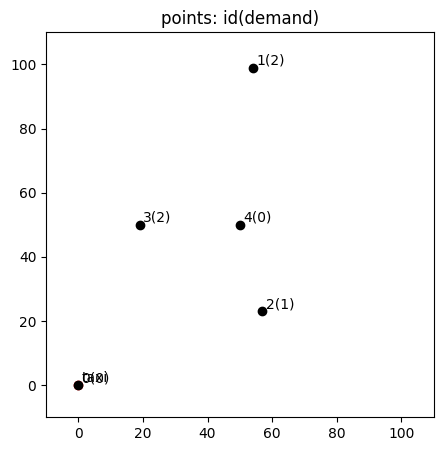

-1
1
Vehicle Requirements: 2
Moving Distance: 271.17593561613563


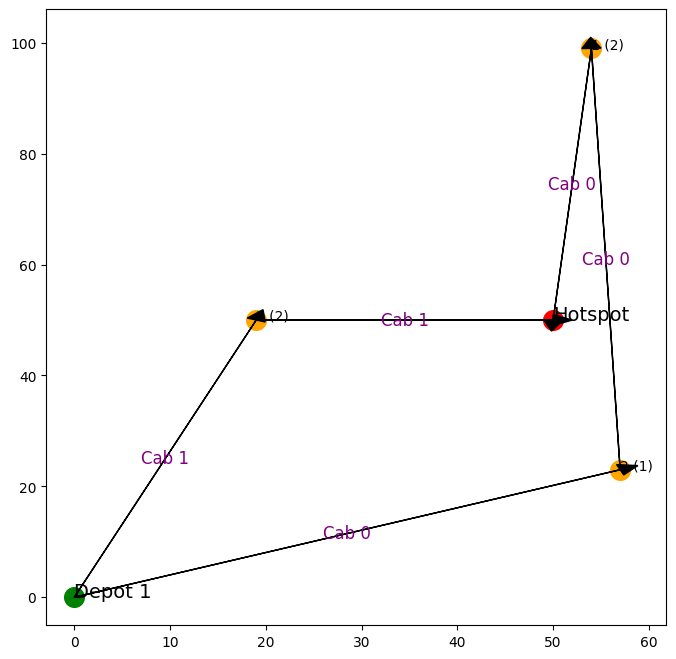

0 110.62843165564465 98.32598842625484 36.860550983737596
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  53
    x   y  demand  priority
0   0   0       0         0
1  79  95       1         1
2  76  73       3         1
3  37  82       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  79  95       1         1
2  76  73       3         1
3  37  82       3         1
4  50  50       0         1


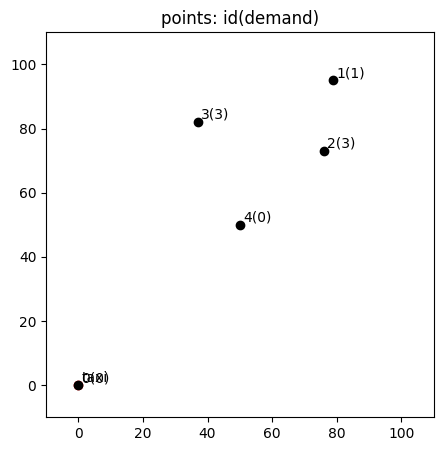

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 441.68499923903846


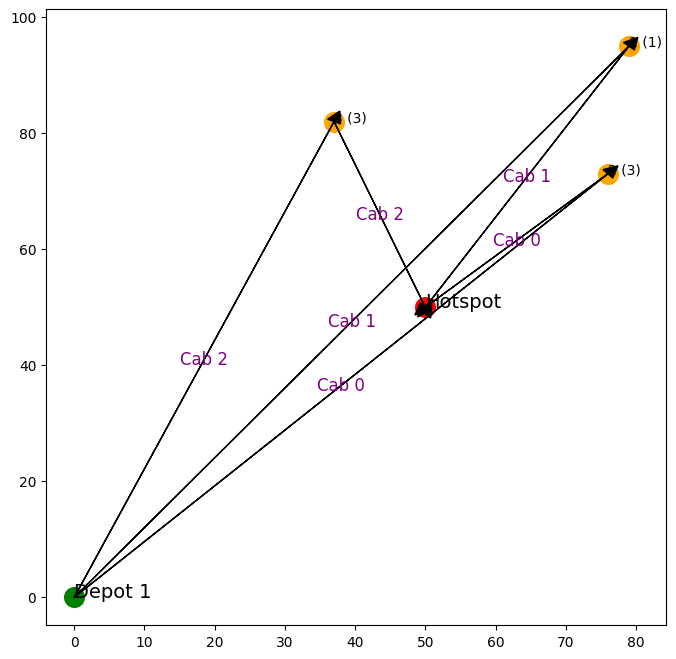

0 140.09337372226338 104.1393297462587 16.11562089712467
{2}
1 177.0906907328758 53.53503525729669 -96.78813784693077
{1}
2 124.50093478389934 103.61949623502326 30.92830956863557
{3}
    x   y  demand  priority
1  79  95       1         2
2  76  73       3         2
Iteration  54
    x   y  demand  priority
0   0   0       0         0
1  32  76       1         1
2  93  61       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  32  76       1         1
2  93  61       2         1
3  79  95       1         2
4  76  73       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


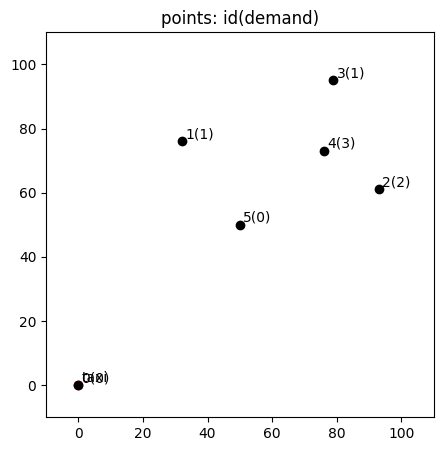

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 455.7033524224918


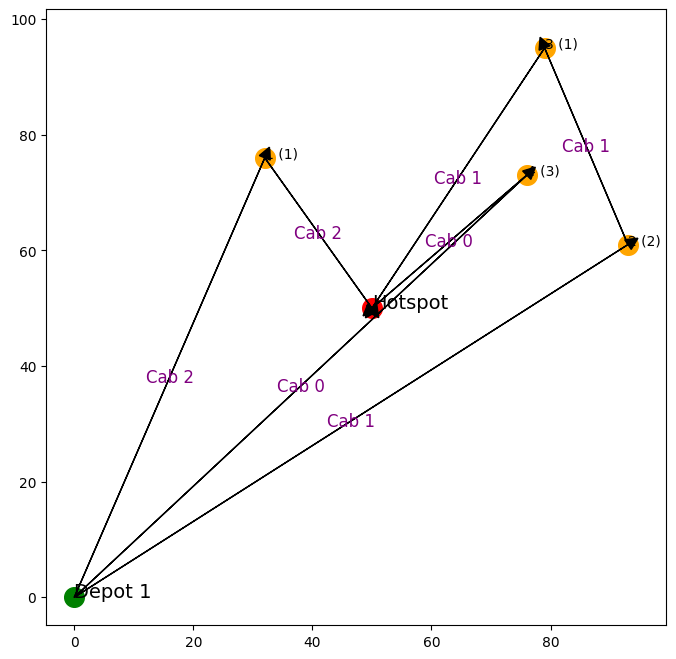

2 114.08488911403701 31.622776601683793 -66.65072421151132
{1}
    x   y  demand  priority
1  32  76       1         2
Iteration  55
    x   y  demand  priority
0   0   0       0         0
1  96  26       3         1
2  90  99       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  96  26       3         1
2  90  99       3         1
3  32  76       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


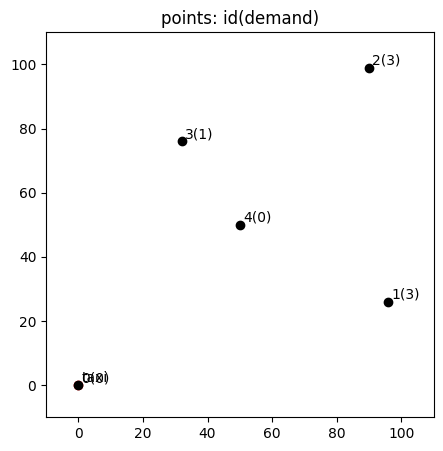

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 462.4759874009196


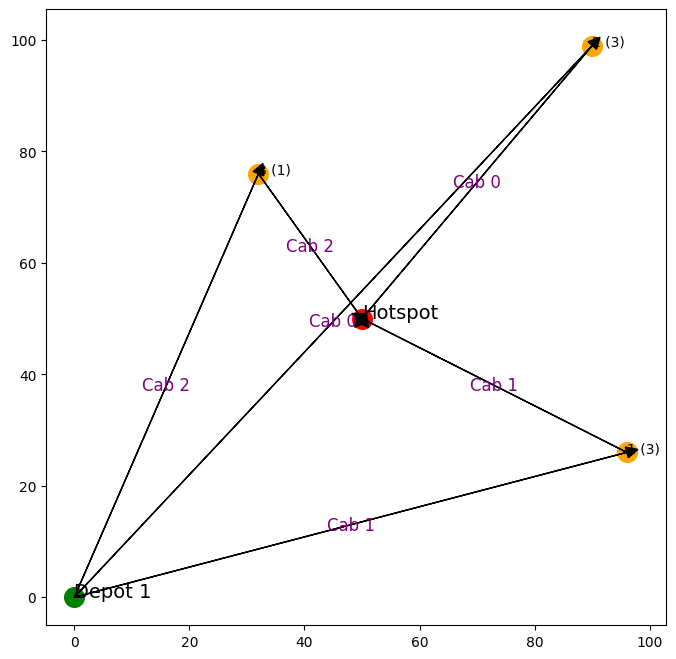

0 197.0480771293404 189.76037521042164 87.59248568629204
{2}
1 151.34302115754224 155.65346125287417 82.137170721769
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  56
    x   y  demand  priority
0   0   0       0         0
1  48  75       2         1
2  37  61       3         1
3  34   8       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  48  75       2         1
2  37  61       3         1
3  34   8       2         1
4  50  50       0         1


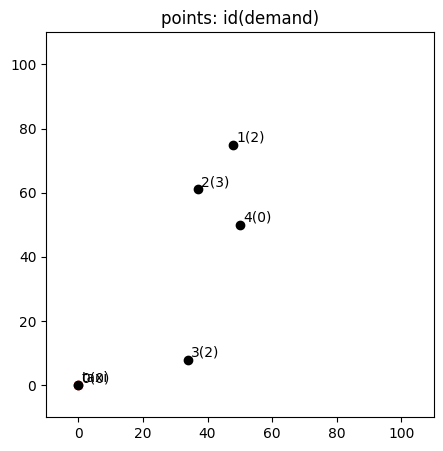

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 282.3713356804126


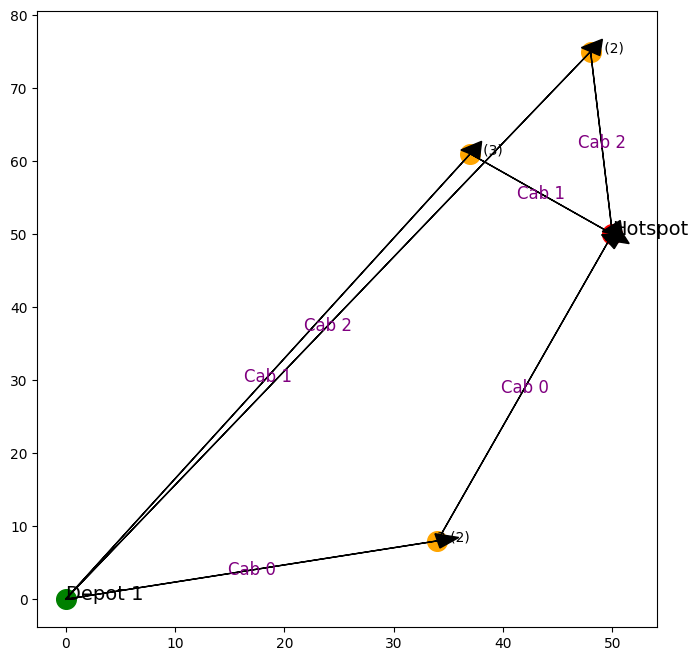

0 79.87290850163441 89.88882021697692 54.96032182383098
{3}
1 88.37362229287427 51.08815909777921 -11.741383646205463
{2}
2 114.12480488590388 50.15974481593781 -38.885187661997165
{1}
    x   y  demand  priority
1  48  75       2         2
2  37  61       3         2
Iteration  57
    x   y  demand  priority
0   0   0       0         0
1   5   1       2         1
2  96  81       1         1
3   7  20       1         1
4  72  34       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   5   1       2         1
2  96  81       1         1
3   7  20       1         1
4  72  34       1         1
5  48  75       2         2
6  37  61       3         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


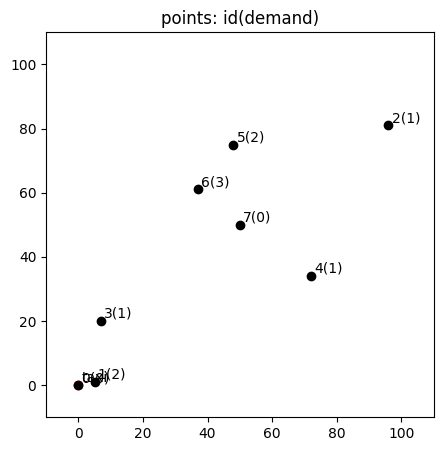

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 461.87131120054073


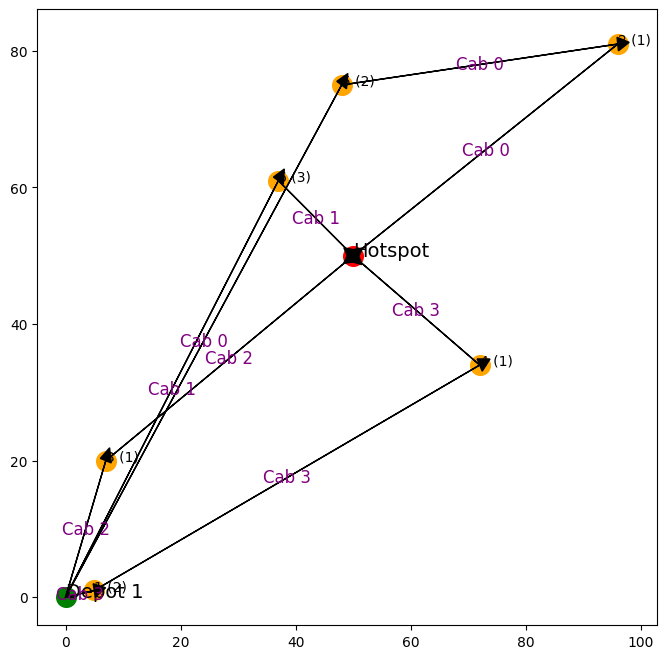

0 144.51564547136962 55.47071299343465 -61.30957598121765
{2}
2 73.6205270160904 52.43090691567332 5.025833357419572
{3}
3 106.98796993041503 160.25932004531006 133.40101013755006
{1, 4}
    x   y  demand  priority
2  96  81       1         2
3   7  20       1         2
Iteration  58
    x   y  demand  priority
0   0   0       0         0
1  20  77       2         1
2  74  76       1         1
3  53  45       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  20  77       2         1
2  74  76       1         1
3  53  45       3         1
4  96  81       1         2
5   7  20       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


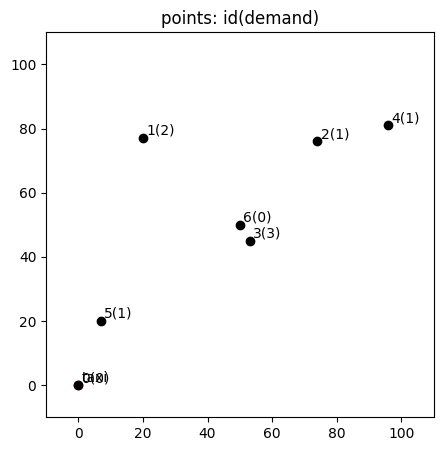

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 378.92325011254735


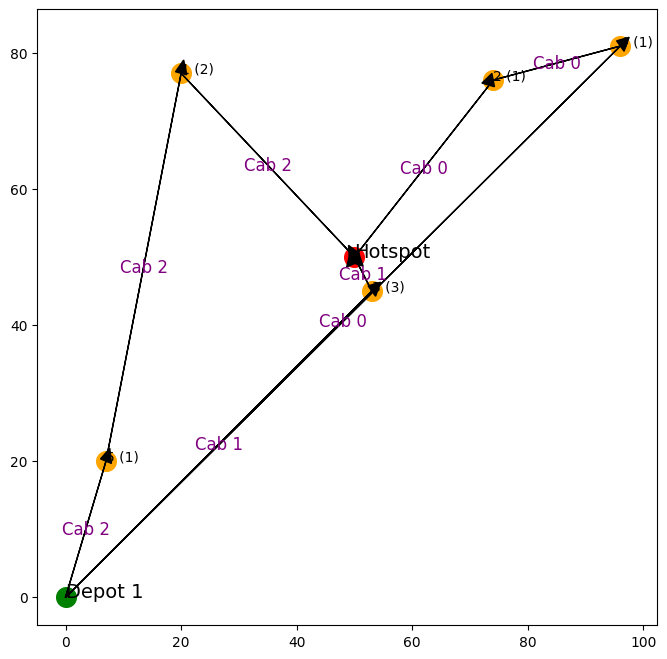

0 160.9901405186582 35.38361202590826 -107.9147224797958
{2}
1 75.35792507792009 17.492855684535904 -49.11864155111623
{3}
2 61.550492241638224 80.72174428244226 59.53212418202516
{1}
    x   y  demand  priority
2  74  76       1         2
3  53  45       3         2
Iteration  59
    x   y  demand  priority
0   0   0       0         0
1  51  37       3         1
2  18  28       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  51  37       3         1
2  18  28       3         1
3  74  76       1         2
4  53  45       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


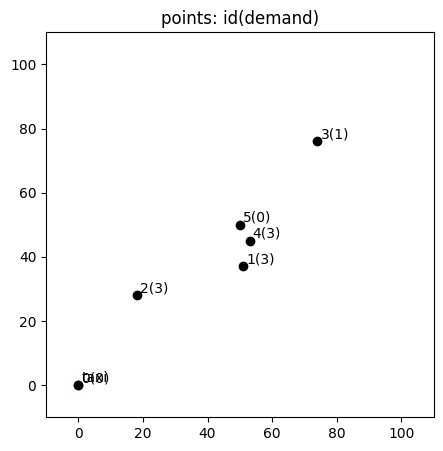

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 364.9829324038178


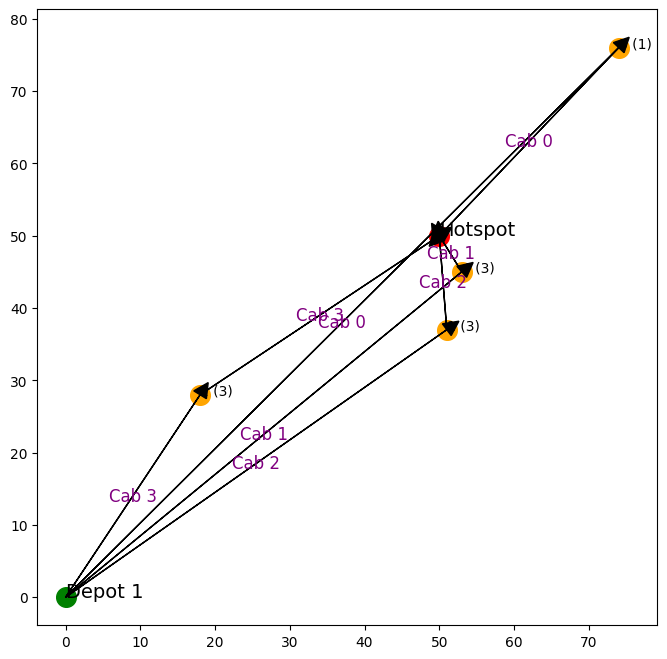

2 76.04634081849876 39.1152144312159 -17.373519171674914
{1}
3 72.11960963208168 116.49892703368559 102.6287809184467
{2}
    x   y  demand  priority
1  51  37       3         2
Iteration  60
    x   y  demand  priority
0   0   0       0         0
1  67  26       2         1
2  80  16       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  67  26       2         1
2  80  16       3         1
3  51  37       3         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


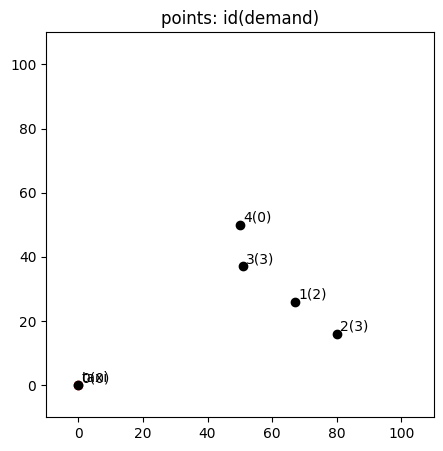

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 304.2526060060311


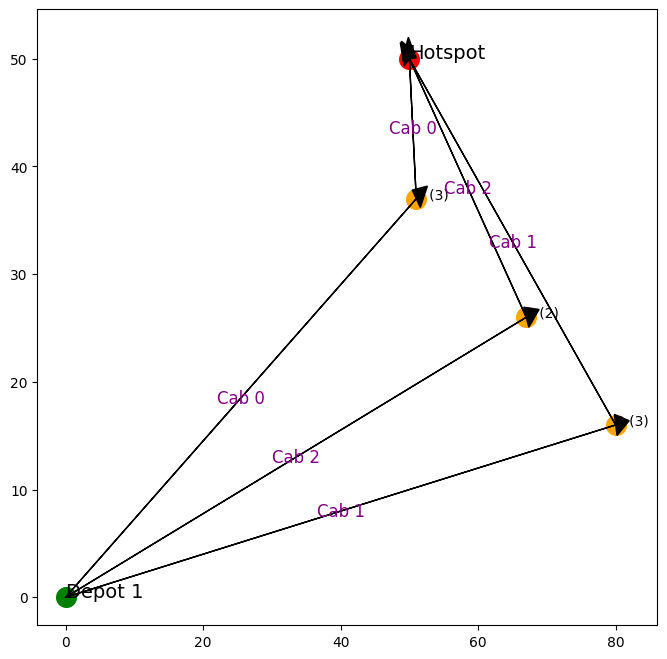

1 126.92744841250308 136.02940858505562 77.11666446508033
{2}
2 101.27881677502928 58.82176467941097 -13.046169755912828
{1}
    x   y  demand  priority
1  67  26       2         2
Iteration  61
    x   y  demand  priority
0   0   0       0         0
1   9  93       1         1
2  73  98       3         1
3  84  56       1         1
4  44  54       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   9  93       1         1
2  73  98       3         1
3  84  56       1         1
4  44  54       2         1
5  67  26       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


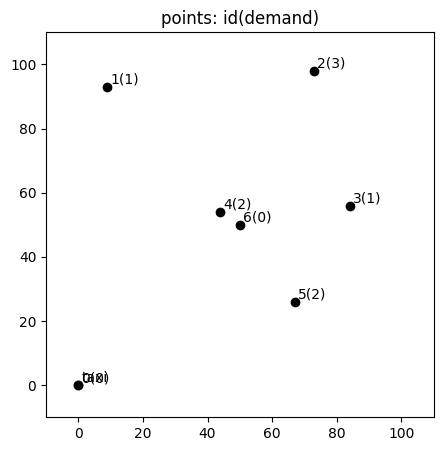

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 469.34961652074537


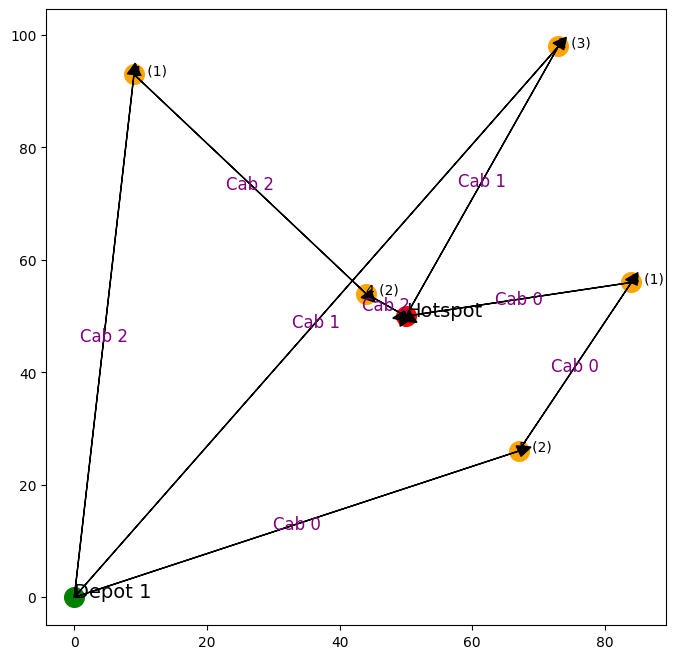

0 106.39328743858795 34.52535300326414 -54.605257933691746
{3}
1 175.4265881914159 159.67780058605516 64.09011268766685
{2}
2 153.0478615916082 73.83600821190775 -42.29384927374659
{1, 4}
    x   y  demand  priority
1   9  93       1         2
3  84  56       1         2
4  44  54       2         2
Iteration  62
    x   y  demand  priority
0   0   0       0         0
1  26  79       1         1
2   3  67       1         1
3  42  66       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  26  79       1         1
2   3  67       1         1
3  42  66       3         1
4   9  93       1         2
5  84  56       1         2
6  44  54       2         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


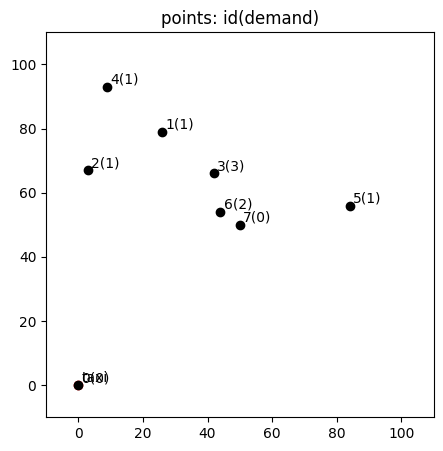

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 393.766828215432


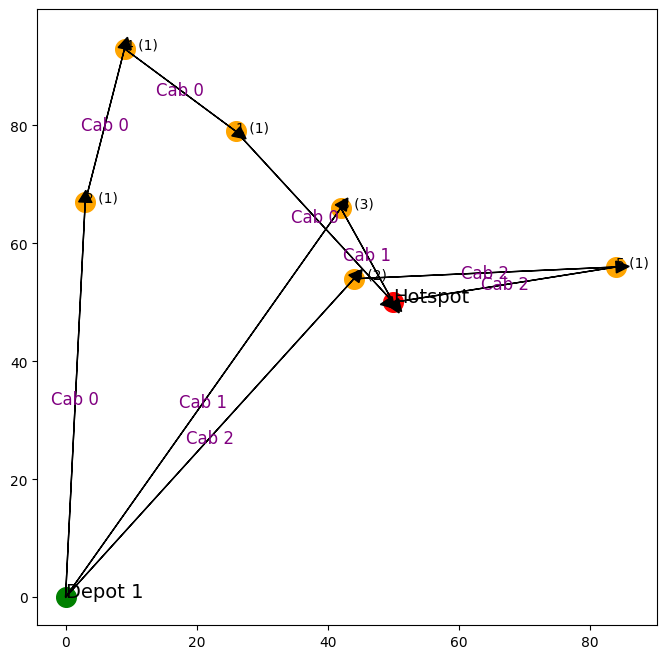

0 104.71019099786628 37.64306044943742 -48.24560032371015
{1}
1 96.1189726824301 53.665631459994955 -15.620525492437665
{3}
    x   y  demand  priority
1  26  79       1         2
3  42  66       3         2
Iteration  63
    x   y  demand  priority
0   0   0       0         0
1  76  36       1         1
2  43  10       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  76  36       1         1
2  43  10       3         1
3  26  79       1         2
4  42  66       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


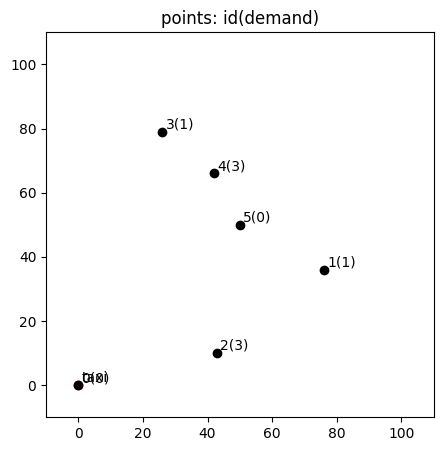

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 359.5194319495962


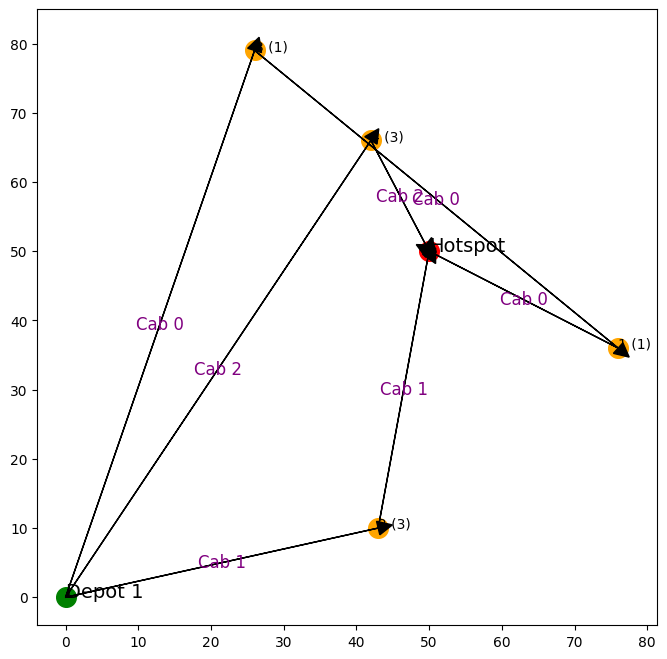

0 112.69814977419378 29.5296461204668 -68.40368059349358
{1}
1 84.75536111778214 121.82364302548172 97.98010342044043
{2}
    x   y  demand  priority
1  76  36       1         2
Iteration  64
    x   y  demand  priority
0   0   0       0         0
1   1  11       2         1
2  94  70       1         1
3   9  93       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   1  11       2         1
2  94  70       1         1
3   9  93       1         1
4  76  36       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


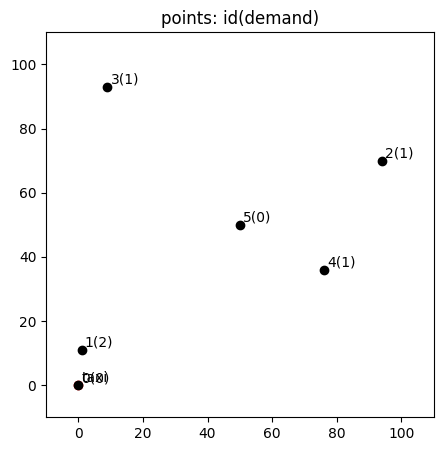

-1
1
Vehicle Requirements: 2
Moving Distance: 323.1629173737913


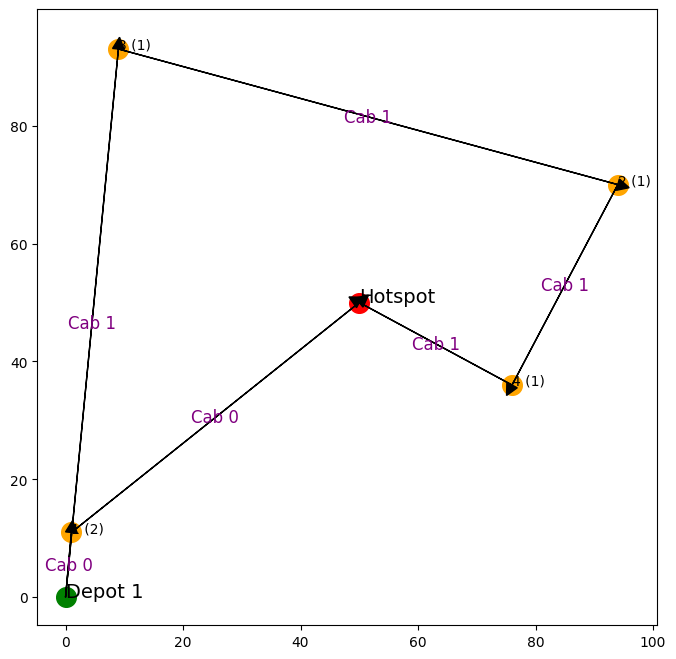

0 73.67123426459196 125.25174649480941 114.20638547762215
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  65
    x   y  demand  priority
0   0   0       0         0
1  73  43       1         1
2  48  85       3         1
3  79   5       2         1
4  60  46       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  73  43       1         1
2  48  85       3         1
3  79   5       2         1
4  60  46       2         1
5  50  50       0         1


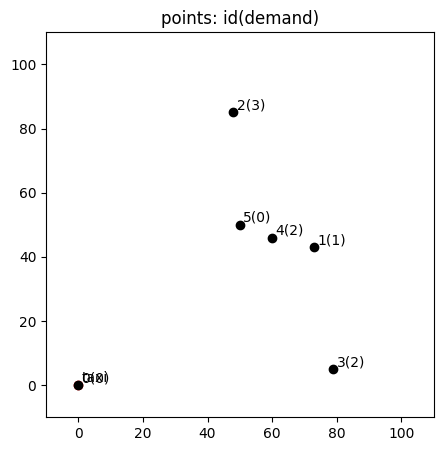

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 360.7187239277611


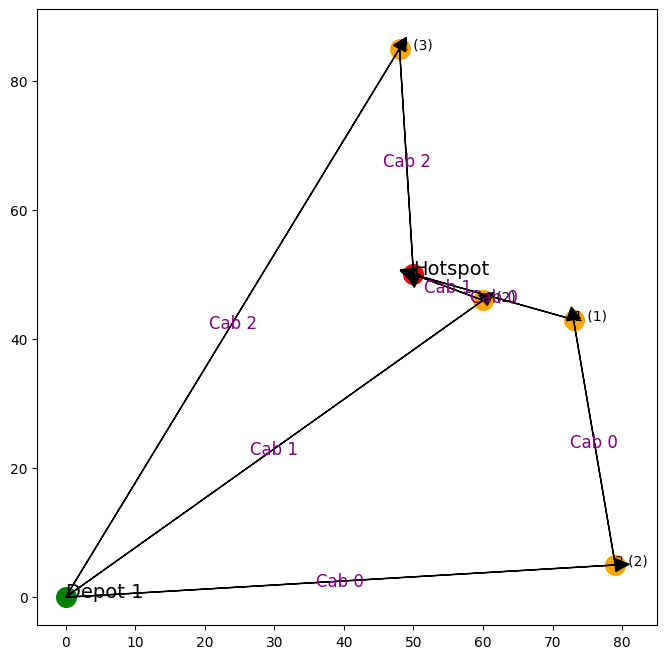

0 103.19970026899581 24.041630560342615 -67.1372544284819
{1}
1 86.3745623000122 21.540659228538015 -54.06357345720518
{4}
2 132.6736932354104 105.17128885774864 25.083240051212528
{2}
    x   y  demand  priority
1  73  43       1         2
4  60  46       2         2
Iteration  66
    x   y  demand  priority
0   0   0       0         0
1  15   9       3         1
2  55  44       1         1
3  30  85       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  15   9       3         1
2  55  44       1         1
3  30  85       1         1
4  73  43       1         2
5  60  46       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


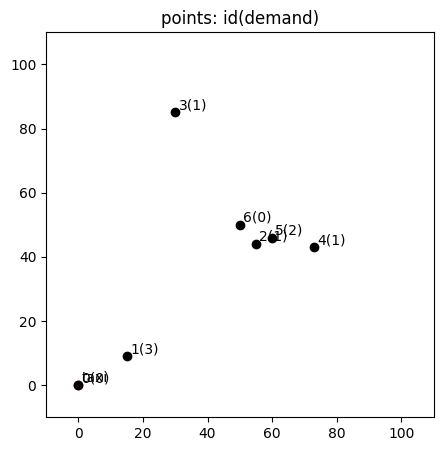

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 326.2051159472843


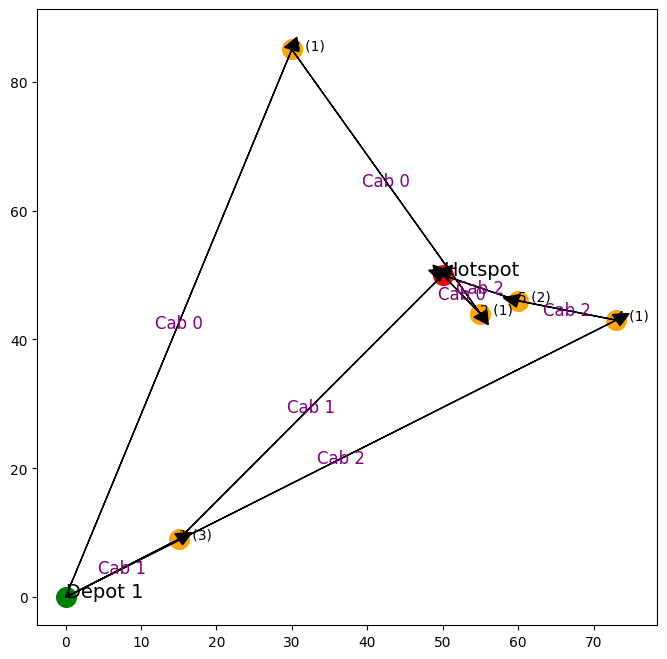

0 97.94903156250638 7.810249675906654 -86.23365704864639
{2}
1 71.40018357231011 161.72198366332265 171.18279192267386
{1}
    x   y  demand  priority
2  55  44       1         2
Iteration  67
    x   y  demand  priority
0   0   0       0         0
1  21  76       1         1
2  92  48       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  21  76       1         1
2  92  48       2         1
3  55  44       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


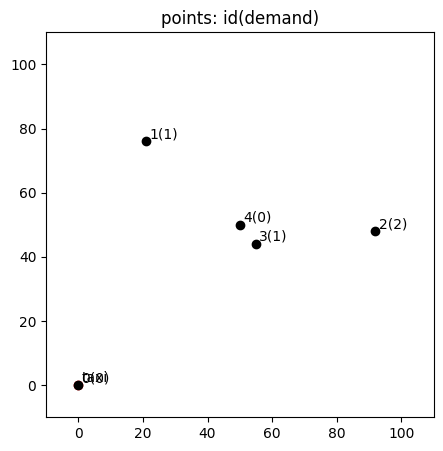

-1
1
Vehicle Requirements: 2
Moving Distance: 266.59145111593295


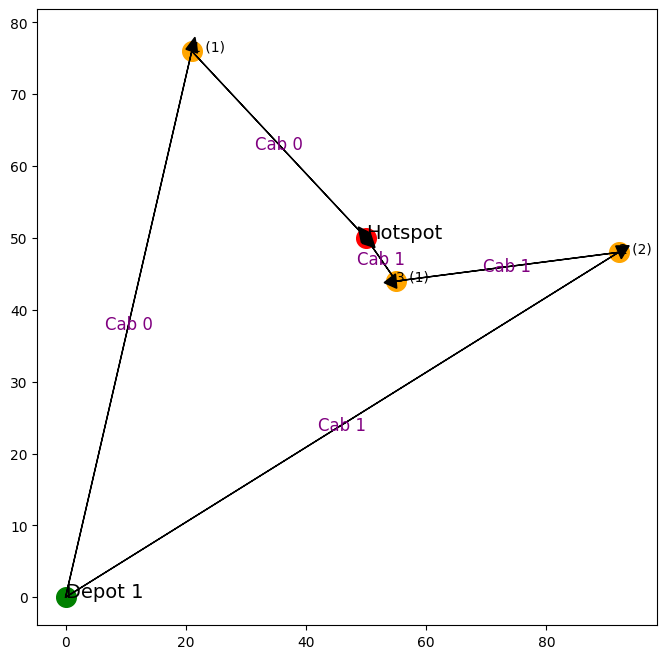

0 117.79663913958672 38.948684188300895 -59.37361285713537
{1}
    x   y  demand  priority
1  21  76       1         2
Iteration  68
    x   y  demand  priority
0   0   0       0         0
1  99  28       1         1
2  67  83       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  99  28       1         1
2  67  83       1         1
3  21  76       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


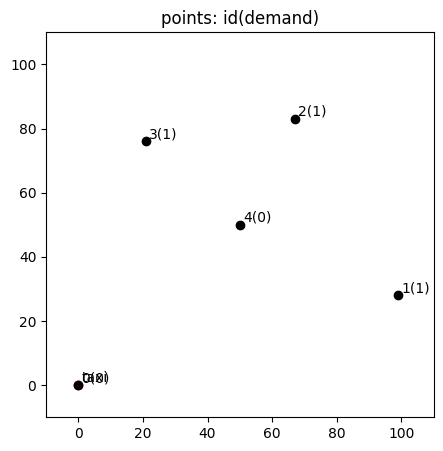

1
Vehicle Requirements: 1
Moving Distance: 242.72146453552847


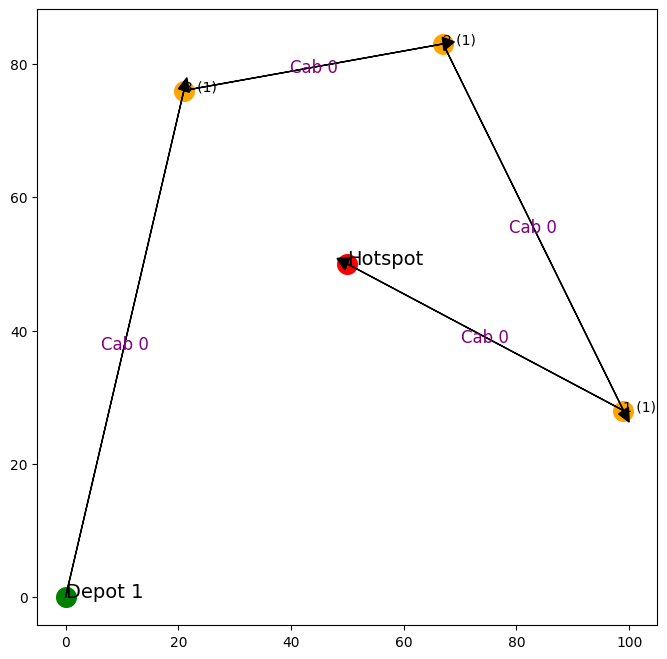

0 132.56015095926898 53.71219600798314 -51.99185694729428
{1}
    x   y  demand  priority
1  99  28       1         2
Iteration  69
    x   y  demand  priority
0   0   0       0         0
1  58  19       2         1
2  65  48       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  58  19       2         1
2  65  48       3         1
3  99  28       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


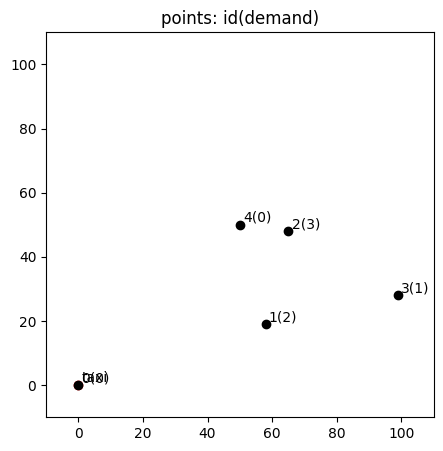

-1
1
Vehicle Requirements: 2
Moving Distance: 252.65613145276697


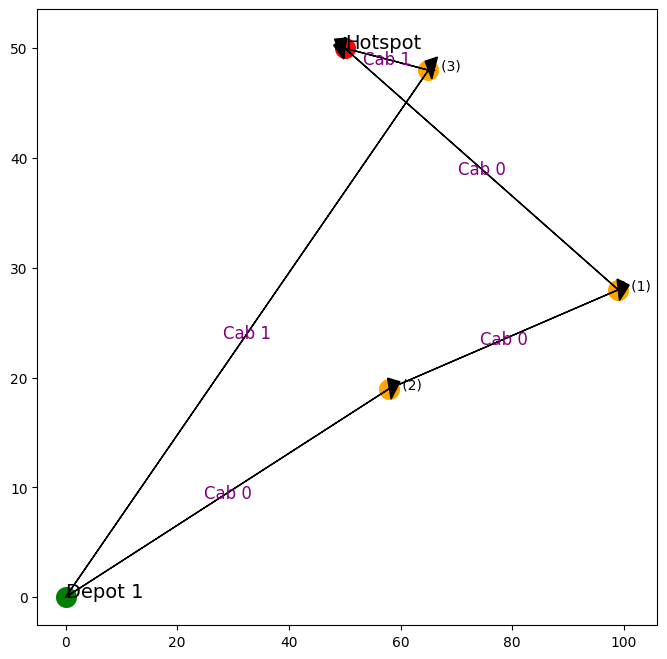

1 95.9349736424846 45.39823785126467 -27.83761686558759
{2}
    x   y  demand  priority
2  65  48       3         2
Iteration  70
    x   y  demand  priority
0   0   0       0         0
1  75  47       3         1
2  26   2       1         1
3   9  60       2         1
4  25  45       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  75  47       3         1
2  26   2       1         1
3   9  60       2         1
4  25  45       3         1
5  65  48       3         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


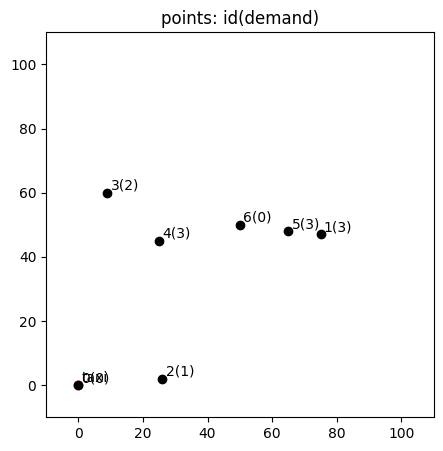

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 415.3162232507224


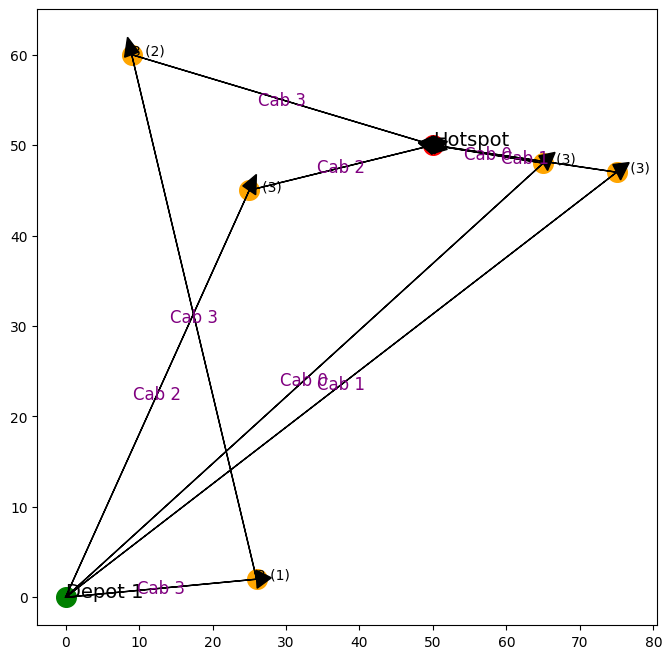

1 113.68924307746359 75.53806987208503 -0.3821382693360391
{1}
2 76.97324827289893 76.48529270389177 37.754690782938724
{4}
3 128.71875825787527 138.06942284403172 78.38537600817233
{2, 3}
    x   y  demand  priority
1  75  47       3         2
Iteration  71
    x   y  demand  priority
0   0   0       0         0
1  42  86       3         1
2  33  44       2         1
3  38  42       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  42  86       3         1
2  33  44       2         1
3  38  42       3         1
4  75  47       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


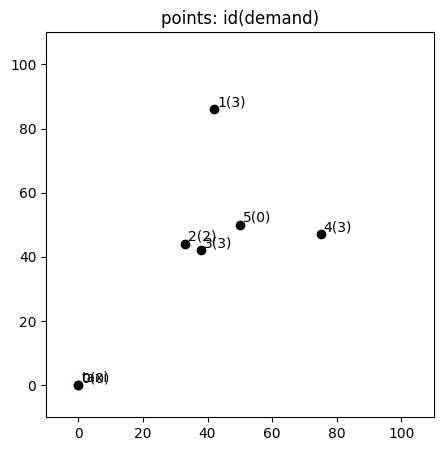

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 390.36448033187946


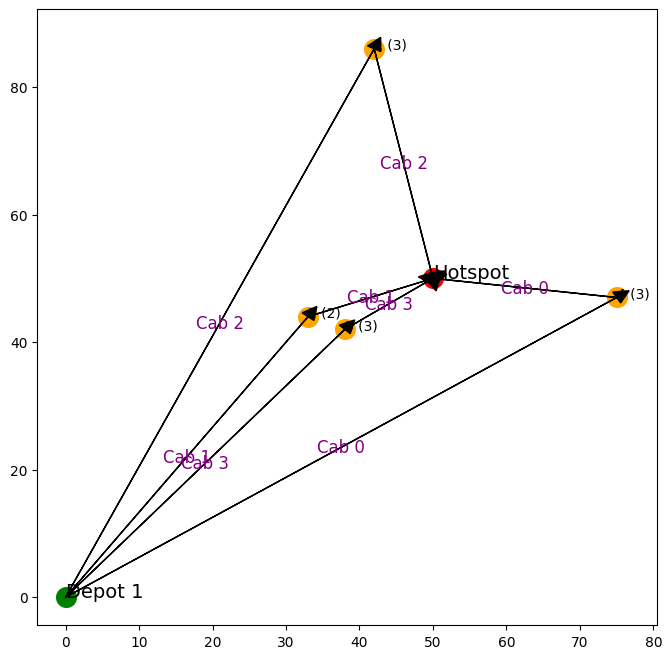

1 73.02775637731995 36.05551275463989 -18.944487245360108
{2}
2 132.58606674121472 110.63453348751464 33.36573349005724
{1}
3 71.06141413588114 43.26661530556787 -6.161491177529342
{3}
    x   y  demand  priority
2  33  44       2         2
3  38  42       3         2
Iteration  72
    x   y  demand  priority
0   0   0       0         0
1  60  67       3         1
2  56  61       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  60  67       3         1
2  56  61       1         1
3  33  44       2         2
4  38  42       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


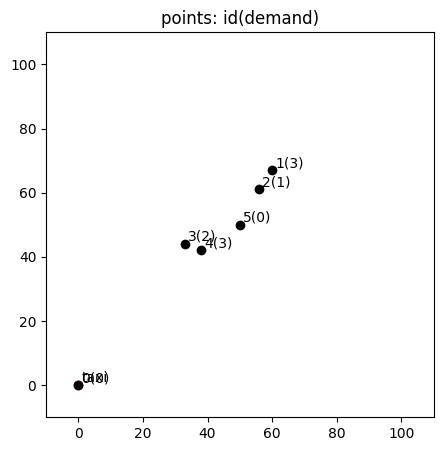

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 276.85402856467863


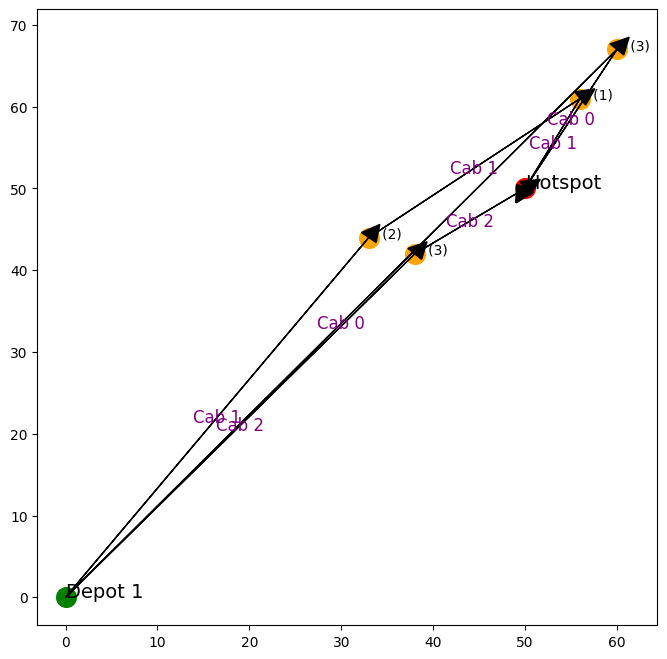

0 109.66195105050562 59.16924876994806 -20.90807789558353
{1}
1 67.52996408614166 12.529964086141668 -48.735017956929156
{2}
    x   y  demand  priority
1  60  67       3         2
2  56  61       1         2
Iteration  73
    x   y  demand  priority
0   0   0       0         0
1  89  65       2         1
2   5  30       3         1
3   9  85       2         1
4  11  78       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  89  65       2         1
2   5  30       3         1
3   9  85       2         1
4  11  78       1         1
5  60  67       3         2
6  56  61       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


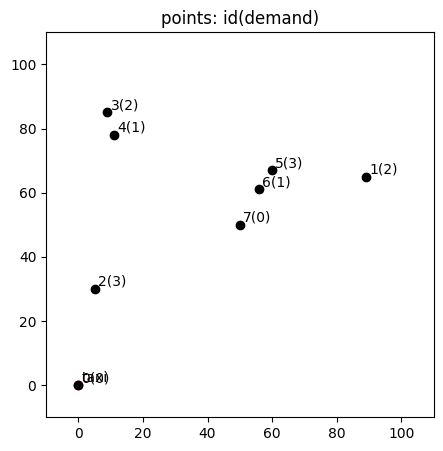

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 485.25970978776337


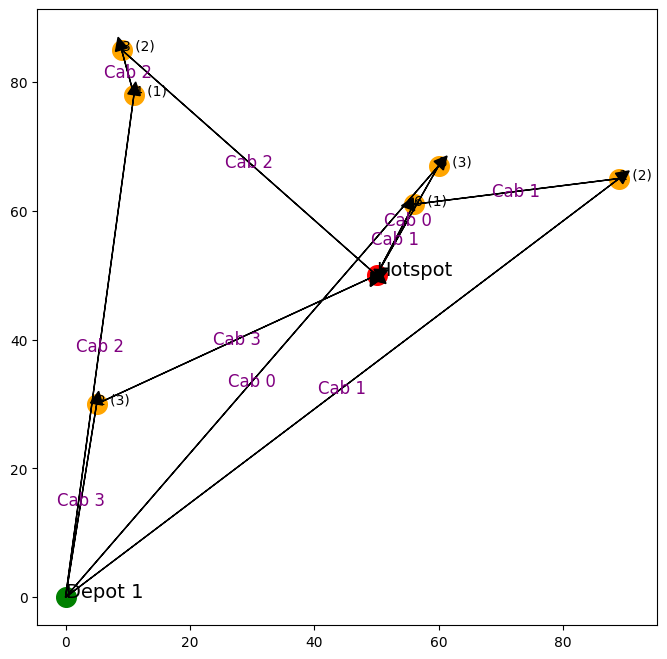

2 132.67915026100613 107.81465577554843 29.042833402316518
{3}
3 79.65810166047163 147.73286702694156 141.9411988799407
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  74
    x   y  demand  priority
0   0   0       0         0
1  62  83       1         1
2  99  88       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  62  83       1         1
2  99  88       1         1
3  50  50       0         1


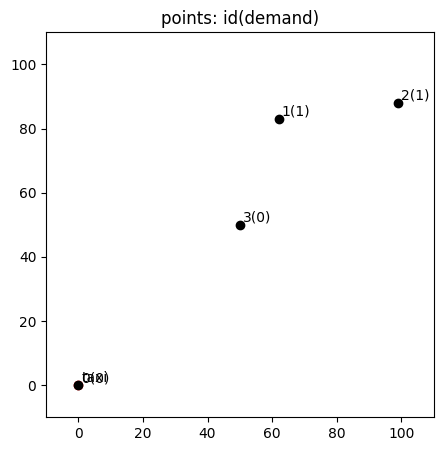

1
Vehicle Requirements: 1
Moving Distance: 202.9445664469121


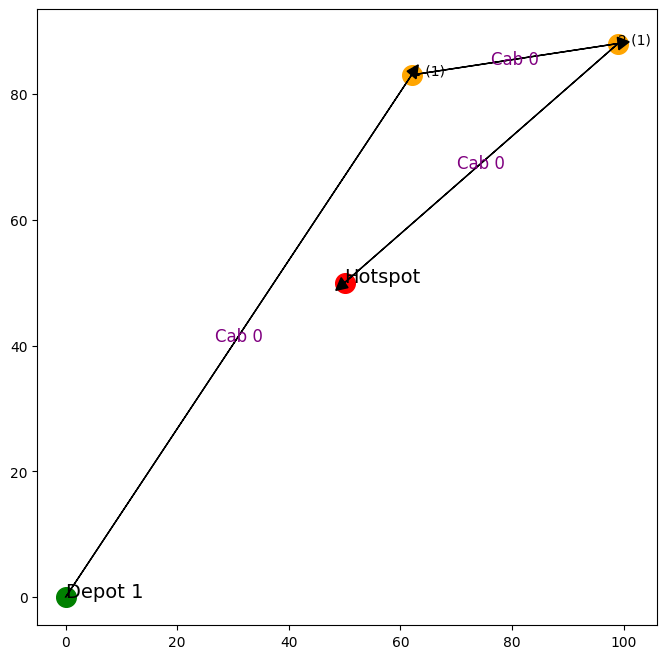

0 202.9445664469121 97.12216372386885 -57.26132086110883
{1, 2}
    x   y  demand  priority
1  62  83       1         2
2  99  88       1         2
Iteration  75
    x   y  demand  priority
0   0   0       0         0
1  53  52       2         1
2  22  66       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  53  52       2         1
2  22  66       1         1
3  62  83       1         2
4  99  88       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


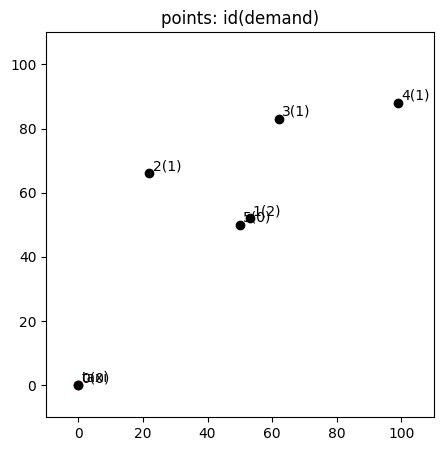

-1
1
Vehicle Requirements: 2
Moving Distance: 290.23223994365503


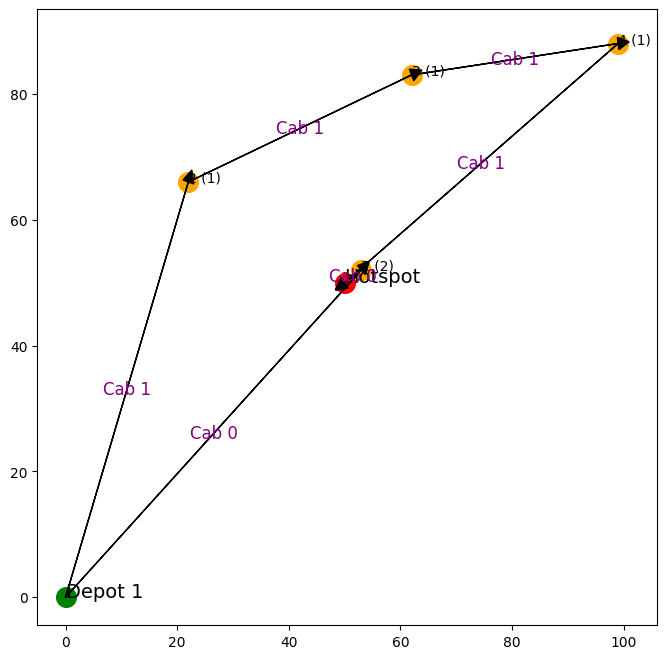

0 77.85513039885028 7.211102550927978 -67.03847657245831
{1}
    x   y  demand  priority
1  53  52       2         2
Iteration  76
    x   y  demand  priority
0   0   0       0         0
1  75  80       2         1
2  88  39       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  75  80       2         1
2  88  39       1         1
3  53  52       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


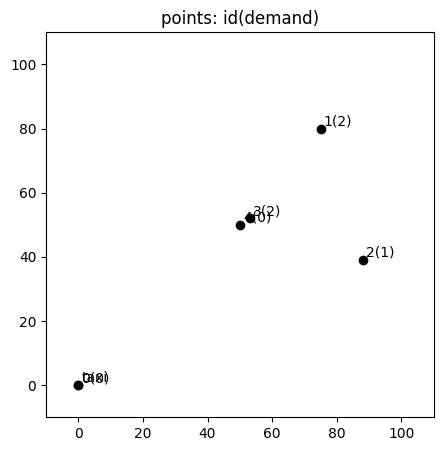

-1
1
Vehicle Requirements: 2
Moving Distance: 256.1728751202618


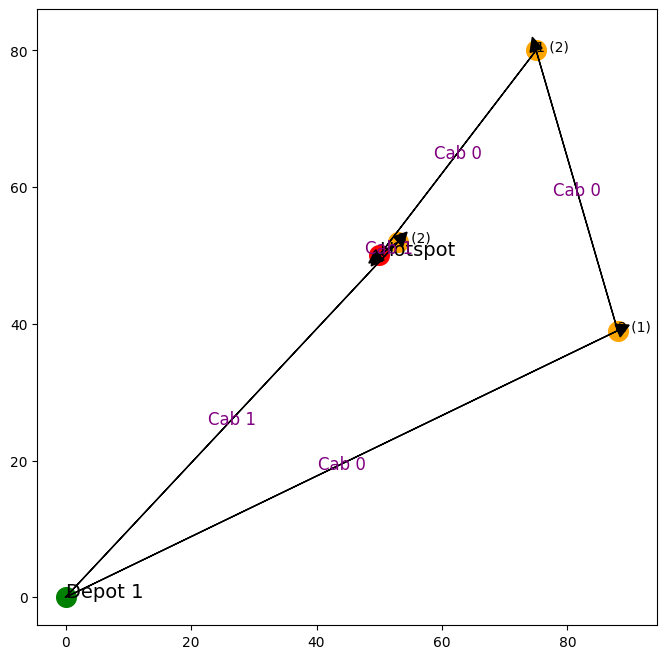

0 135.3061183861984 78.10249675906654 -18.152373247598575
{1}
    x   y  demand  priority
1  75  80       2         2
Iteration  77
    x   y  demand  priority
0   0   0       0         0
1  14  25       1         1
2  96   1       3         1
3  16  23       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  14  25       1         1
2  96   1       3         1
3  16  23       1         1
4  75  80       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


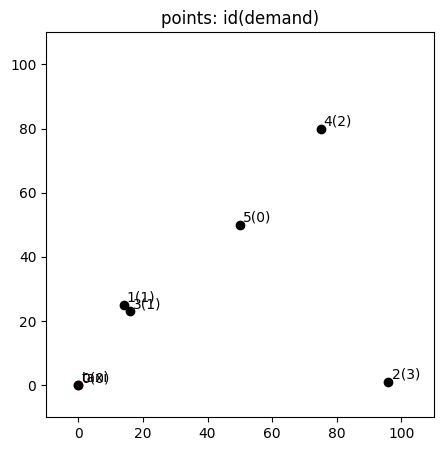

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 384.48665947151704


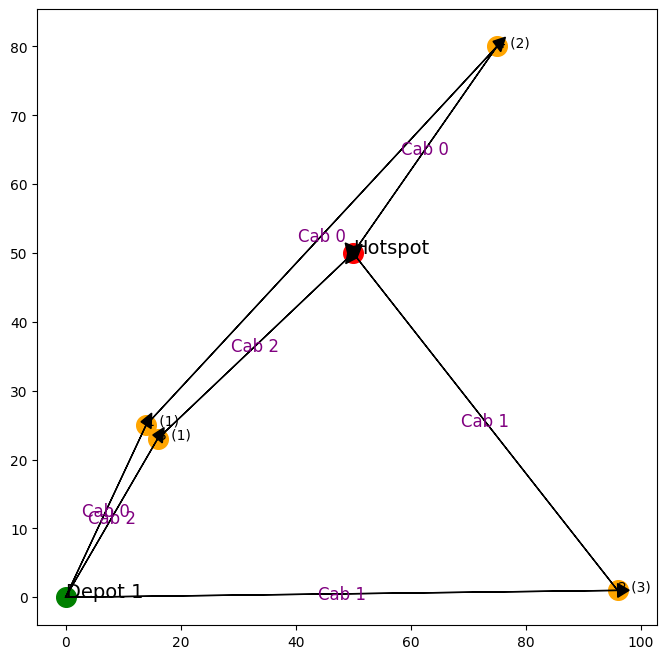

1 163.21383859024212 201.62589119455865 139.22499820159584
{2}
2 71.43443814442863 43.41658669218482 -6.3095581061513855
{3}
    x   y  demand  priority
3  16  23       1         2
Iteration  78
    x   y  demand  priority
0   0   0       0         0
1  53  98       3         1
2  43  24       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  53  98       3         1
2  43  24       1         1
3  16  23       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


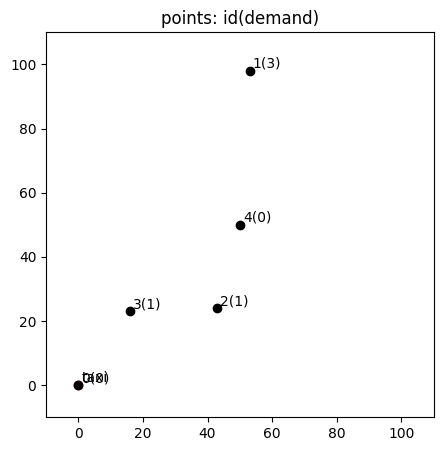

-1
1
Vehicle Requirements: 2
Moving Distance: 241.4694899745063


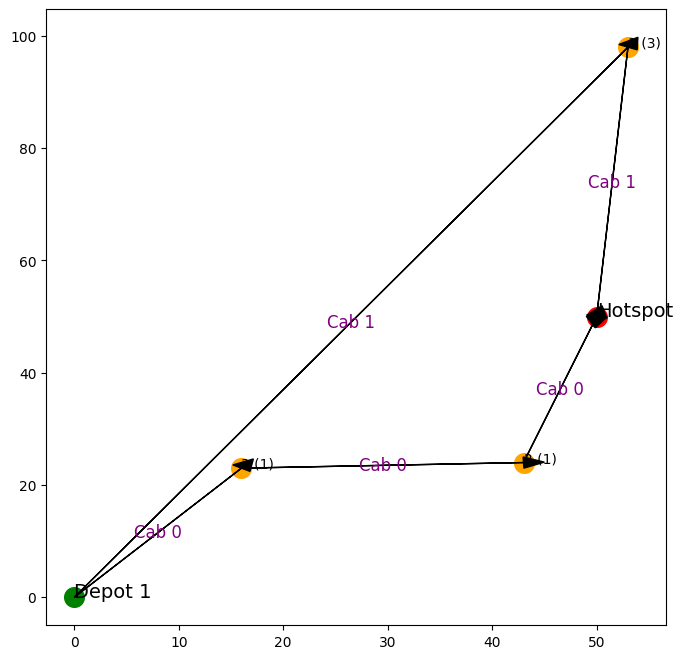

0 54.94367548791632 26.92582403567252 -14.554939434407544
{2}
1 159.5073023143774 144.2809758769326 56.91416150102148
{1}
    x   y  demand  priority
2  43  24       1         2
Iteration  79
    x   y  demand  priority
0   0   0       0         0
1  12  59       3         1
2  34  66       1         1
3  44  64       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  12  59       3         1
2  34  66       1         1
3  44  64       3         1
4  43  24       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


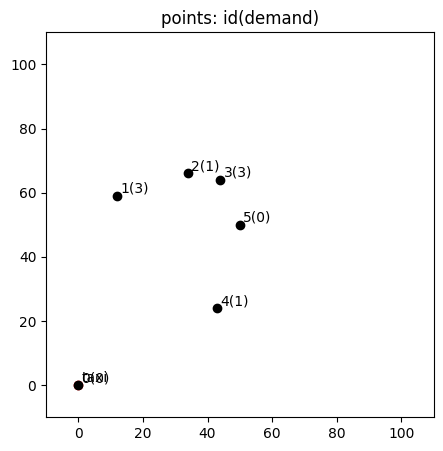

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 306.98188803779203


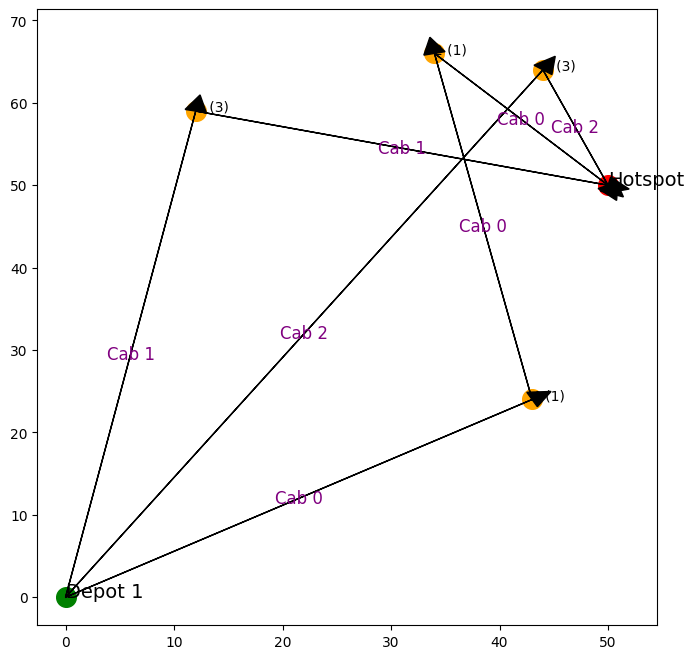

0 71.87170600695005 22.627416997969522 -37.930580509995764
{2}
1 99.25922127349475 117.15374513859982 76.471396434405
{1}
2 92.89749756751822 45.69463863518345 -24.355539614743037
{3}
    x   y  demand  priority
2  34  66       1         2
3  44  64       3         2
Iteration  80
    x   y  demand  priority
0   0   0       0         0
1  27   5       1         1
2  86  40       2         1
3  21  32       3         1
4  82  43       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  27   5       1         1
2  86  40       2         1
3  21  32       3         1
4  82  43       2         1
5  34  66       1         2
6  44  64       3         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


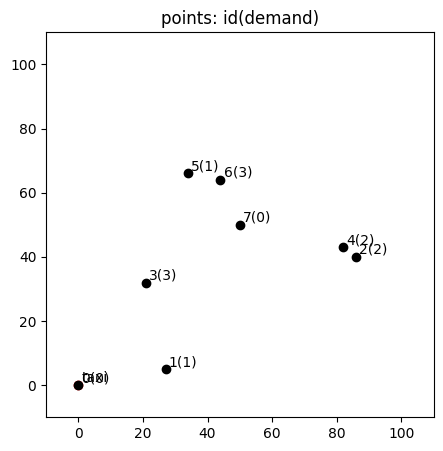

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 458.9528046919661


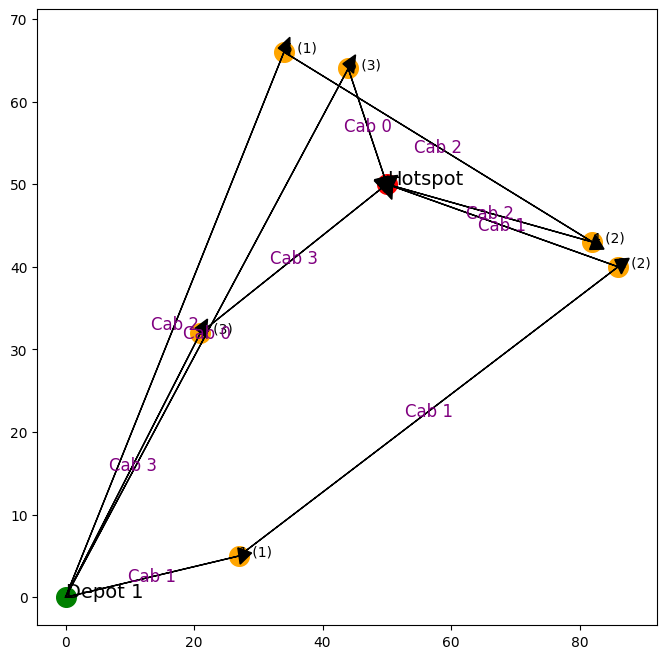

1 133.42243536460074 125.26328184305073 54.472487399975364
{1, 2}
2 106.99952348140073 65.5133574166368 -8.729487356445532
{4}
3 72.4074147497613 102.39628899525607 81.18701874312279
{3}
    x   y  demand  priority
4  82  43       2         2
Iteration  81
    x   y  demand  priority
0   0   0       0         0
1  98  55       1         1
2  79  82       1         1
3  42  40       3         1
4  95   3       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  98  55       1         1
2  79  82       1         1
3  42  40       3         1
4  95   3       2         1
5  82  43       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


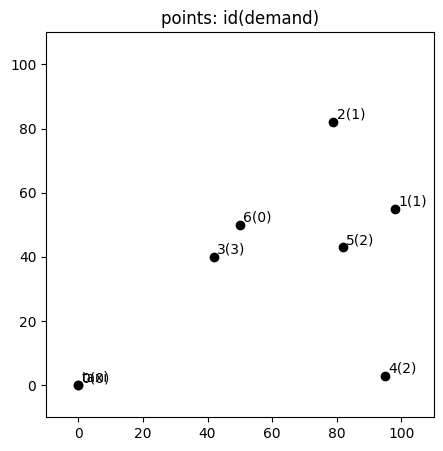

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 441.0911421801375


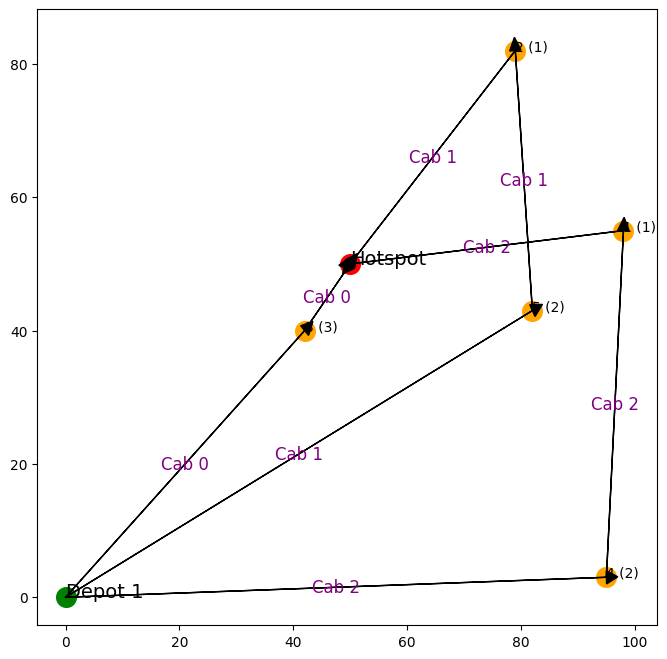

0 70.8062484748657 38.41874542459709 -13.17813033797006
{3}
1 135.77614203594405 43.18564576337837 -70.9976733908765
{2}
2 143.30707066569022 48.25971404805462 -70.91749959360828
{1}
    x   y  demand  priority
1  98  55       1         2
2  79  82       1         2
3  42  40       3         2
Iteration  82
    x   y  demand  priority
0   0   0       0         0
1  44  73       1         1
2  55  94       3         1
3  60  40       1         1
4  53  15       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  44  73       1         1
2  55  94       3         1
3  60  40       1         1
4  53  15       3         1
5  98  55       1         2
6  79  82       1         2
7  42  40       3         2
8  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


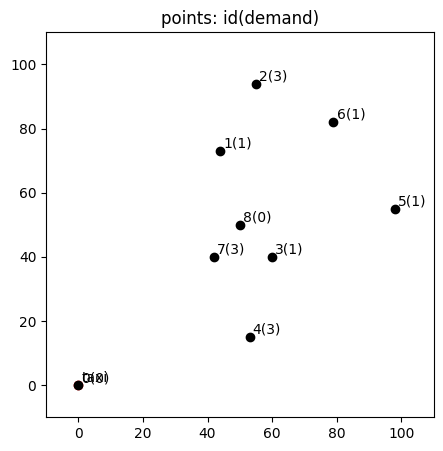

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 603.1093544891753


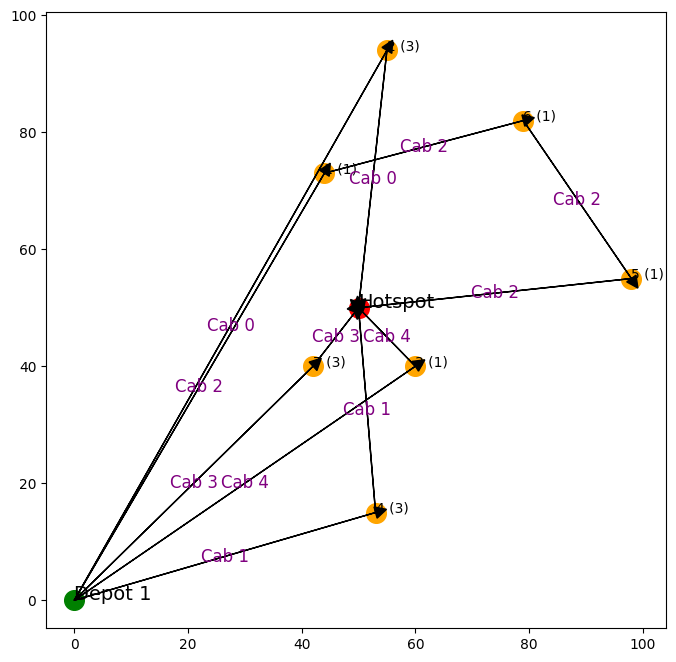

0 153.1913978899982 132.84953895290718 46.08291053936256
{2}
1 90.21009355618224 105.38500842150178 67.86741907607043
{4}
4 86.25316113301074 14.142135623730951 -65.03995769741431
{3}
    x   y  demand  priority
3  60  40       1         2
Iteration  83
    x   y  demand  priority
0   0   0       0         0
1  91  11       3         1
2  38   6       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  91  11       3         1
2  38   6       2         1
3  60  40       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


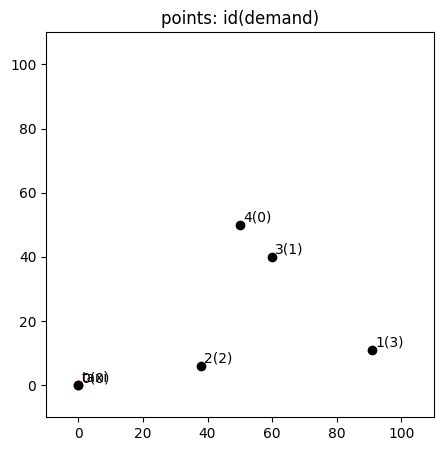

-1
1
Vehicle Requirements: 2
Moving Distance: 241.35845875713514


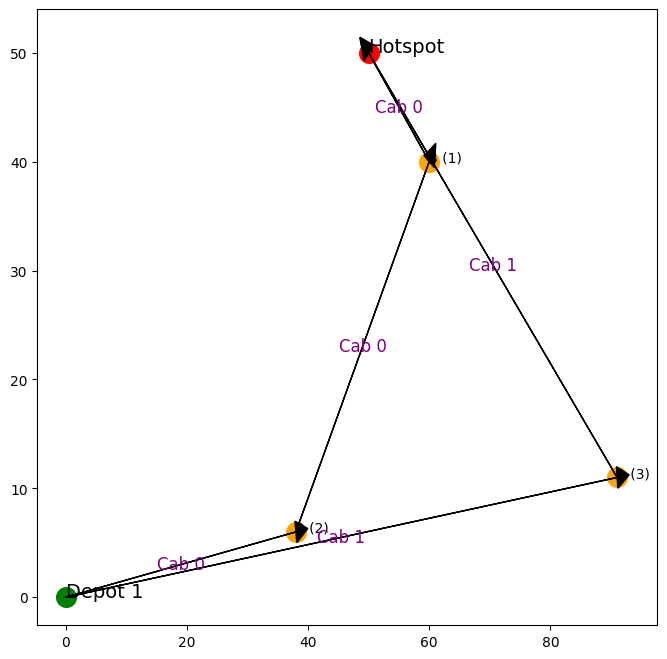

1 148.24864154742832 169.7586522095413 106.38933676688364
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  84
    x   y  demand  priority
0   0   0       0         0
1  20  96       3         1
2  88  71       2         1
3   0  72       1         1
4  44  31       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  20  96       3         1
2  88  71       2         1
3   0  72       1         1
4  44  31       3         1
5  50  50       0         1


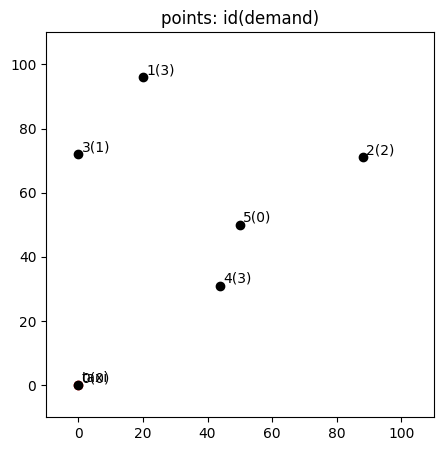

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 430.15023998334885


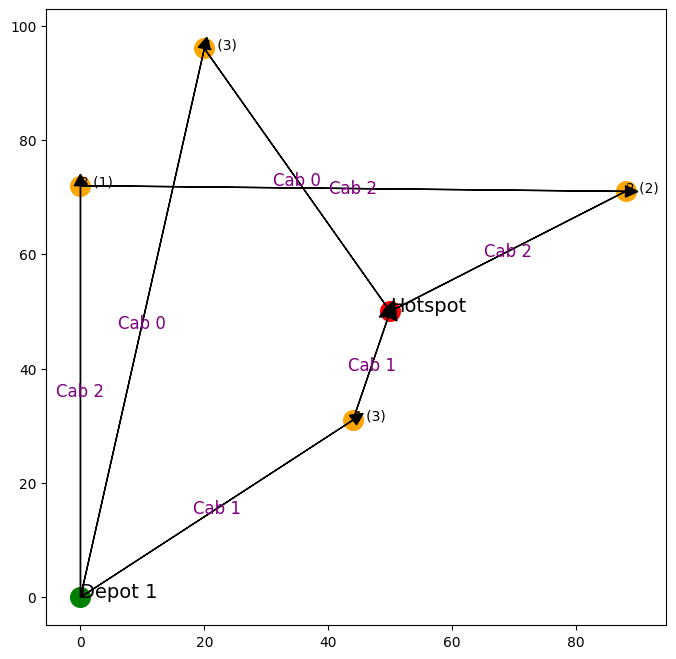

0 152.97932624803403 164.75436261295178 94.15221767139363
{1}
1 73.74864540836283 59.77457653551383 15.913219394907912
{4}
2 115.41658669218482 86.83317338436964 14.833173384369658
{2}
    x   y  demand  priority
2  88  71       2         2
4  44  31       3         2
Iteration  85
    x   y  demand  priority
0   0   0       0         0
1  15  68       3         1
2  19  97       1         1
3  32  93       3         1
4  93  86       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  15  68       3         1
2  19  97       1         1
3  32  93       3         1
4  93  86       3         1
5  88  71       2         2
6  44  31       3         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


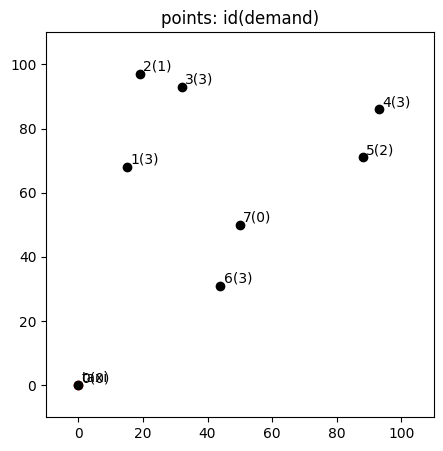

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 726.4526748639089


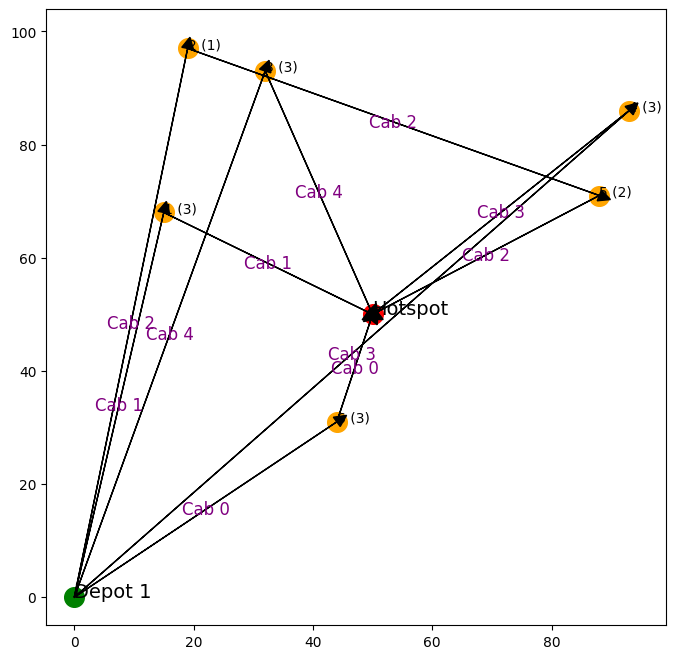

1 108.9920987425236 118.07201192492657 68.11591914486625
{1}
3 182.74915920137937 168.24089871371945 69.6121888691998
{4}
4 144.96685885094266 139.84634424968 64.80265752357732
{3}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  86
    x   y  demand  priority
0   0   0       0         0
1  55  94       2         1
2  46  75       2         1
3  87   3       1         1
4  56  29       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  55  94       2         1
2  46  75       2         1
3  87   3       1         1
4  56  29       1         1
5  50  50       0         1


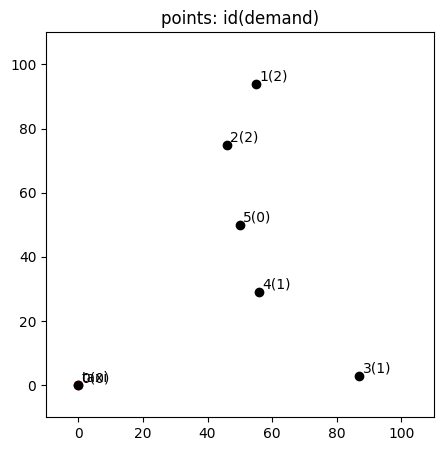

-1
1
Vehicle Requirements: 2
Moving Distance: 363.2531634289178


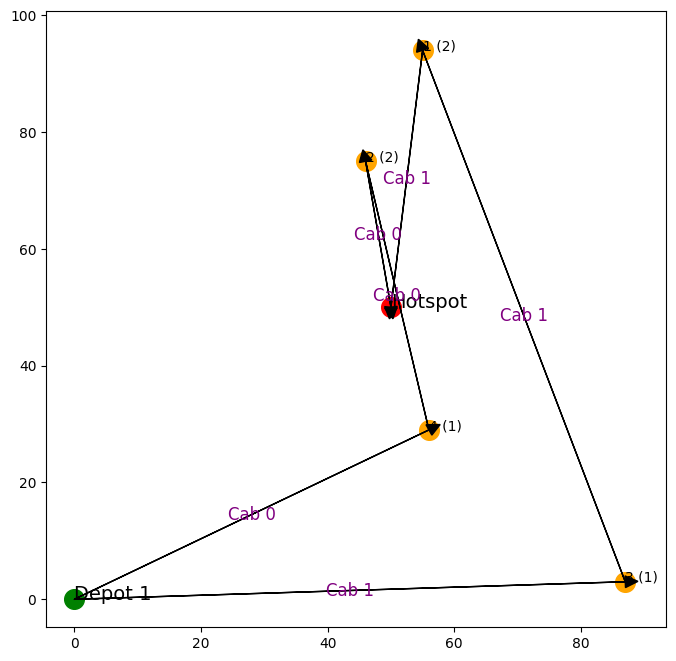

0 88.38143790405458 50.635955604688654 -12.427504497021602
{2}
1 131.33488842225051 88.56635930193812 1.5146505306566667
{1}
    x   y  demand  priority
1  55  94       2         2
2  46  75       2         2
Iteration  87
    x   y  demand  priority
0   0   0       0         0
1  47  37       2         1
2  40  35       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  47  37       2         1
2  40  35       1         1
3  55  94       2         2
4  46  75       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


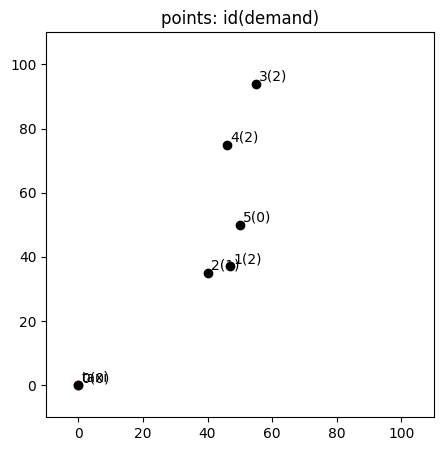

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 340.26483160371913


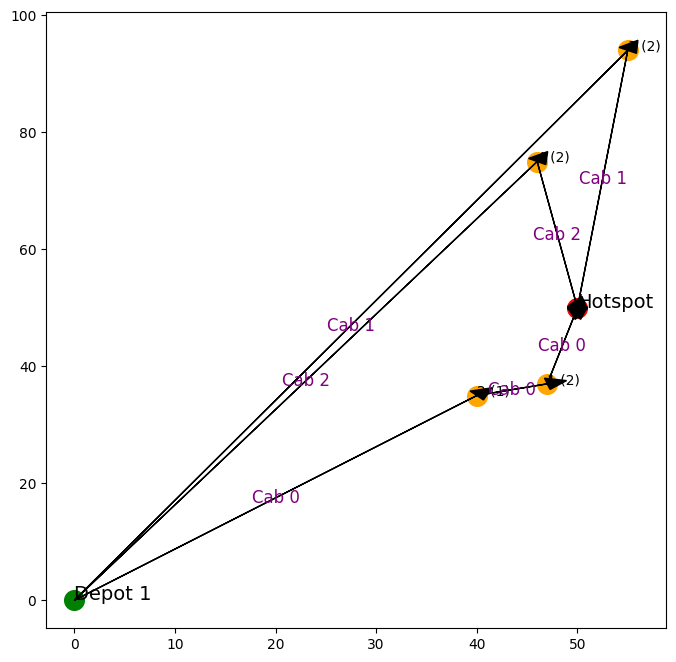

0 66.49239312779957 26.68332812825267 -26.46740093542057
{1}
    x   y  demand  priority
1  47  37       2         2
Iteration  88
    x   y  demand  priority
0   0   0       0         0
1  76  21       2         1
2  49  25       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  76  21       2         1
2  49  25       2         1
3  47  37       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


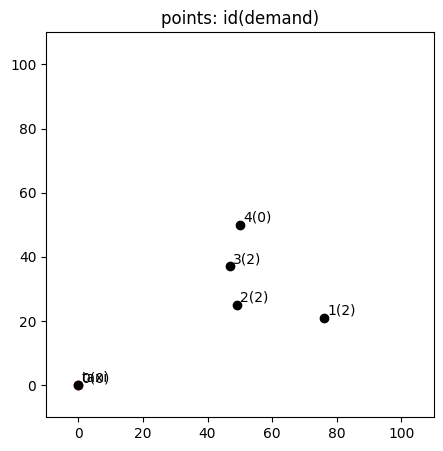

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 270.98377108295966


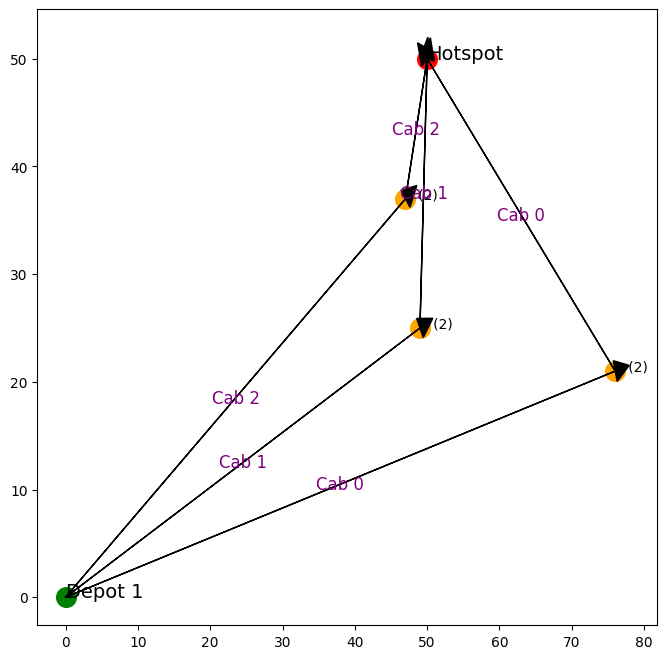

0 117.79663913958672 77.89736837660179 -0.9505865746840243
{1}
1 80.02908216429387 50.039984012787215 -4.969106145113045
{2}
    x   y  demand  priority
1  76  21       2         2
2  49  25       2         2
Iteration  89
    x   y  demand  priority
0   0   0       0         0
1  38  43       2         1
2  51  35       3         1
3  45  33       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  38  43       2         1
2  51  35       3         1
3  45  33       1         1
4  76  21       2         2
5  49  25       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


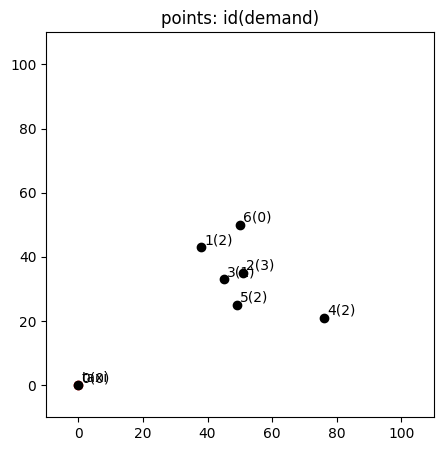

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 347.63512204036095


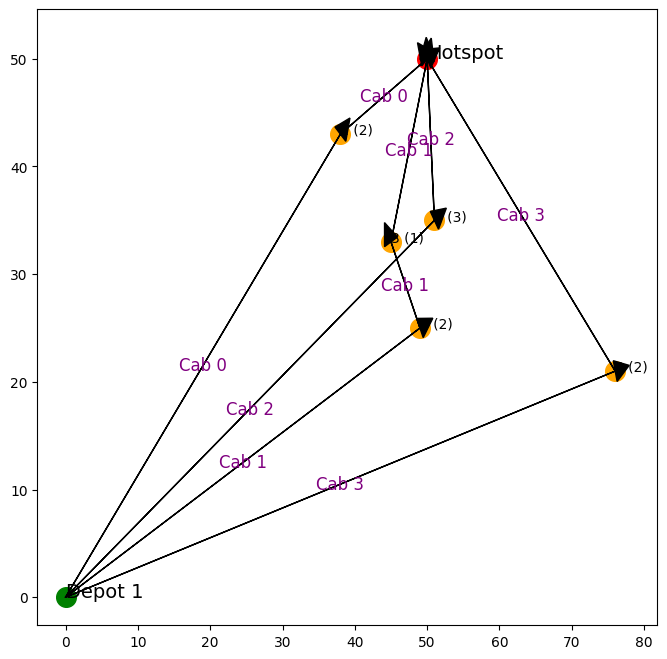

0 71.2771109310641 27.784887978899608 -29.599778962714687
{1}
1 72.72913530456961 17.72004514666935 -46.149067584565586
{3}
2 76.88796475514137 45.09988913511872 -9.238131052463288
{2}
    x   y  demand  priority
1  38  43       2         2
2  51  35       3         2
3  45  33       1         2
Iteration  90
    x   y  demand  priority
0   0   0       0         0
1  98  28       1         1
2   3  78       1         1
3  35  57       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  98  28       1         1
2   3  78       1         1
3  35  57       2         1
4  38  43       2         2
5  51  35       3         2
6  45  33       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


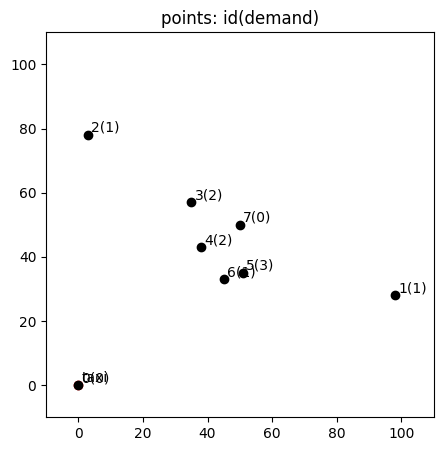

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 442.89107790882366


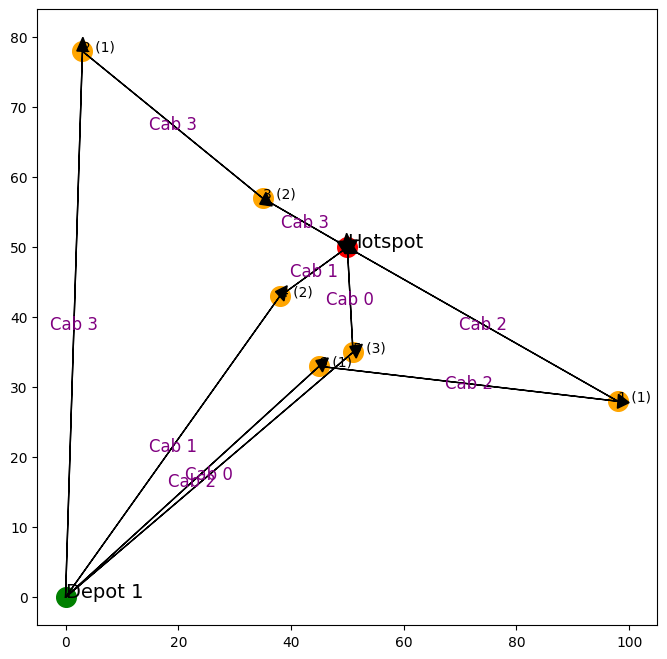

2 108.60474084299116 52.80151512977634 -29.402468148326648
{1}
3 132.88593476280224 87.81420818085343 -1.1646224915220955
{2, 3}
    x   y  demand  priority
1  98  28       1         2
2   3  78       1         2
3  35  57       2         2
Iteration  91
    x   y  demand  priority
0   0   0       0         0
1  94   2       1         1
2  18  47       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  94   2       1         1
2  18  47       2         1
3  98  28       1         2
4   3  78       1         2
5  35  57       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


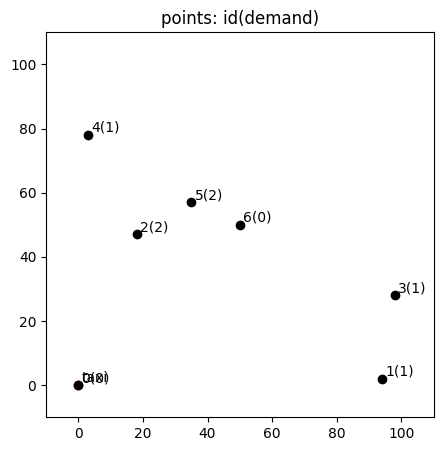

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 388.48385244547853


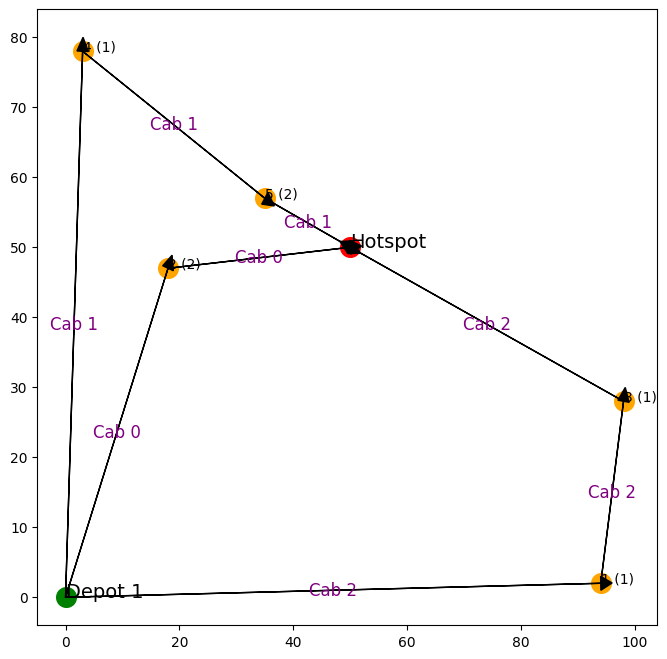

0 82.46923548862287 64.28063471995279 13.951716591306308
{2}
    x   y  demand  priority
2  18  47       2         2
Iteration  92
    x   y  demand  priority
0   0   0       0         0
1  94  10       3         1
2  55   4       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  94  10       3         1
2  55   4       2         1
3  18  47       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


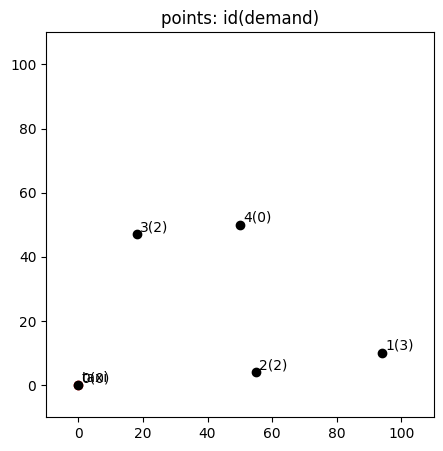

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 337.88013278355476


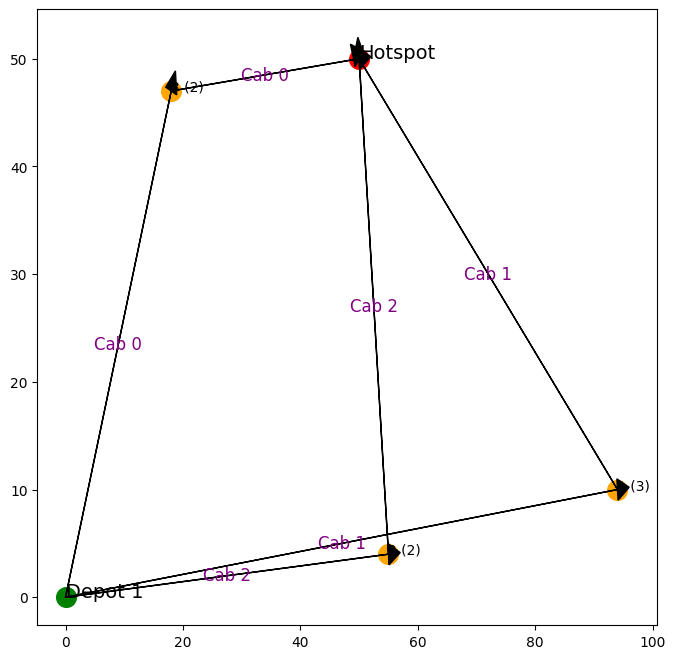

1 153.99469337404582 178.39282496782207 113.59454407768726
{1}
2 101.41620392088605 92.5418824100742 37.39661969422524
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  93
    x   y  demand  priority
0   0   0       0         0
1  52  54       3         1
2  51  23       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  52  54       3         1
2  51  23       2         1
3  50  50       0         1


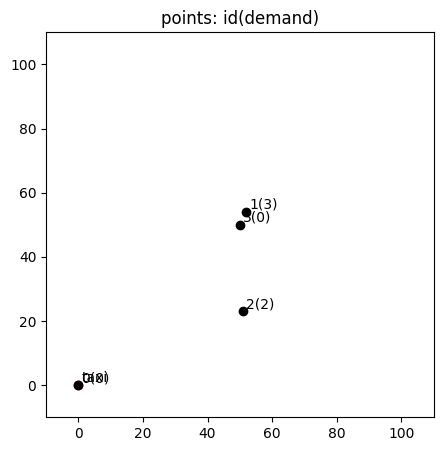

-1
1
Vehicle Requirements: 2
Moving Distance: 162.40371030597487


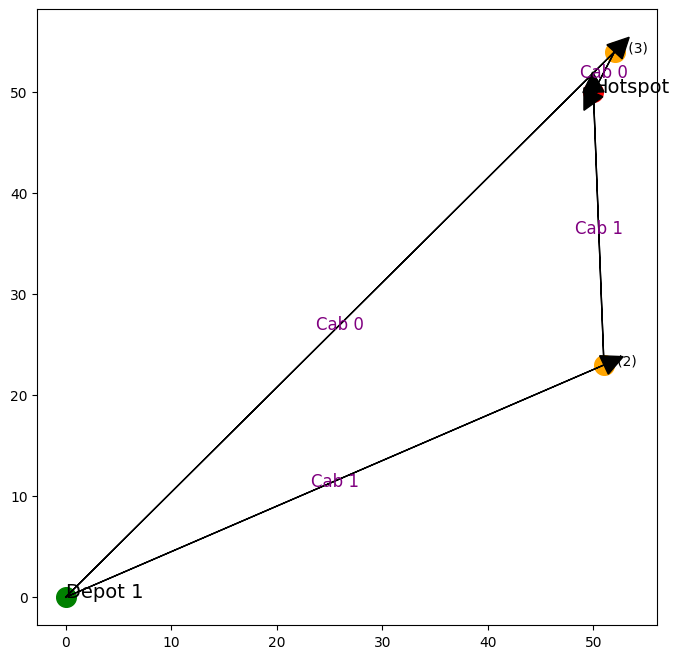

0 79.43879521096483 13.416407864998739 -59.31418341346672
{1}
1 82.96491509501006 54.037024344425184 -1.9093785783722836
{2}
    x   y  demand  priority
1  52  54       3         2
2  51  23       2         2
Iteration  94
    x   y  demand  priority
0   0   0       0         0
1  79  30       3         1
2  17  58       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  79  30       3         1
2  17  58       3         1
3  52  54       3         2
4  51  23       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


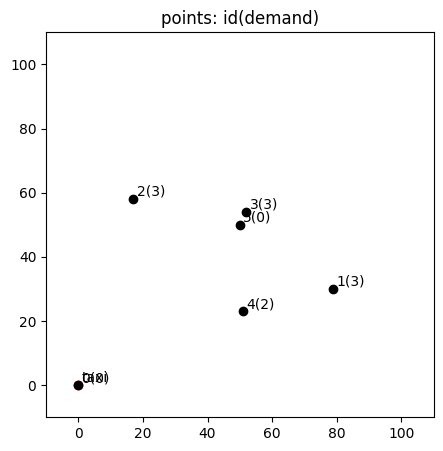

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 376.53188460462957


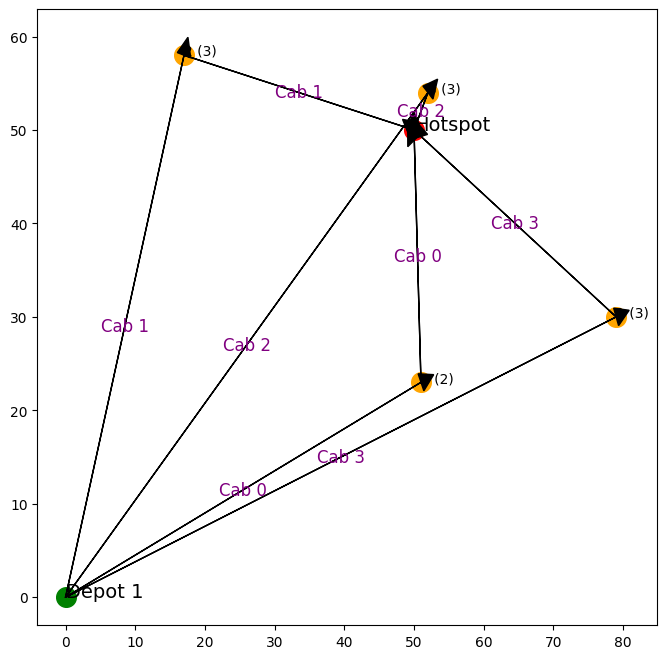

1 94.3959066377456 101.86756107809788 58.40543497940122
{2}
3 119.73226766090906 105.68348972285122 38.79296692336777
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  95
    x   y  demand  priority
0   0   0       0         0
1  71  93       2         1
2  22  37       1         1
3   0  96       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  71  93       2         1
2  22  37       1         1
3   0  96       2         1
4  50  50       0         1


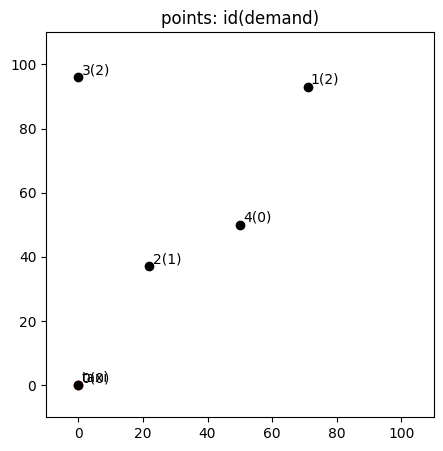

-1
1
Vehicle Requirements: 2
Moving Distance: 329.25260265107806


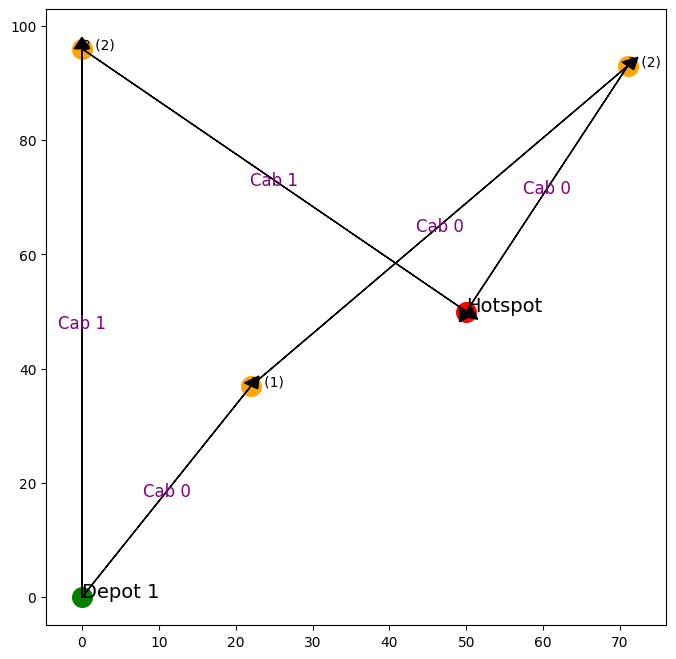

0 90.90043095608337 95.70788891204319 52.66140241198141
{1}
1 163.94115100585213 135.88230201170424 39.88230201170421
{3}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  96
    x   y  demand  priority
0   0   0       0         0
1  86  98       1         1
2  29  78       3         1
3  21  46       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  86  98       1         1
2  29  78       3         1
3  21  46       3         1
4  50  50       0         1


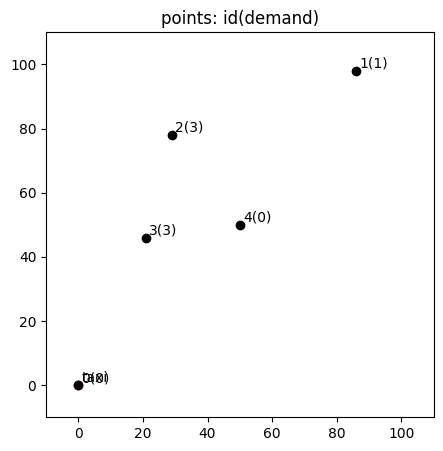

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 388.4419828452102


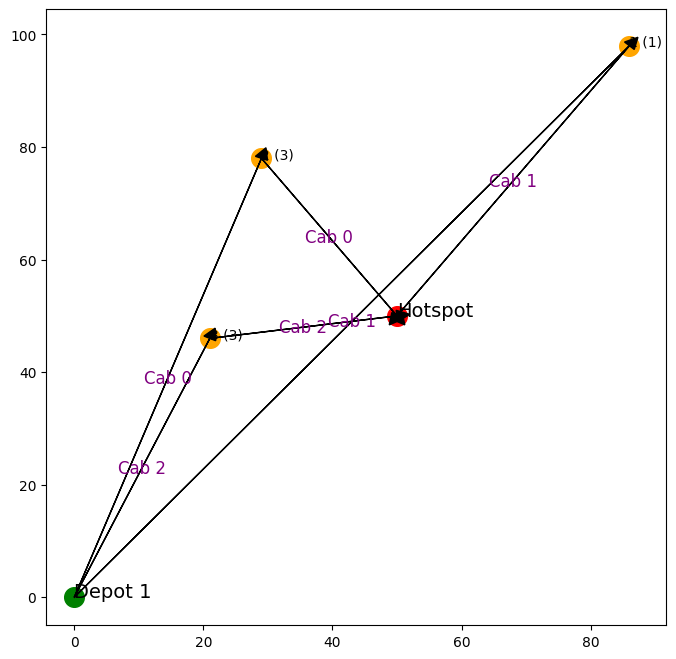

0 118.21658488546619 105.0 39.28341511453381
{2}
1 190.38404810405297 60.0 -100.38404810405297
{1}
2 79.84134985569102 87.82368700982668 51.894180659049
{3}
    x   y  demand  priority
1  86  98       1         2
Iteration  97
    x   y  demand  priority
0   0   0       0         0
1  64  57       2         1
2  45  44       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  64  57       2         1
2  45  44       3         1
3  86  98       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


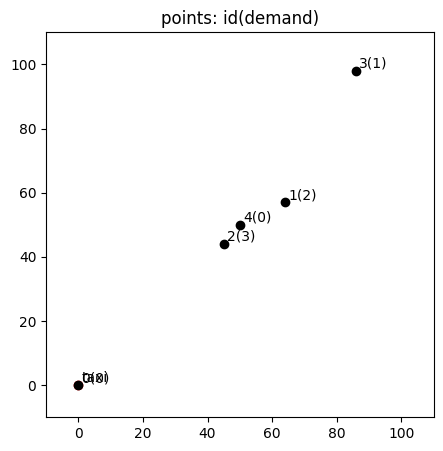

-1
1
Vehicle Requirements: 2
Moving Distance: 262.9792615269356


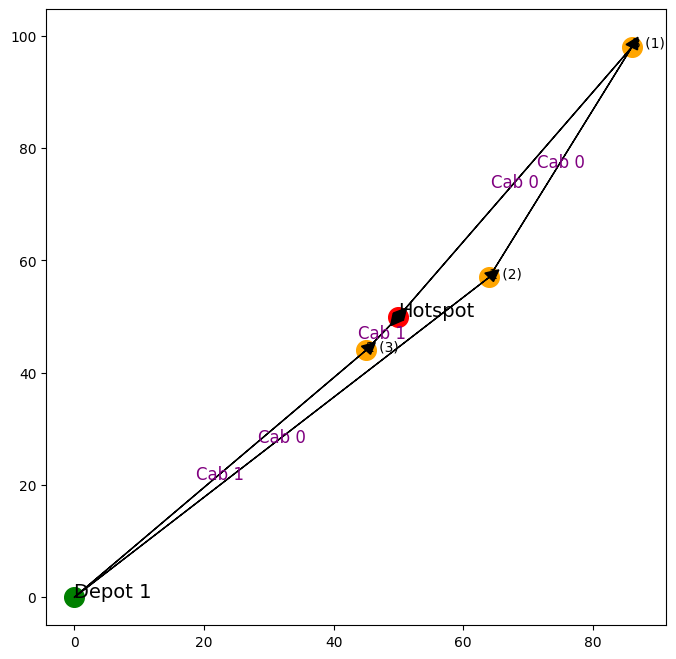

1 70.7467255861449 23.430749027719962 -35.600602044564965
{2}
    x   y  demand  priority
2  45  44       3         2
Iteration  98
    x   y  demand  priority
0   0   0       0         0
1  96  35       1         1
2  99  31       2         1
3  38   1       1         1
4  67  55       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  96  35       1         1
2  99  31       2         1
3  38   1       1         1
4  67  55       2         1
5  45  44       3         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


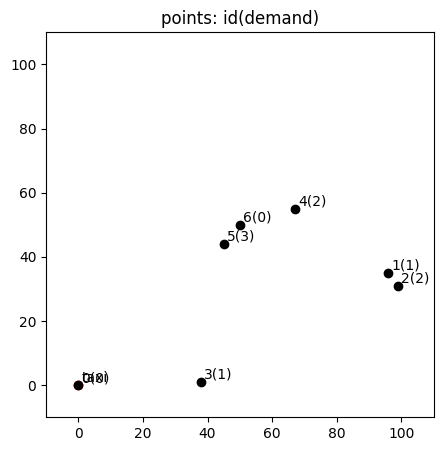

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 344.89823941158966


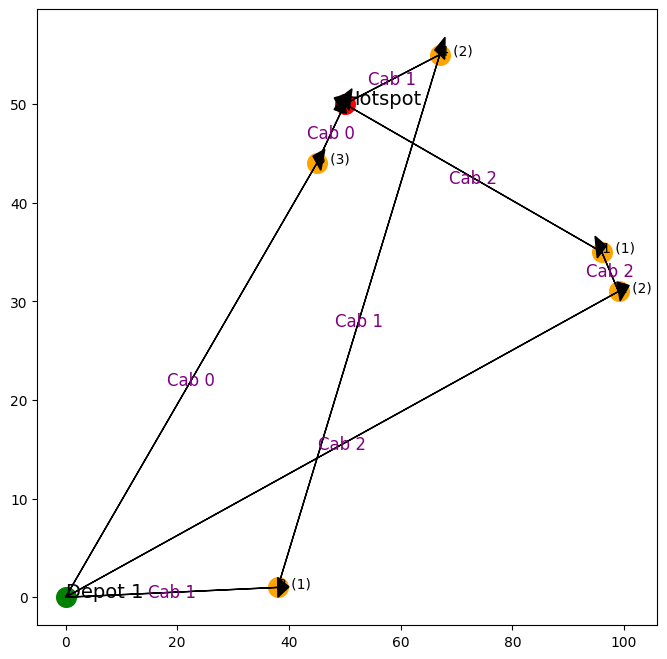

1 117.02757244705359 85.88808331585645 11.8045525267311
{3, 4}
2 152.12394137839118 48.38388161361178 -79.54811895797351
{1}
    x   y  demand  priority
1  96  35       1         2
3  38   1       1         2
4  67  55       2         2
Iteration  99
    x   y  demand  priority
0   0   0       0         0
1  10  48       2         1
2  12  83       2         1
3  79  58       2         1
4  28  94       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  10  48       2         1
2  12  83       2         1
3  79  58       2         1
4  28  94       2         1
5  96  35       1         2
6  38   1       1         2
7  67  55       2         2
8  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


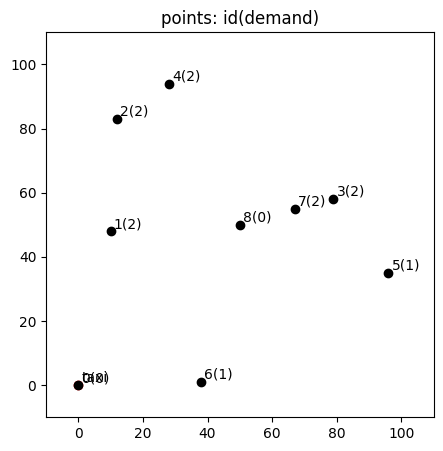

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 648.4402685164105


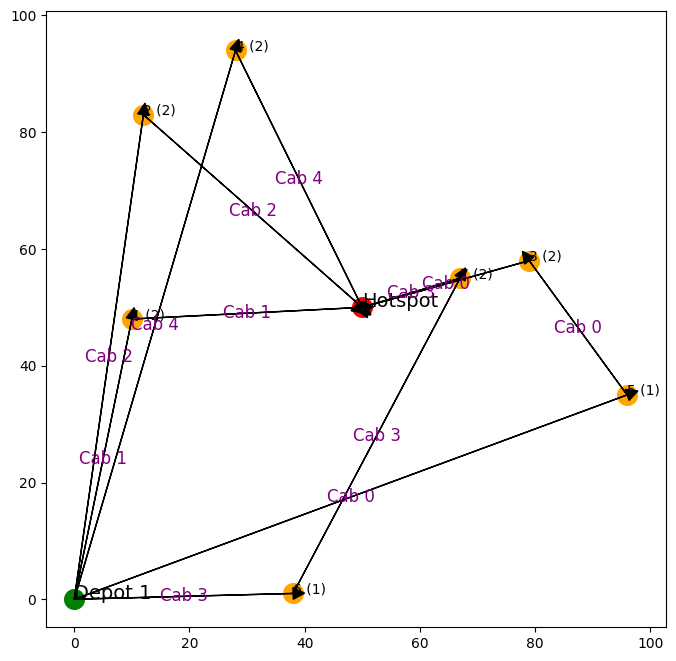

0 132.2644294931944 60.166435825965294 -42.01477575424646
{3}
1 89.08057147752663 80.09993757800315 31.069334889478085
{1}
2 134.1919016195765 100.65783625729296 16.794852766362936
{2}
4 147.2750941869092 98.38699100999075 0.30539232807691974
{4}
    x   y  demand  priority
2  12  83       2         2
3  79  58       2         2
4  28  94       2         2
Iteration  100
    x   y  demand  priority
0   0   0       0         0
1  91  19       3         1
2   5  42       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  91  19       3         1
2   5  42       1         1
3  12  83       2         2
4  79  58       2         2
5  28  94       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


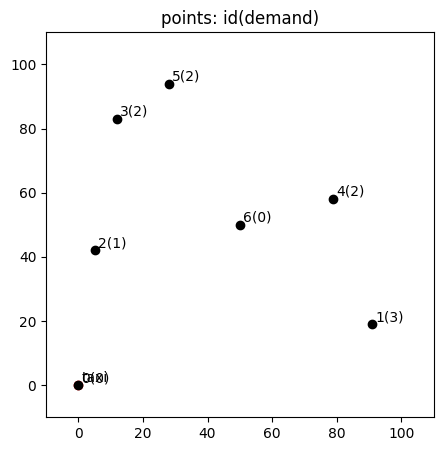

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 553.9449198649577


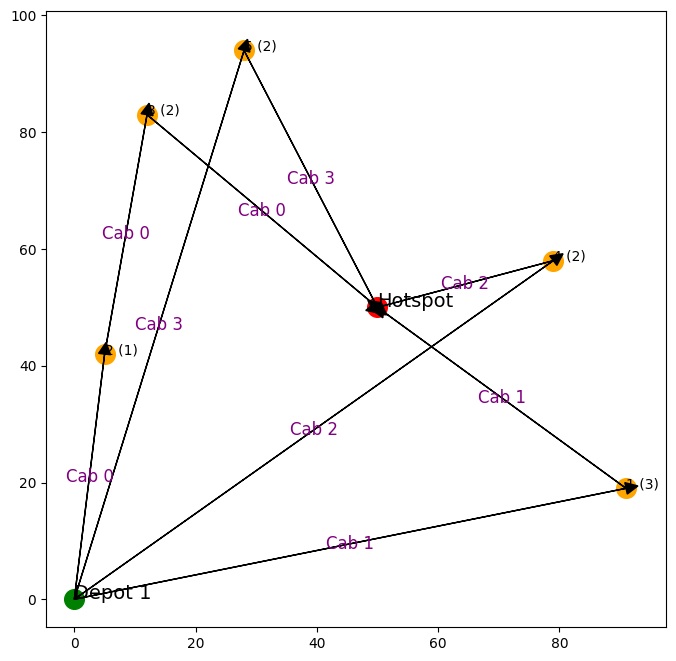

1 144.36274707712238 154.20116731075677 86.93900388901278
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  101
    x   y  demand  priority
0   0   0       0         0
1  52  31       2         1
2  98  72       2         1
3  48  24       2         1
4  98  63       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  52  31       2         1
2  98  72       2         1
3  48  24       2         1
4  98  63       2         1
5  50  50       0         1


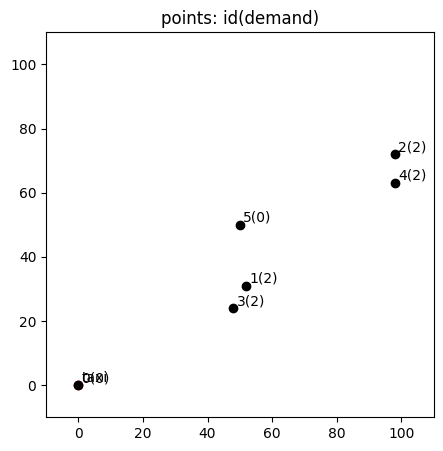

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 500.0265796405461


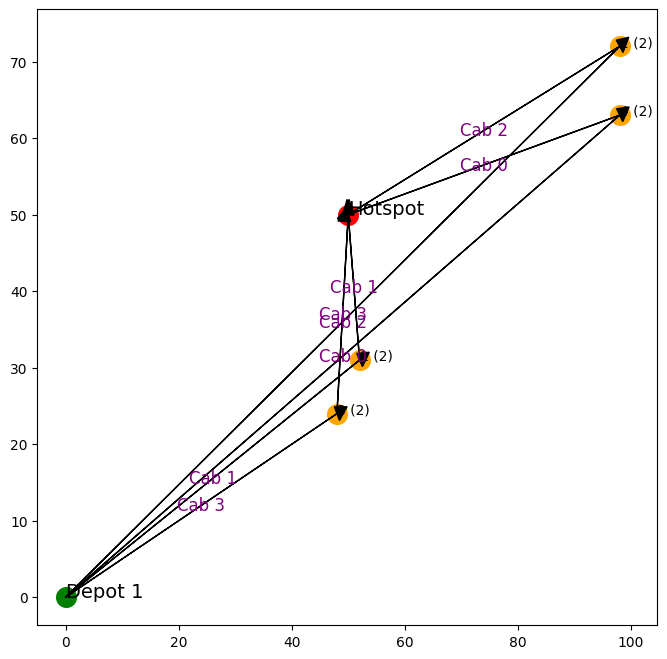

0 166.23248587627808 99.45853407325085 -17.044684766401815
{4}
1 79.64421664520404 38.2099463490856 -22.329297121575642
{1}
2 174.40743603825842 105.60303025955268 -16.002890648929395
{2}
3 79.74244108080555 52.15361924162119 -1.512012218373755
{3}
    x   y  demand  priority
1  52  31       2         2
2  98  72       2         2
3  48  24       2         2
4  98  63       2         2
Iteration  102
    x   y  demand  priority
0   0   0       0         0
1  54  30       2         1
2  92  74       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  54  30       2         1
2  92  74       1         1
3  52  31       2         2
4  98  72       2         2
5  48  24       2         2
6  98  63       2         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


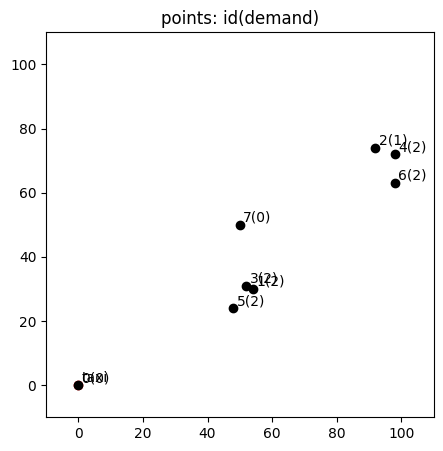

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 584.093025221191


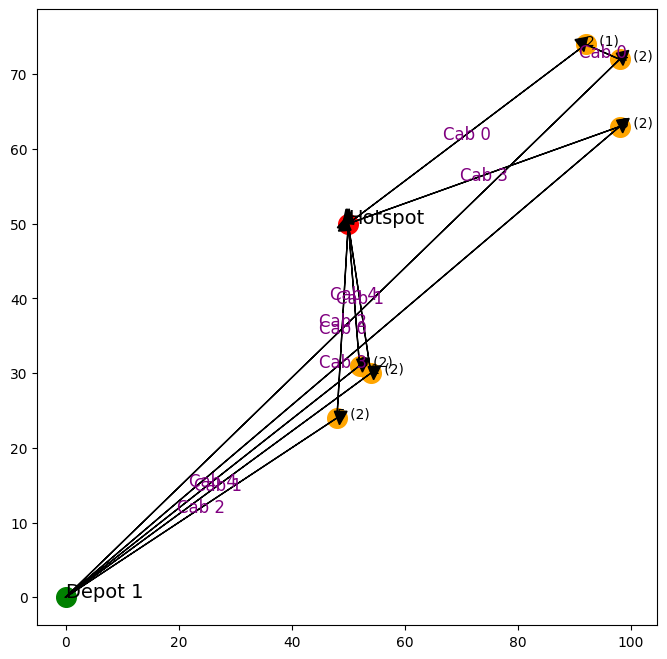

0 169.97946739827339 48.373546489791295 -97.41914766358644
{2}
1 82.16985890029315 40.792156108742276 -20.981624737179736
{1}
    x   y  demand  priority
1  54  30       2         2
2  92  74       1         2
Iteration  103
    x   y  demand  priority
0   0   0       0         0
1  52  67       3         1
2  90  70       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  52  67       3         1
2  90  70       1         1
3  54  30       2         2
4  92  74       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


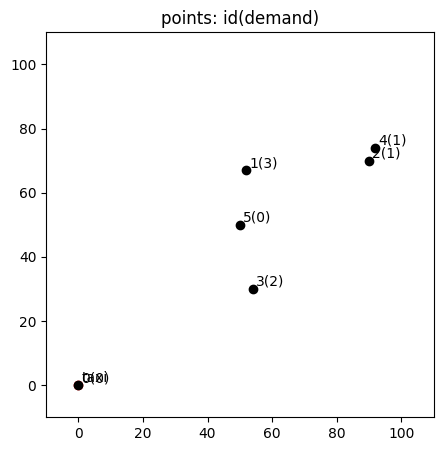

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 350.9618824400314


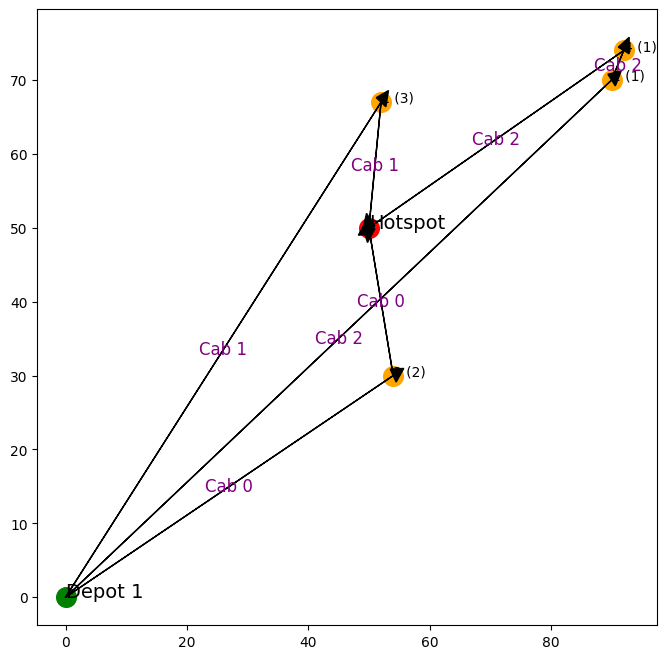

1 101.92879858503352 51.35172830587107 -24.90120612622691
{1}
    x   y  demand  priority
1  52  67       3         2
Iteration  104
    x   y  demand  priority
0   0   0       0         0
1  14  80       2         1
2  48  38       1         1
3  38  32       1         1
4  42  22       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  14  80       2         1
2  48  38       1         1
3  38  32       1         1
4  42  22       1         1
5  52  67       3         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


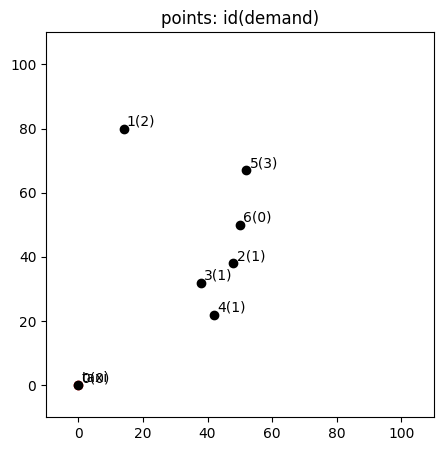

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 312.0168954865361


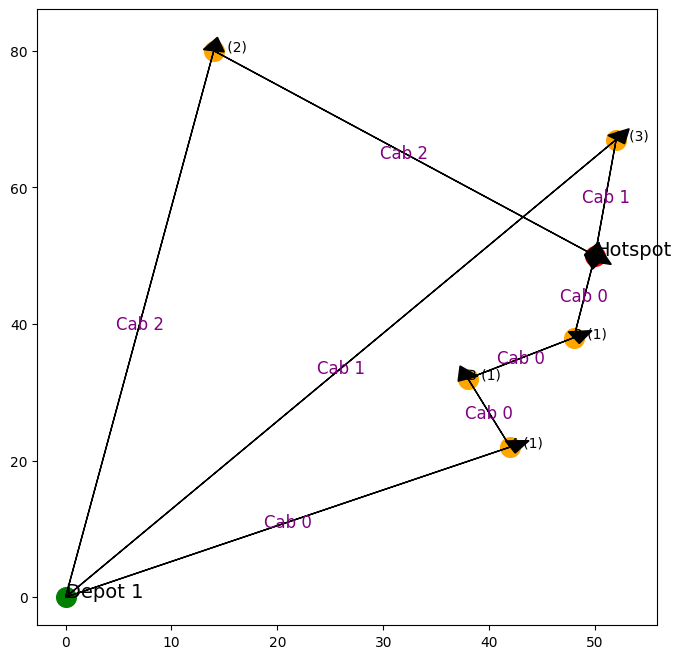

0 59.578603425115226 12.165525060596439 -41.33031583422057
{2}
2 128.07726007242775 93.72299611087985 12.50723409389201
{1}
    x   y  demand  priority
1  14  80       2         2
2  48  38       1         2
Iteration  105
    x   y  demand  priority
0   0   0       0         0
1  18  88       2         1
2  71  37       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  18  88       2         1
2  71  37       2         1
3  14  80       2         2
4  48  38       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


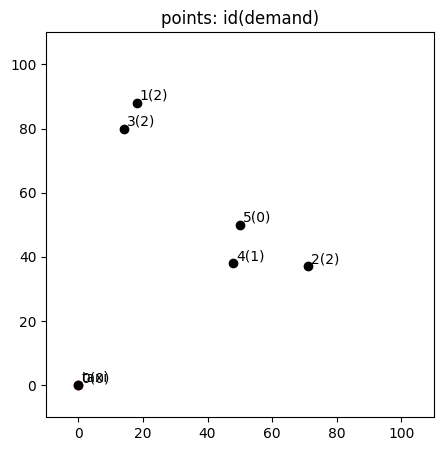

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 376.5190941544226


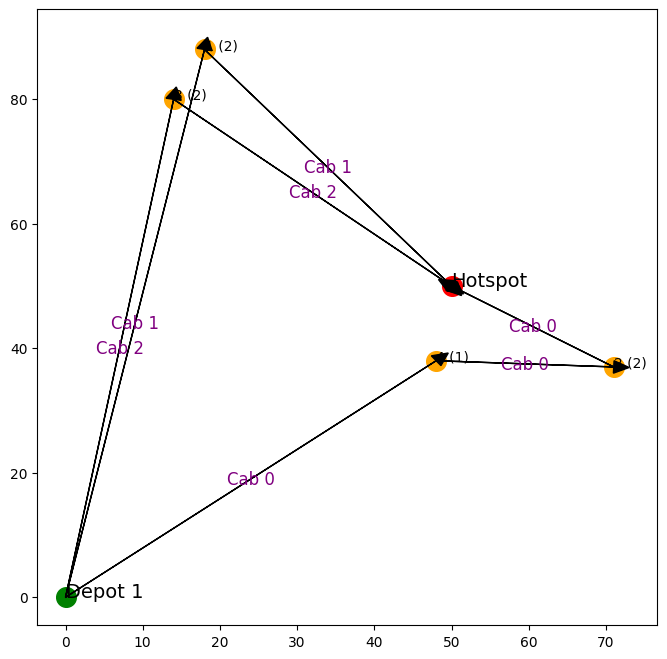

0 85.9190895305128 49.39635614091387 -11.824555319141993
{2}
1 139.50101568503936 99.35793878699377 9.535892495451293
{1}
    x   y  demand  priority
1  18  88       2         2
2  71  37       2         2
Iteration  106
    x   y  demand  priority
0   0   0       0         0
1  30  22       1         1
2  93  75       3         1
3  43  85       1         1
4  87   0       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  30  22       1         1
2  93  75       3         1
3  43  85       1         1
4  87   0       2         1
5  18  88       2         2
6  71  37       2         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


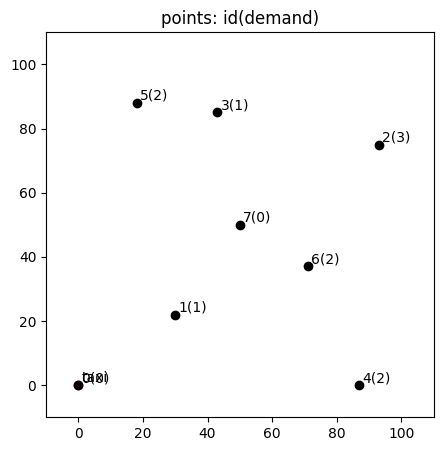

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 574.6670810950988


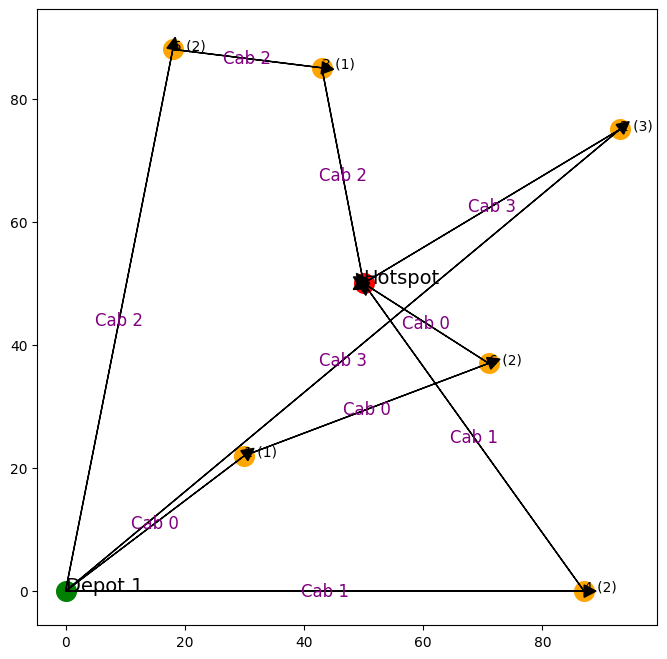

1 149.20128616033594 124.4025723206719 37.40257232067191
{4}
2 125.51518288669197 35.6931365951495 -71.97547799396773
{3}
3 169.2131669722228 149.21796138535063 54.61377510580314
{2}
    x   y  demand  priority
3  43  85       1         2
Iteration  107
    x   y  demand  priority
0   0   0       0         0
1   1  79       3         1
2  88   0       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   1  79       3         1
2  88   0       3         1
3  43  85       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


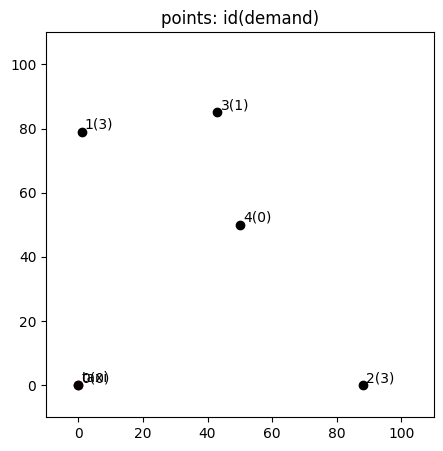

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 417.69684834282043


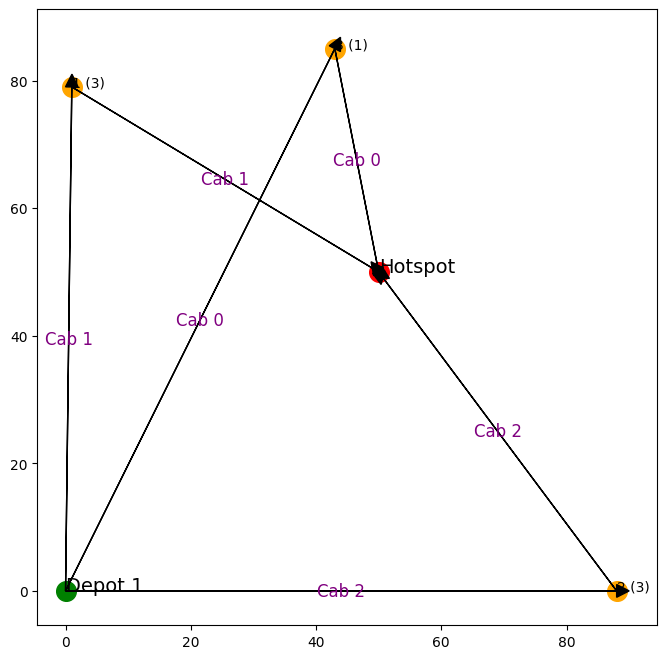

1 135.94489224236176 170.8156901458411 120.27864297639988
{1}
2 150.80127387243033 188.403821617291 131.80445855350615
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  108
    x   y  demand  priority
0   0   0       0         0
1   5  70       1         1
2  92  47       2         1
3  52  45       3         1
4  46   7       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   5  70       1         1
2  92  47       2         1
3  52  45       3         1
4  46   7       1         1
5  50  50       0         1


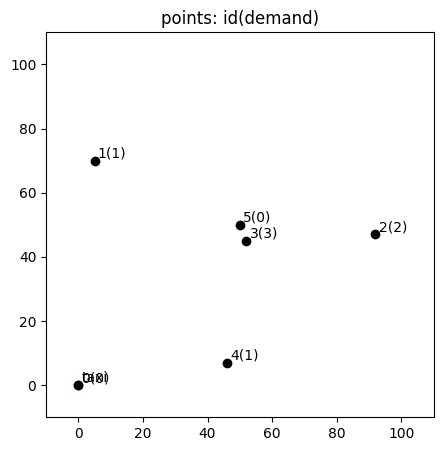

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 343.17109269791746


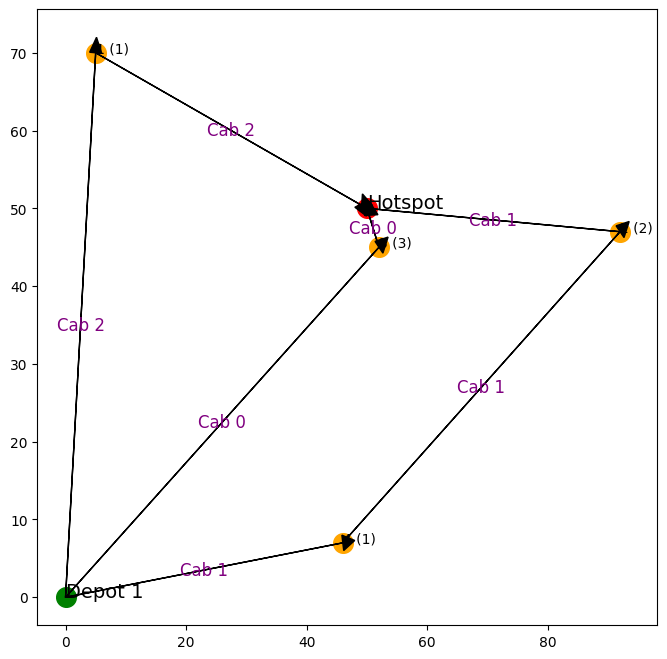

0 74.15288979495128 16.15549442140351 -49.919648162846016
{3}
1 88.63656703938196 84.2140130857092 37.68445258918183
{2}
2 119.42263324707153 49.24428900898052 -45.55619973360075
{1}
    x   y  demand  priority
1   5  70       1         2
3  52  45       3         2
Iteration  109
    x   y  demand  priority
0   0   0       0         0
1  68  46       2         1
2  10  89       1         1
3  82   7       3         1
4   4  89       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  68  46       2         1
2  10  89       1         1
3  82   7       3         1
4   4  89       2         1
5   5  70       1         2
6  52  45       3         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


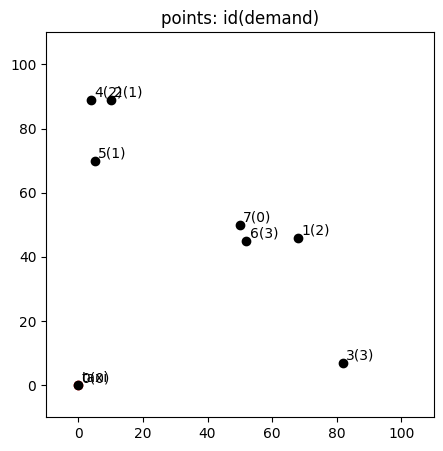

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 517.0413025656532


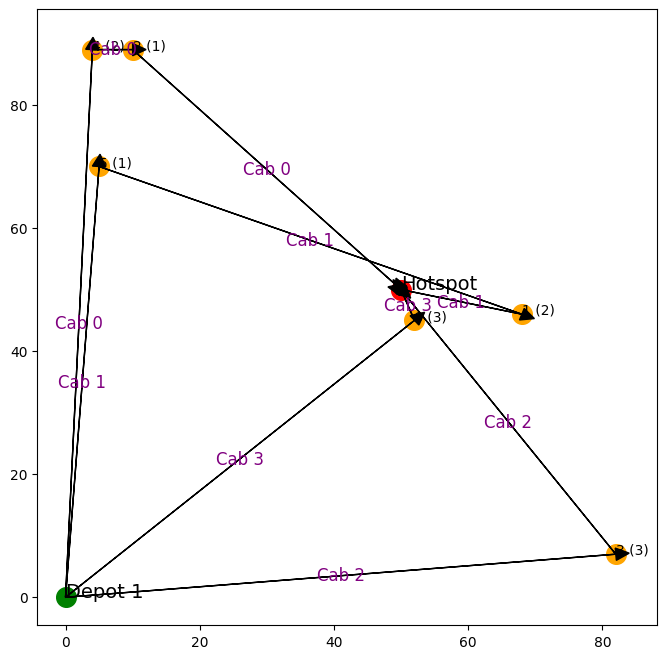

0 144.95575318802324 55.86591089385369 -61.1568868472427
{2}
1 88.61743315267677 36.87817782917155 -33.300166408919445
{1}
2 135.89861126726913 160.80111939908875 105.30306783136399
{3}
    x   y  demand  priority
1  68  46       2         2
2  10  89       1         2
Iteration  110
    x   y  demand  priority
0   0   0       0         0
1  83  64       3         1
2  13  82       3         1
3  25   4       3         1
4   9  20       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  83  64       3         1
2  13  82       3         1
3  25   4       3         1
4   9  20       2         1
5  68  46       2         2
6  10  89       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


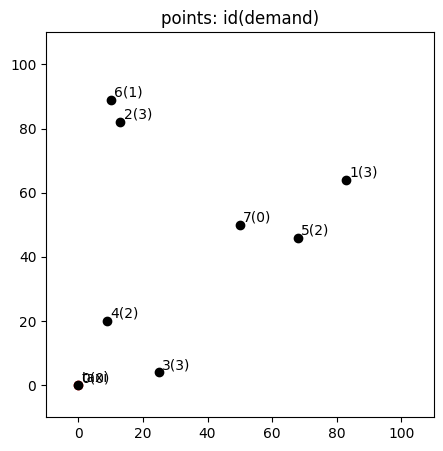

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 597.6126387735608


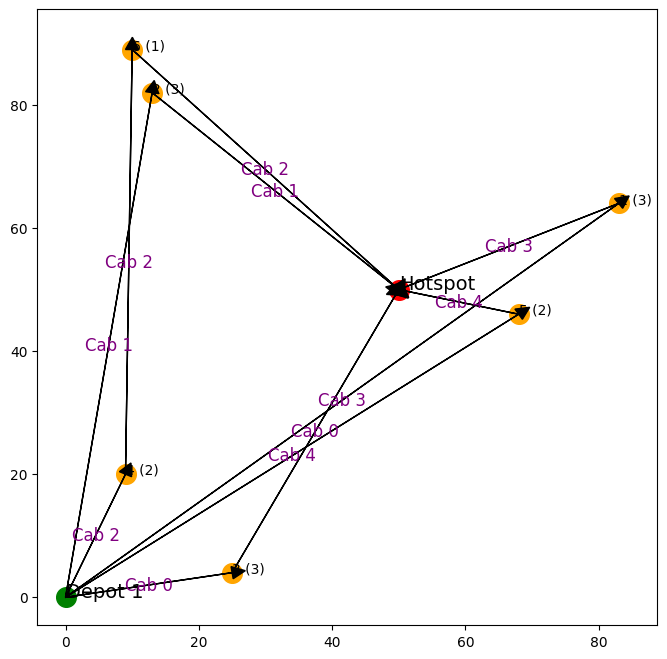

0 77.67253825317802 157.06368135250108 157.92298377557358
{3}
1 131.9423921232913 146.75489770362012 88.18995443213885
{2}
3 140.656247385751 107.54068997360952 20.65478757466329
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  111
    x   y  demand  priority
0   0   0       0         0
1  63  69       3         1
2  23  85       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  63  69       3         1
2  23  85       1         1
3  50  50       0         1


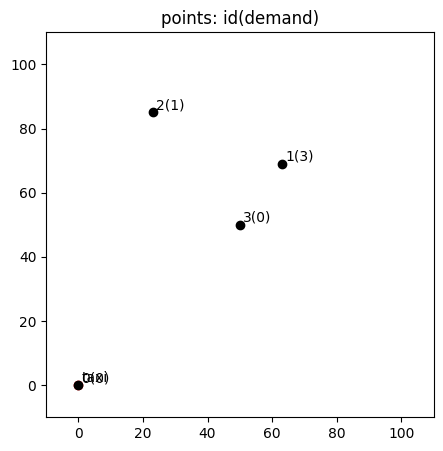

-1
1
Vehicle Requirements: 2
Moving Distance: 248.71706994243326


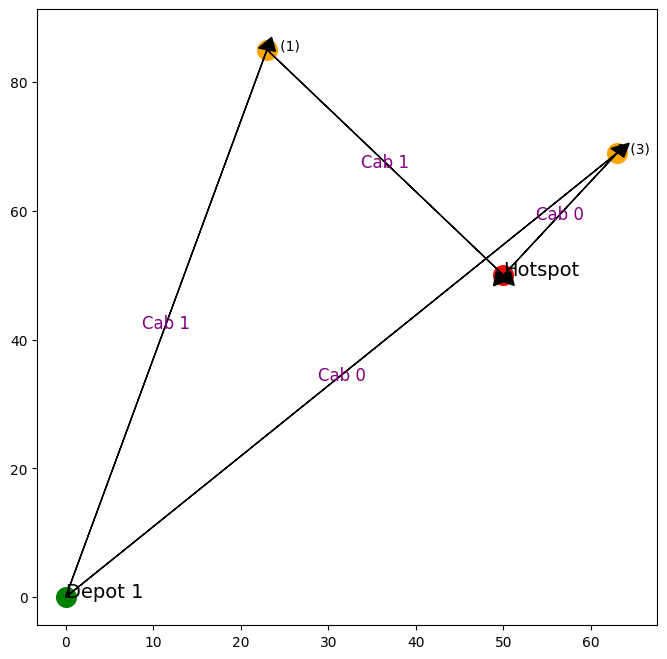

0 116.45619788082729 69.06518659932803 -12.858417981835245
{1}
1 132.26087206160594 44.204072210600685 -65.95476374570491
{2}
    x   y  demand  priority
1  63  69       3         2
2  23  85       1         2
Iteration  112
    x   y  demand  priority
0   0   0       0         0
1  81  11       1         1
2  72  30       3         1
3  26  73       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  81  11       1         1
2  72  30       3         1
3  26  73       3         1
4  63  69       3         2
5  23  85       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


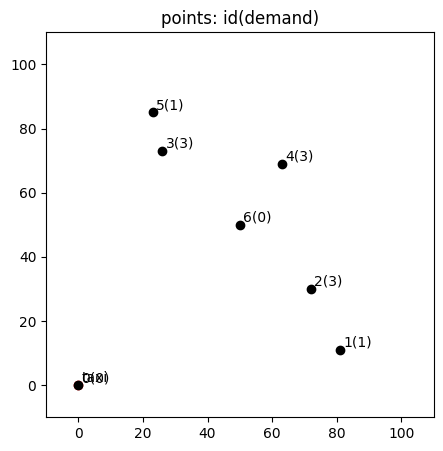

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 554.8906583865803


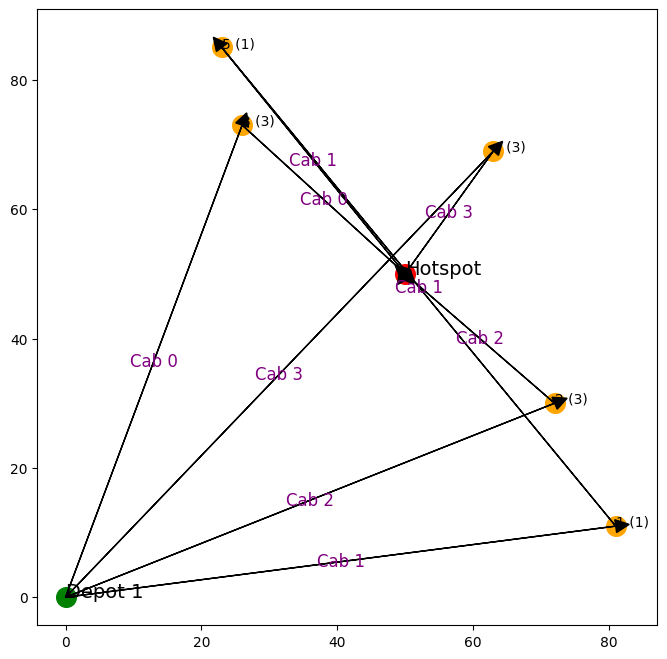

0 110.73347534142681 99.72462083156796 38.85345590592513
{3}
2 107.73213749463702 89.19641248391103 26.062481231229526
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  113
    x   y  demand  priority
0   0   0       0         0
1  70  94       1         1
2  62  59       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  70  94       1         1
2  62  59       1         1
3  50  50       0         1


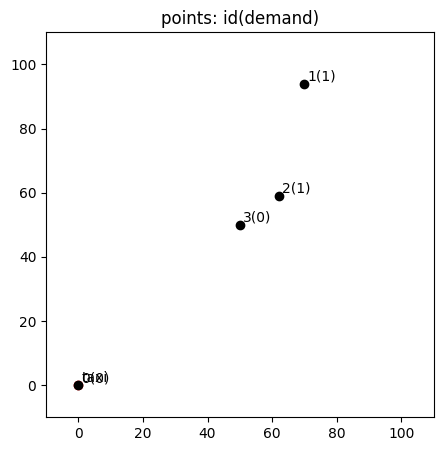

1
Vehicle Requirements: 1
Moving Distance: 168.10332873390138


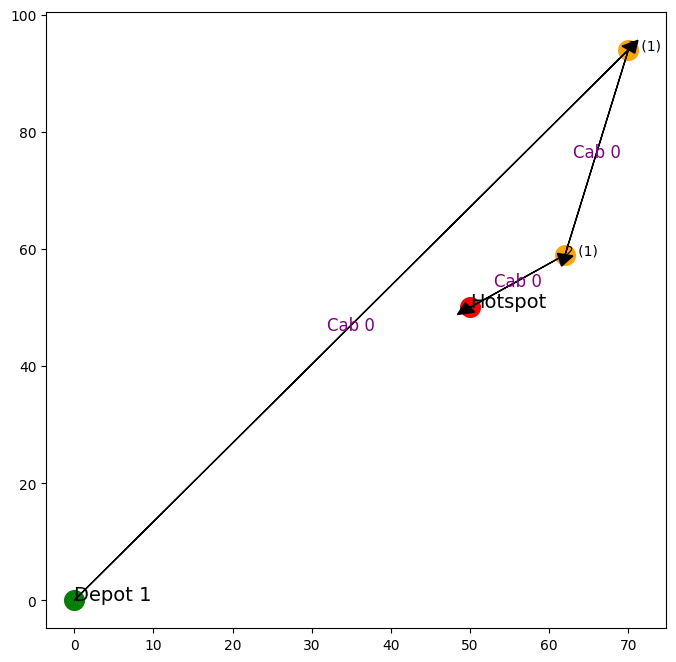

0 168.10332873390138 63.33218389437829 -73.10505289233394
{1, 2}
    x   y  demand  priority
1  70  94       1         2
2  62  59       1         2
Iteration  114
    x   y  demand  priority
0   0   0       0         0
1  54  60       3         1
2   5   6       2         1
3   1  62       3         1
4   6  51       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  54  60       3         1
2   5   6       2         1
3   1  62       3         1
4   6  51       1         1
5  70  94       1         2
6  62  59       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


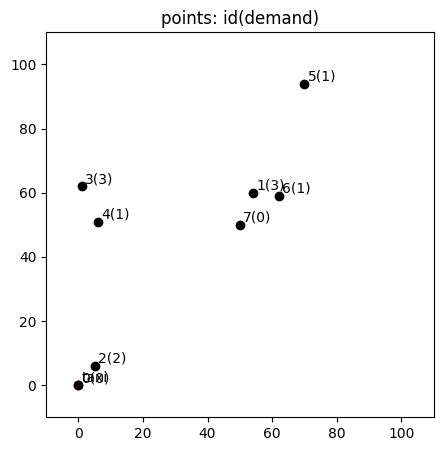

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 454.0530570497924


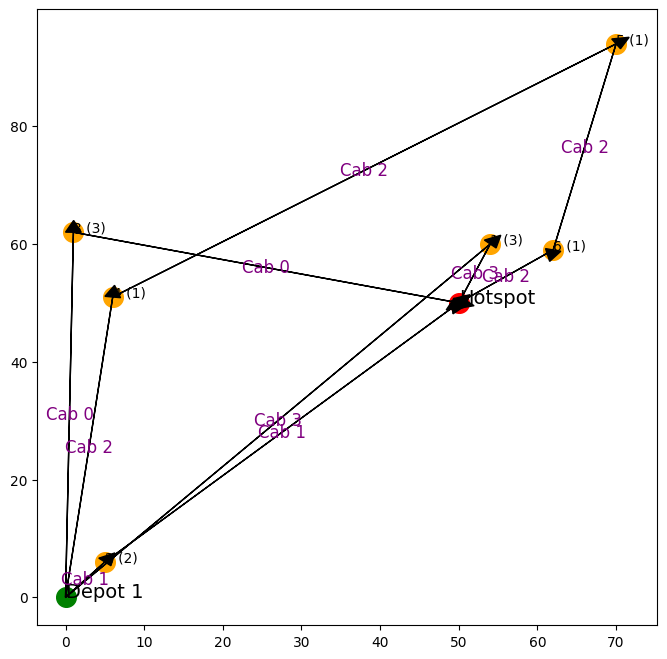

0 112.45605701422774 151.34397906755328 114.55991158710218
{3}
1 70.7467255861449 125.8729518204765 118.06270214456985
{2}
3 91.49207389671126 32.31098884280702 -43.02559063250073
{1}
    x   y  demand  priority
1  54  60       3         2
Iteration  115
    x   y  demand  priority
0   0   0       0         0
1  38  82       3         1
2  24  84       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  38  82       3         1
2  24  84       3         1
3  54  60       3         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


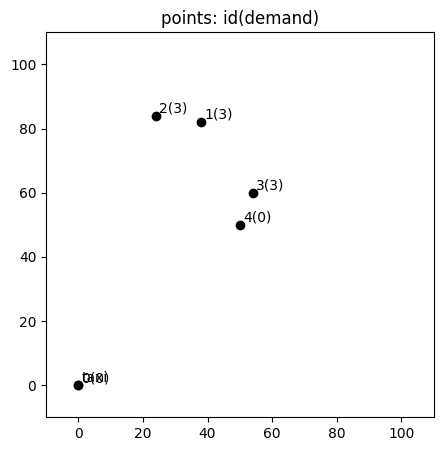

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 346.2082648889731


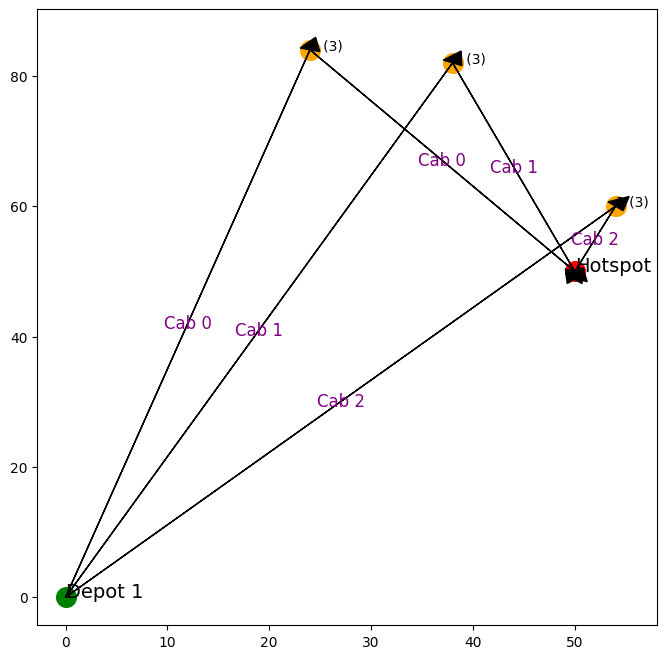

0 130.16318778943162 128.40560735419618 62.445223241862664
{2}
1 124.55300320283015 102.52804494381036 29.23906421288538
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  116
    x   y  demand  priority
0   0   0       0         0
1  12  30       1         1
2  19  64       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  12  30       1         1
2  19  64       1         1
3  50  50       0         1


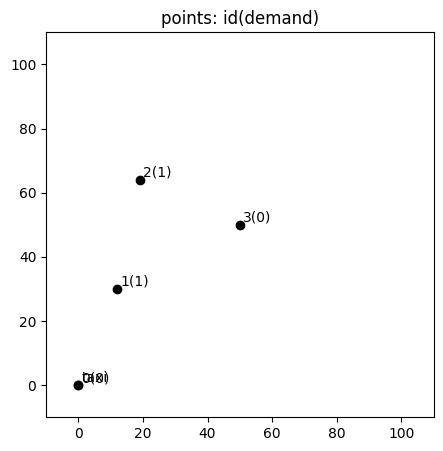

1
Vehicle Requirements: 1
Moving Distance: 101.03880146161649


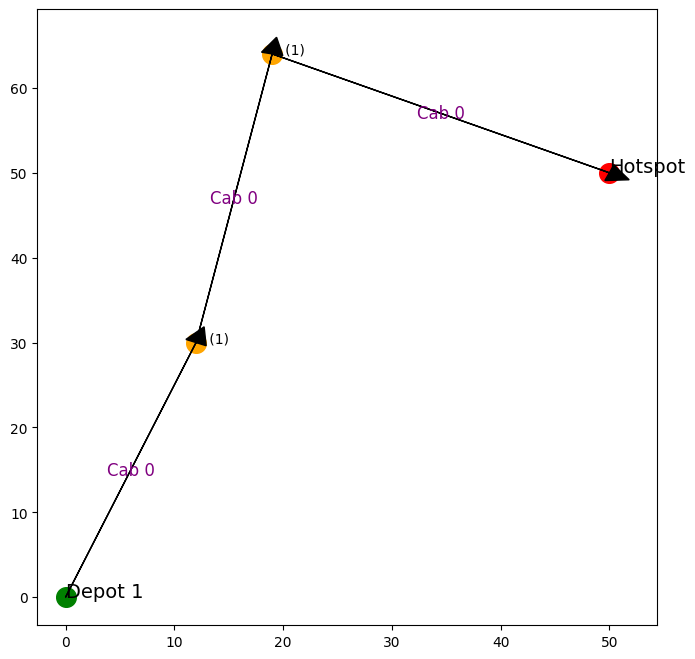

0 101.03880146161649 76.95652381055768 14.39598425422004
{1, 2}
    x   y  demand  priority
1  12  30       1         2
2  19  64       1         2
Iteration  117
    x   y  demand  priority
0   0   0       0         0
1  58  48       1         1
2  81  11       1         1
3  86  86       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  58  48       1         1
2  81  11       1         1
3  86  86       1         1
4  12  30       1         2
5  19  64       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


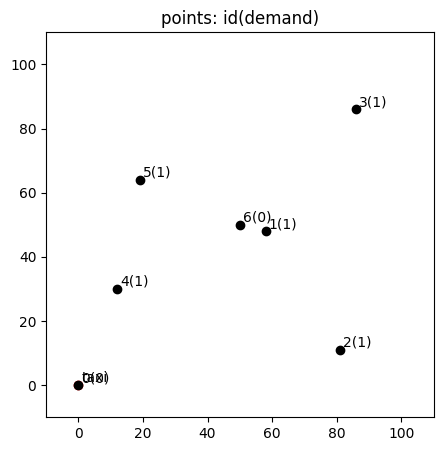

-1
1
Vehicle Requirements: 2
Moving Distance: 313.3966907602834


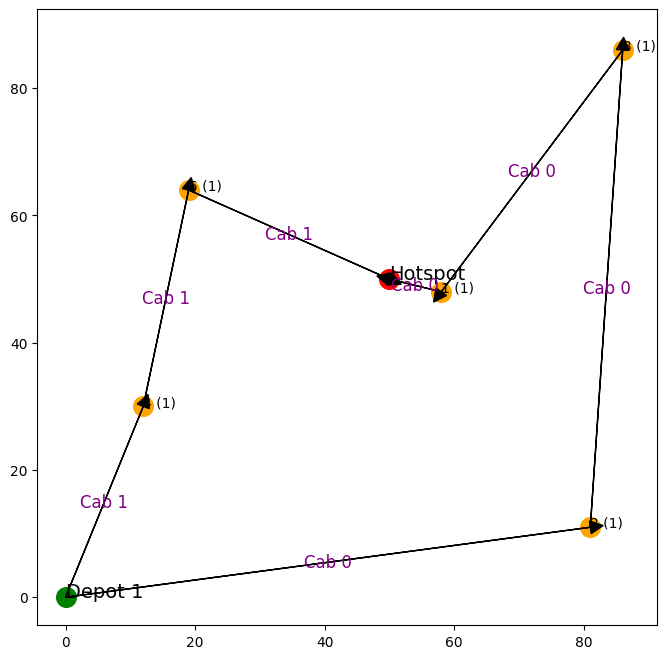

0 89.98971252197855 8.246211251235321 -77.62039564512557
{1}
    x   y  demand  priority
1  58  48       1         2
Iteration  118
    x   y  demand  priority
0   0   0       0         0
1  76  92       3         1
2  77  68       2         1
3  43   1       1         1
4  75  91       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  76  92       3         1
2  77  68       2         1
3  43   1       1         1
4  75  91       1         1
5  58  48       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


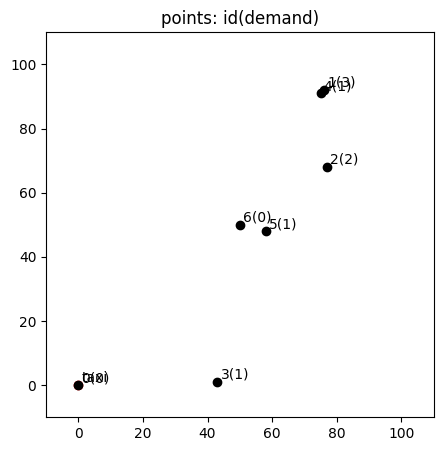

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 442.78170877141855


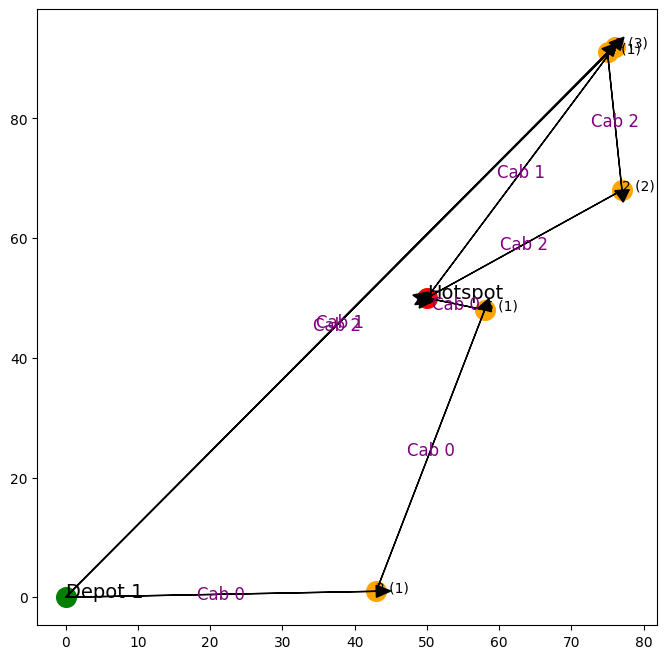

1 168.72782726232427 148.18906842274163 53.55577537178817
{1}
2 150.37366562723938 64.89992295835181 -53.023781189711656
{2}
    x   y  demand  priority
2  77  68       2         2
Iteration  119
    x   y  demand  priority
0   0   0       0         0
1   7  84       2         1
2  92  88       3         1
3  10   3       3         1
4  45  66       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   7  84       2         1
2  92  88       3         1
3  10   3       3         1
4  45  66       3         1
5  77  68       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


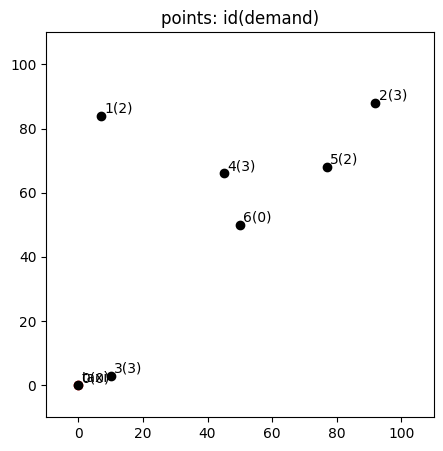

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 627.038271570622


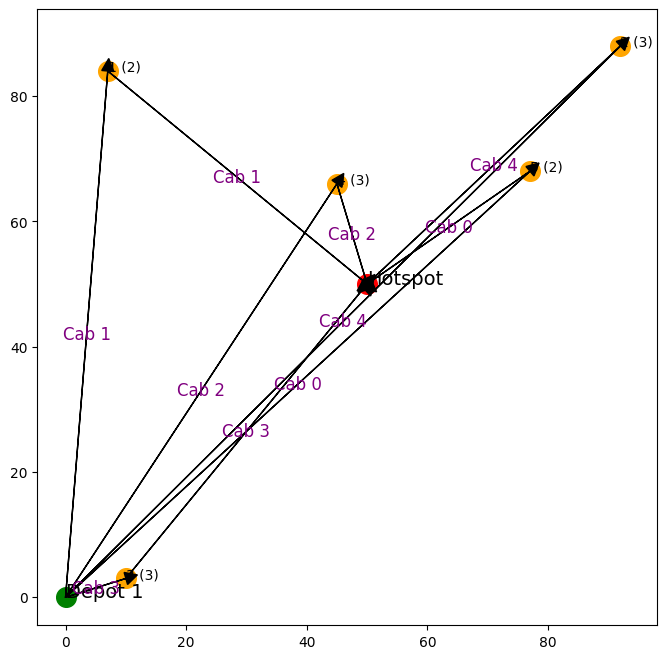

1 139.10904234620904 109.63576058932597 25.344598537779916
{1}
2 96.6442163484063 50.28916384272063 -21.21047058432535
{4}
3 72.15740300574844 185.15128949051368 205.56953123002205
{3}
4 183.94985273674158 169.91762710207556 70.92658791637174
{2}
    x   y  demand  priority
4  45  66       3         2
Iteration  120
    x   y  demand  priority
0   0   0       0         0
1  53  39       2         1
2  93  50       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  53  39       2         1
2  93  50       3         1
3  45  66       3         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


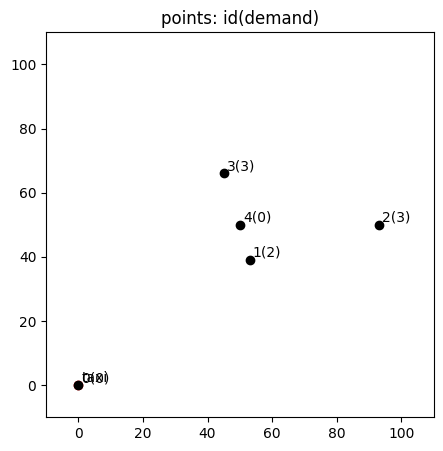

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 322.4375312711486


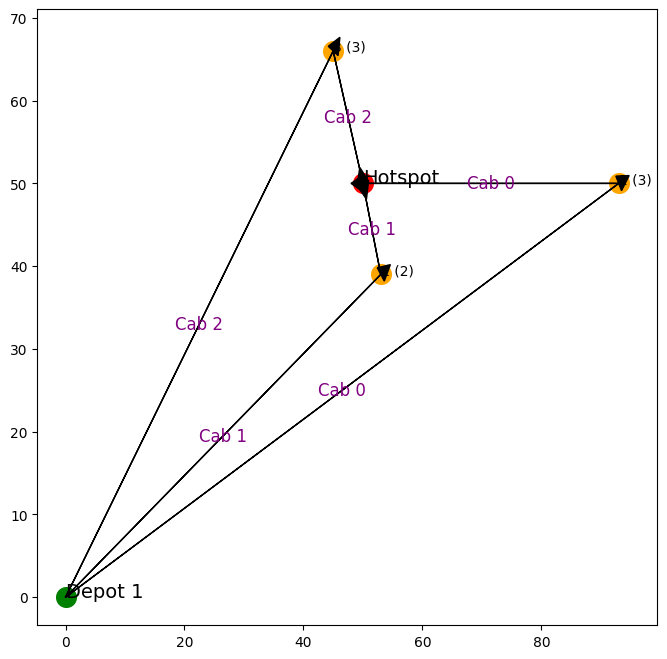

0 148.5888251663025 129.0 44.91117483369749
{2}
1 77.20448975643978 22.80350850198276 -42.99922700346565
{1}
    x   y  demand  priority
1  53  39       2         2
Iteration  121
    x   y  demand  priority
0   0   0       0         0
1  70  54       1         1
2  98   2       3         1
3  34  78       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  70  54       1         1
2  98   2       3         1
3  34  78       2         1
4  53  39       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


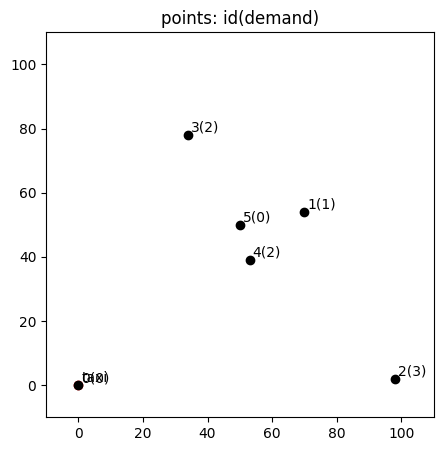

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 391.8580296937607


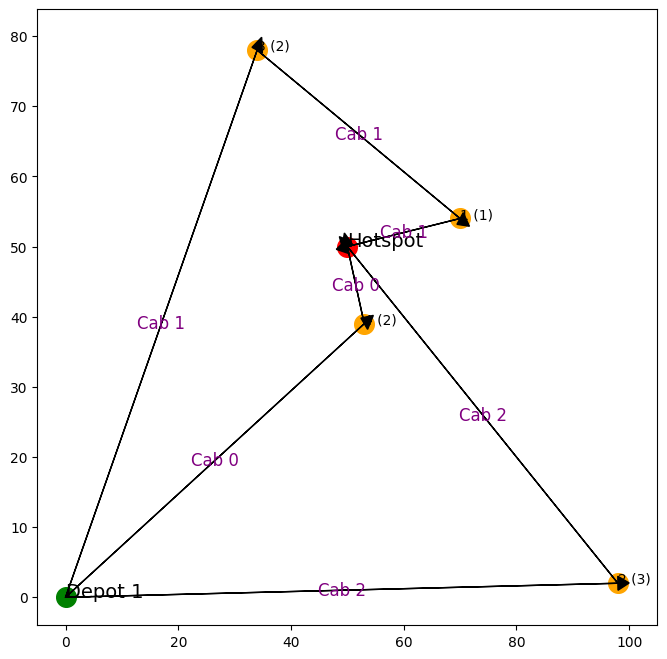

1 105.48426759910174 20.396078054371138 -74.89015051754504
{1}
2 165.90265703265132 203.64675298172568 139.56747243993718
{2}
    x   y  demand  priority
1  70  54       1         2
Iteration  122
    x   y  demand  priority
0   0   0       0         0
1  92  56       3         1
2  98  89       3         1
3  53  51       1         1
4  64  93       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  92  56       3         1
2  98  89       3         1
3  53  51       1         1
4  64  93       1         1
5  70  54       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


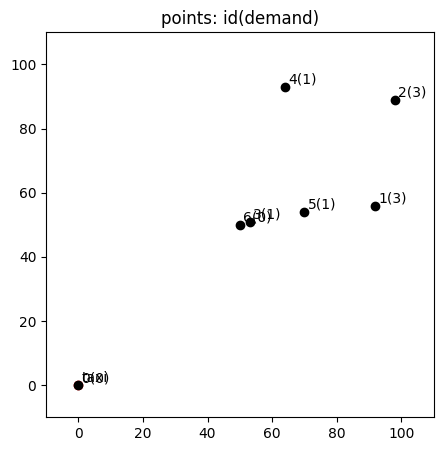

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 517.1358591857564


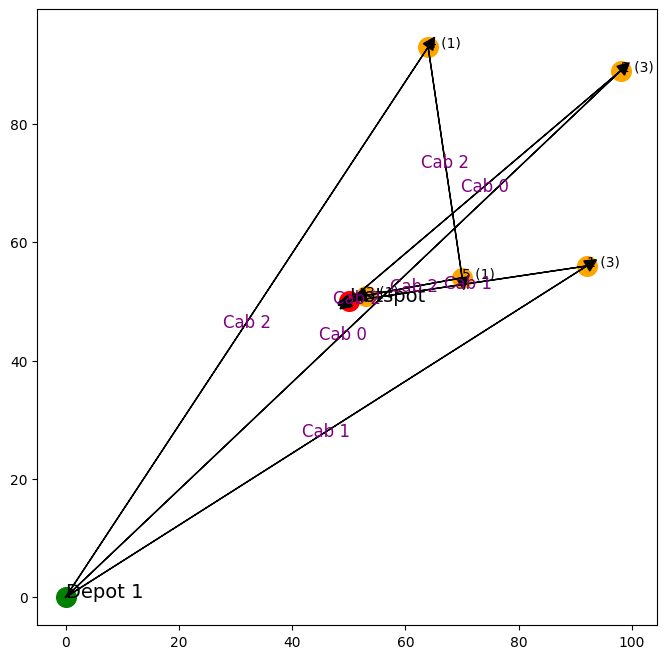

0 194.22860733300217 185.53975315279473 84.08102239618995
{2}
1 150.12970301388293 127.27922061357856 40.78912790648491
{1}
2 116.0560330233416 3.1622776601683795 -111.31261653308903
{3}
    x   y  demand  priority
3  53  51       1         2
Iteration  123
    x   y  demand  priority
0   0   0       0         0
1  95   7       2         1
2  90  86       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  95   7       2         1
2  90  86       1         1
3  53  51       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


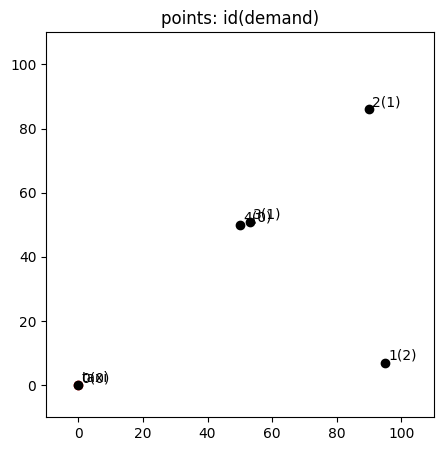

-1
1
Vehicle Requirements: 2
Moving Distance: 304.9450913837285


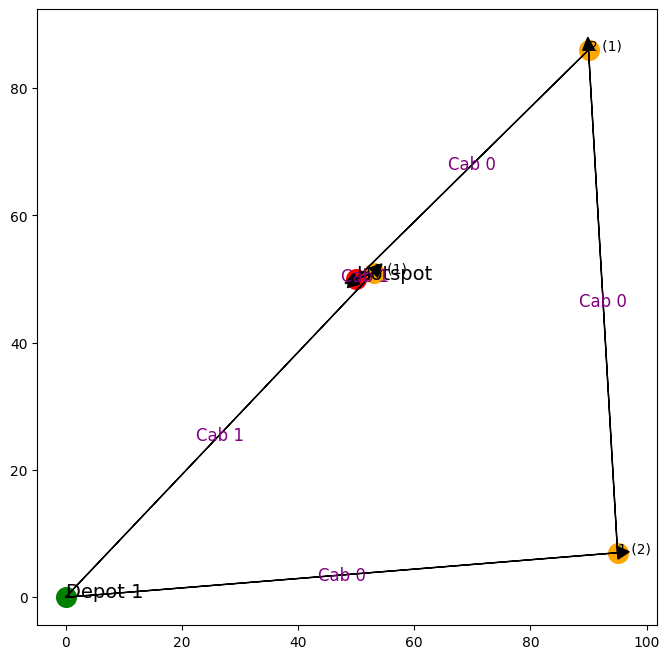

0 228.23011152982693 178.29742674505832 39.21602858776052
{1, 2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  124
    x   y  demand  priority
0   0   0       0         0
1  75  89       2         1
2  94  77       1         1
3  98  49       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  75  89       2         1
2  94  77       1         1
3  98  49       1         1
4  50  50       0         1


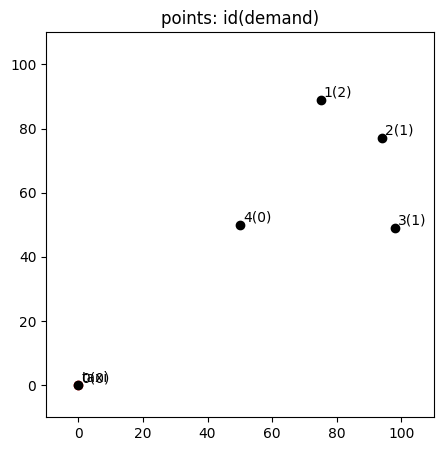

-1
1
Vehicle Requirements: 2
Moving Distance: 347.88620712140045


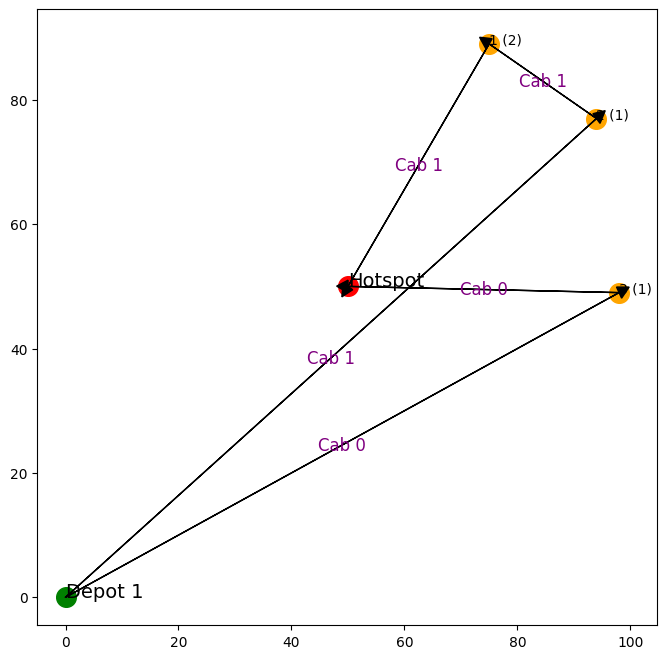

0 157.5777464341209 48.010415536631214 -85.5621231291741
{3}
1 167.8362556330353 92.64987857520376 -28.861437770229657
{1}
    x   y  demand  priority
1  75  89       2         2
3  98  49       1         2
Iteration  125
    x   y  demand  priority
0   0   0       0         0
1  58  24       2         1
2  40  60       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  58  24       2         1
2  40  60       2         1
3  75  89       2         2
4  98  49       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


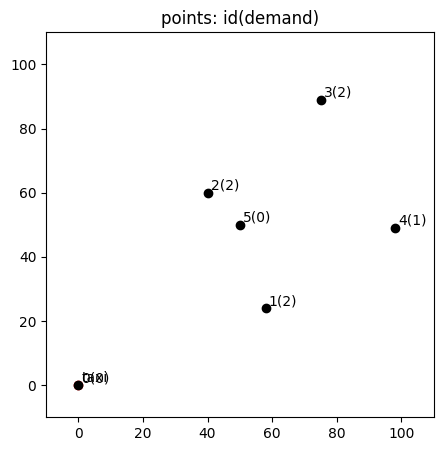

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 378.25887962171134


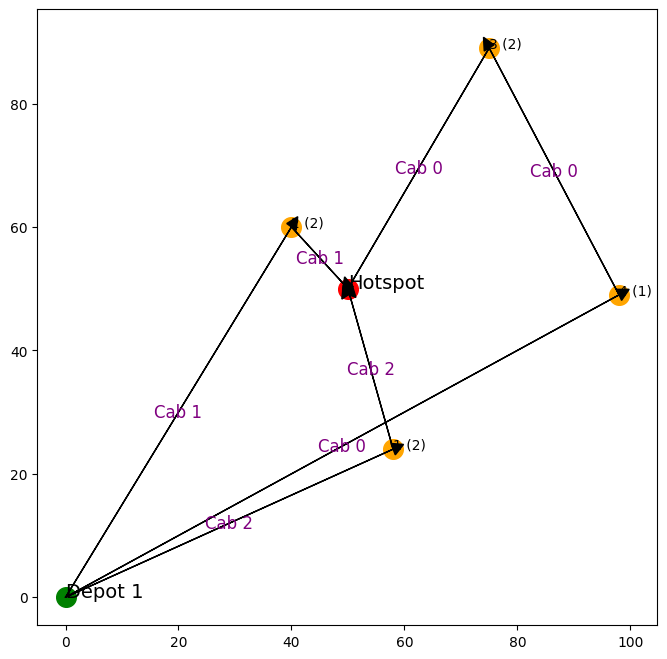

1 86.25316113301074 28.284271247461902 -43.82675426181788
{2}
2 89.97236032337175 54.405882034941776 -8.363537270959085
{1}
    x   y  demand  priority
1  58  24       2         2
2  40  60       2         2
Iteration  126
    x   y  demand  priority
0   0   0       0         0
1  81   3       1         1
2   0  84       3         1
3  33  27       3         1
4  96  73       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  81   3       1         1
2   0  84       3         1
3  33  27       3         1
4  96  73       3         1
5  58  24       2         2
6  40  60       2         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


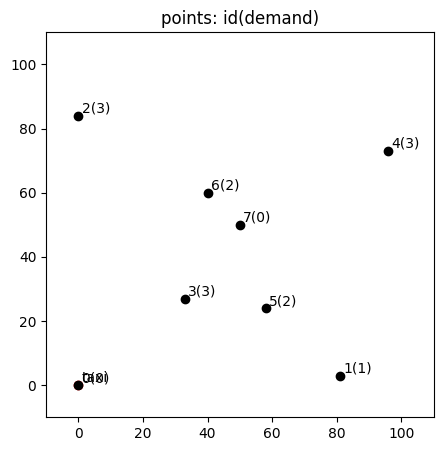

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 613.3922548590186


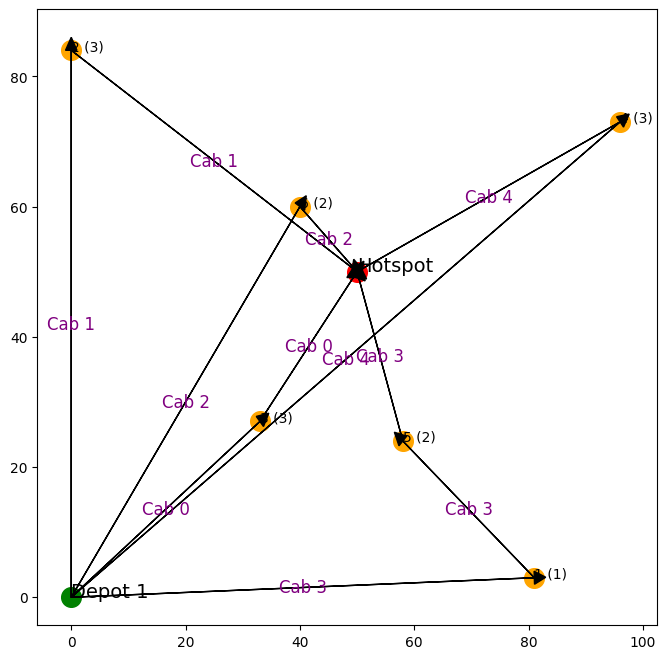

0 71.23871050280587 85.80209787645055 57.464436311869946
{3}
1 144.4648658313239 181.3945974939717 127.62703040963368
{2}
4 172.03221685297453 154.2886904474855 59.400818818253725
{4}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  127
    x   y  demand  priority
0   0   0       0         0
1  62  26       3         1
2  88  47       3         1
3  45  18       3         1
4  88  90       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  62  26       3         1
2  88  47       3         1
3  45  18       3         1
4  88  90       3         1
5  50  50       0         1


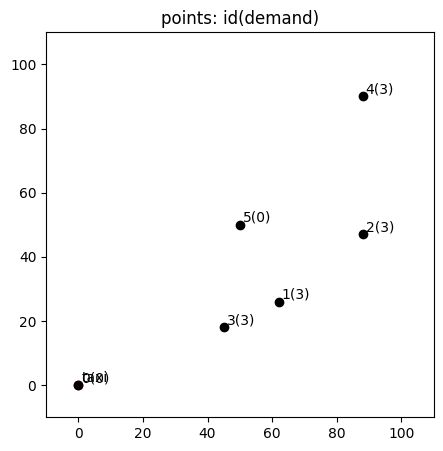

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 493.8468827777948


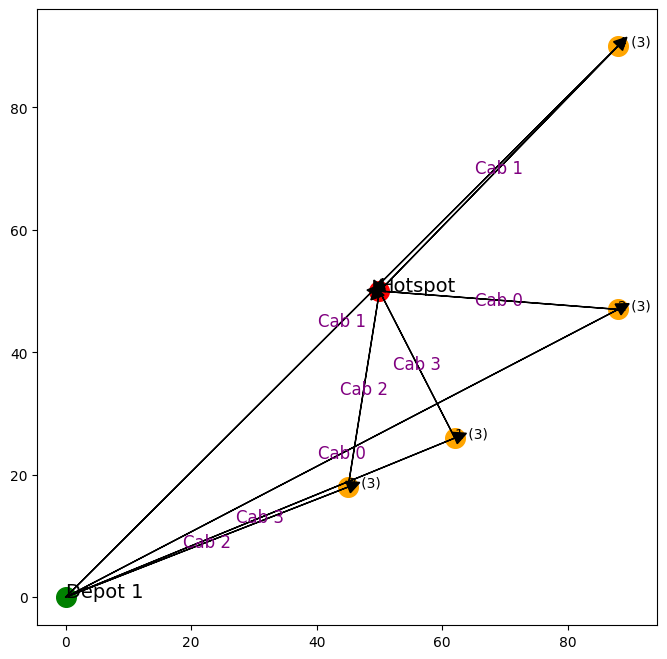

0 137.88296032928565 114.35471131527551 33.64910664362762
{2}
1 181.04540871701138 165.51737068960466 67.23064731739561
{4}
2 80.85475274561384 97.16480844420988 64.89245992070099
{3}
3 94.06376098588392 80.49844718999243 26.68390979910474
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  128
    x   y  demand  priority
0   0   0       0         0
1  12  61       1         1
2  23  43       3         1
3  49  92       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  12  61       1         1
2  23  43       3         1
3  49  92       2         1
4  50  50       0         1


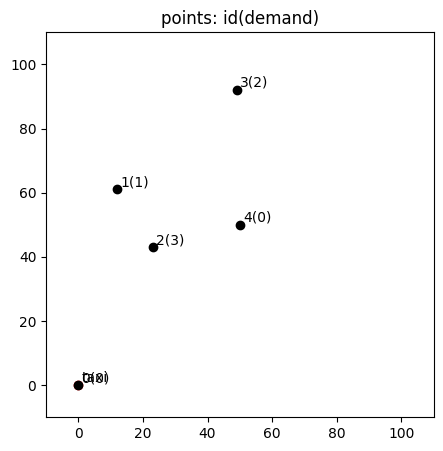

-1
1
Vehicle Requirements: 2
Moving Distance: 229.10849351217604


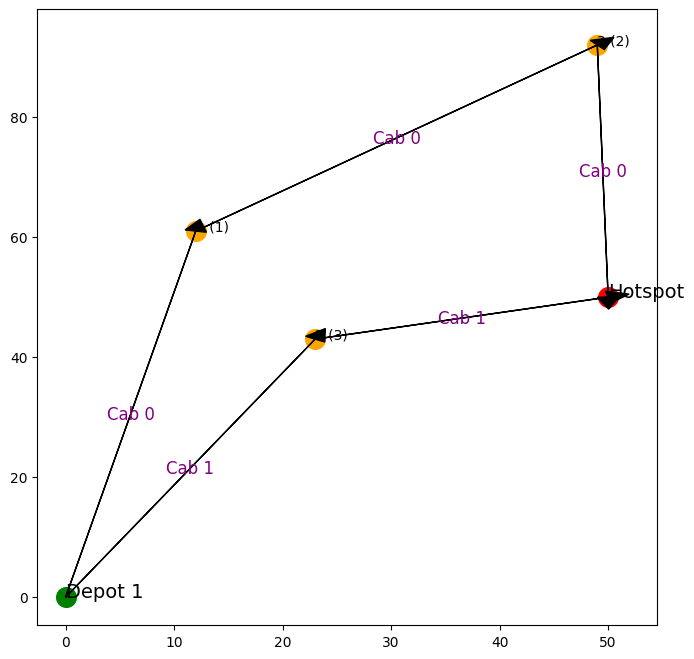

0 152.4511007892669 123.58388704010498 32.92472977089059
{1, 3}
1 76.65739272290915 83.67795408588812 48.85953840592302
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  129
    x   y  demand  priority
0   0   0       0         0
1   2  80       2         1
2  35  34       1         1
3  40  74       1         1
4  56  30       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   2  80       2         1
2  35  34       1         1
3  40  74       1         1
4  56  30       2         1
5  50  50       0         1


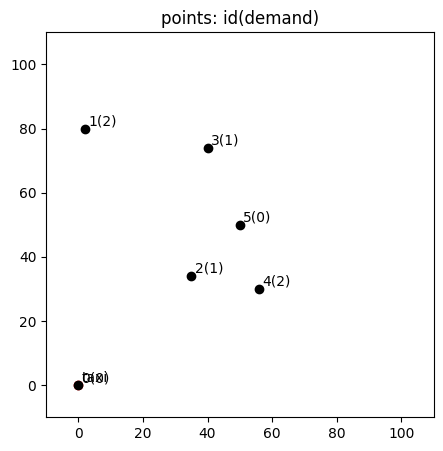

-1
1
Vehicle Requirements: 2
Moving Distance: 235.54942715758935


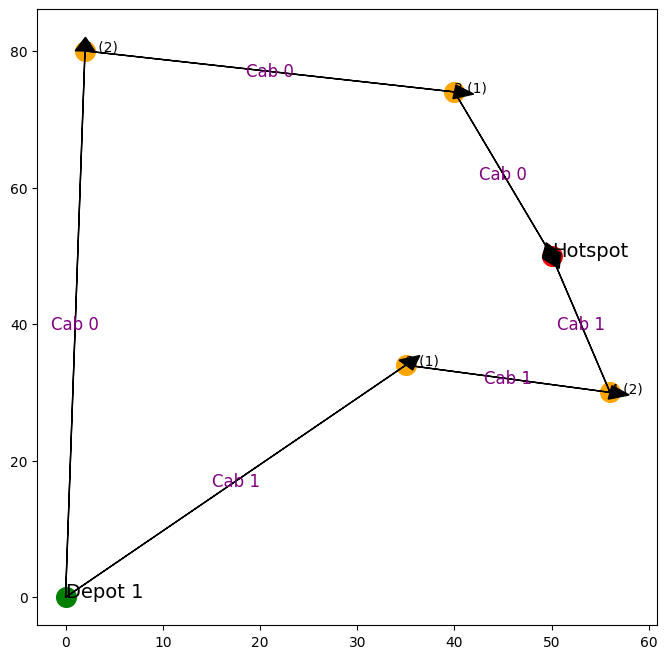

0 144.4957642183129 139.20777358467925 64.31589615870598
{1, 3}
1 91.05366293927646 63.69293823510351 4.485744413378811
{2, 4}
    x   y  demand  priority
2  35  34       1         2
4  56  30       2         2
Iteration  130
    x   y  demand  priority
0   0   0       0         0
1  85  66       3         1
2   2  68       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  85  66       3         1
2   2  68       1         1
3  35  34       1         2
4  56  30       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


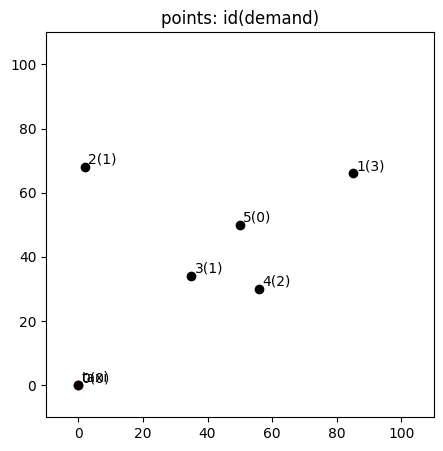

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 356.4459083366513


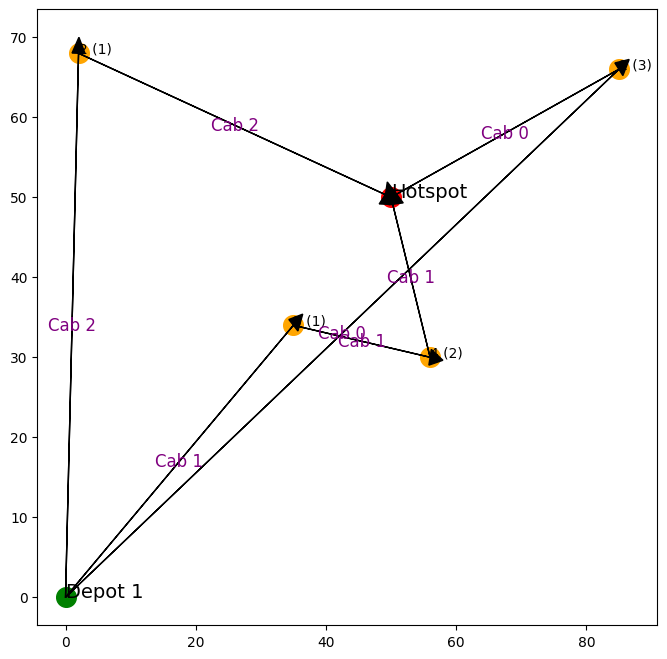

0 146.09881751868986 115.45128842936313 27.078115125354856
{1}
2 119.29342787868498 51.264022471905186 -42.3973941708272
{2}
   x   y  demand  priority
2  2  68       1         2
Iteration  131
    x   y  demand  priority
0   0   0       0         0
1  65  99       1         1
2  90  53       3         1
3  42  77       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  65  99       1         1
2  90  53       3         1
3  42  77       3         1
4   2  68       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


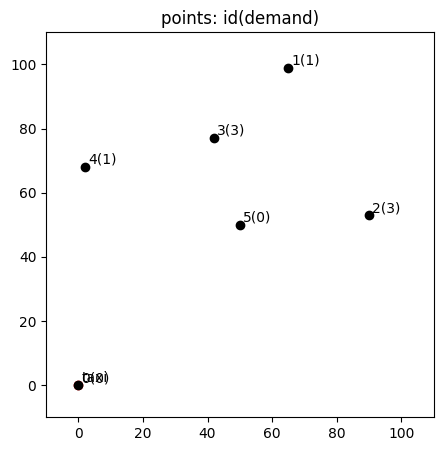

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 449.9163809365079


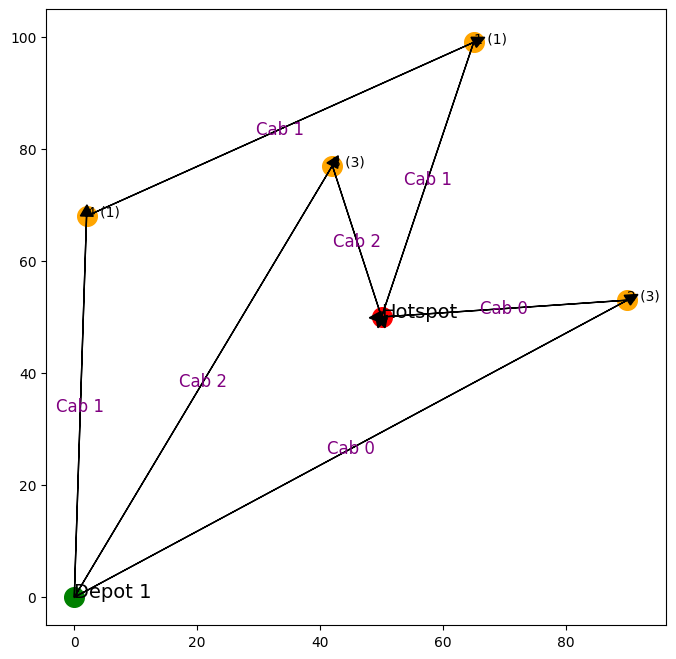

0 144.55850061863532 120.33702672078948 35.9470394625489
{2}
1 119.27391730805563 51.24451190127583 -42.40714945614188
{1}
2 115.87000428364912 84.48076704197234 10.85114627930939
{3}
    x   y  demand  priority
1  65  99       1         2
3  42  77       3         2
Iteration  132
    x   y  demand  priority
0   0   0       0         0
1  96  56       3         1
2  96  36       1         1
3  39  32       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  96  56       3         1
2  96  36       1         1
3  39  32       3         1
4  65  99       1         2
5  42  77       3         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


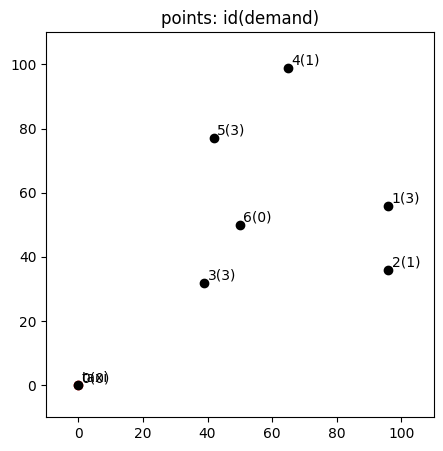

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 568.9287419217211


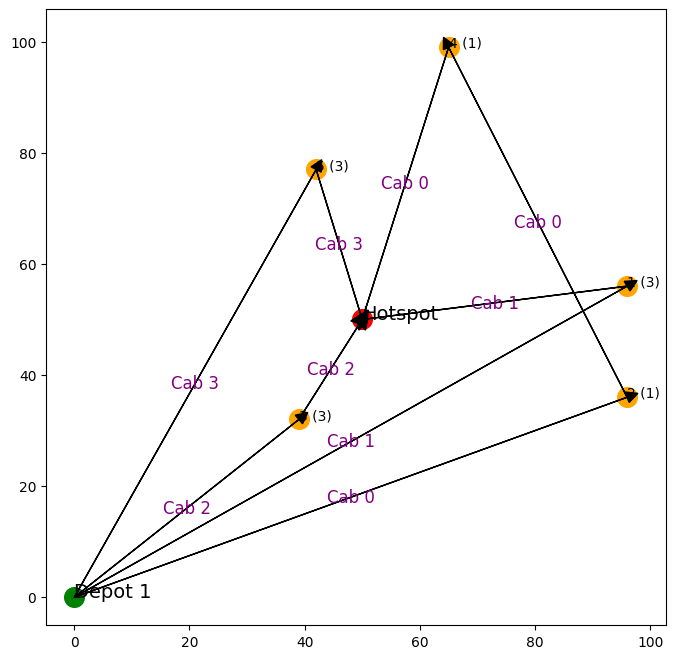

1 157.52920593457122 139.16896205691842 51.2242371508064
{1}
2 71.54301613224675 63.28506932918697 23.384587861533703
{3}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  133
    x   y  demand  priority
0   0   0       0         0
1  17  91       2         1
2  59  73       3         1
3  78  20       1         1
4  28  95       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  17  91       2         1
2  59  73       3         1
3  78  20       1         1
4  28  95       2         1
5  50  50       0         1


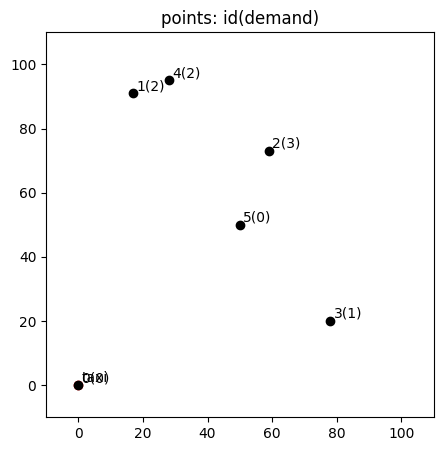

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 484.5168518574055


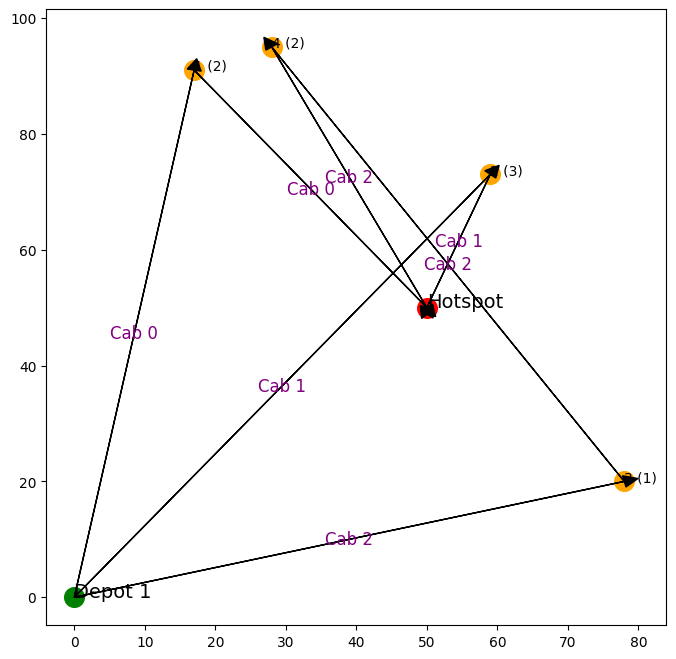

0 145.205083956028 105.26157893552613 12.687284447261192
{1}
1 118.55977831251545 74.09453421137081 -7.417976995459227
{2}
2 220.7519895888621 141.21640734831195 -8.927378566394168
{3, 4}
    x   y  demand  priority
1  17  91       2         2
2  59  73       3         2
3  78  20       1         2
4  28  95       2         2
Iteration  134
    x   y  demand  priority
0   0   0       0         0
1  25  99       1         1
2  39  26       3         1
3  76  80       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  25  99       1         1
2  39  26       3         1
3  76  80       2         1
4  17  91       2         2
5  59  73       3         2
6  78  20       1         2
7  28  95       2         2
8  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


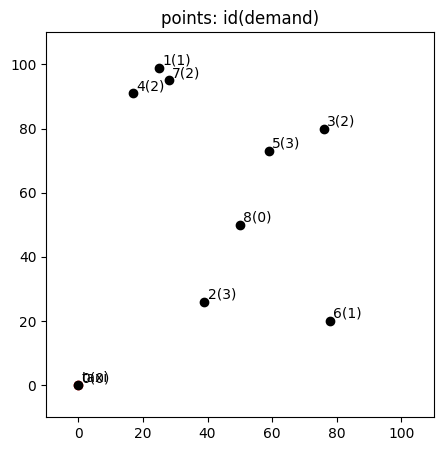

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 674.4909708654493


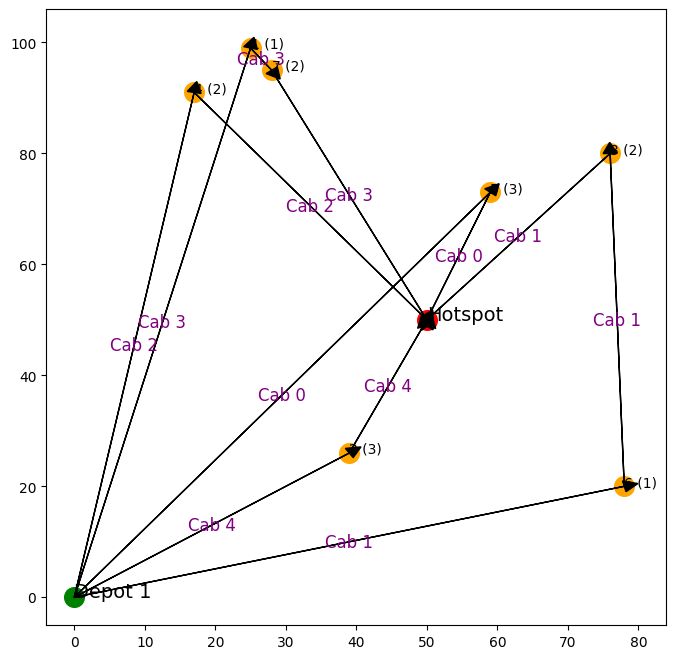

1 120.222155039348 79.39773296511683 -1.1255555916727502
{3}
4 73.27292414592003 79.20227269466452 45.53048489607674
{2}
    x   y  demand  priority
3  76  80       2         2
Iteration  135
    x   y  demand  priority
0   0   0       0         0
1   2  67       3         1
2  62  12       3         1
3  11  56       2         1
4   7  45       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   2  67       3         1
2  62  12       3         1
3  11  56       2         1
4   7  45       3         1
5  76  80       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


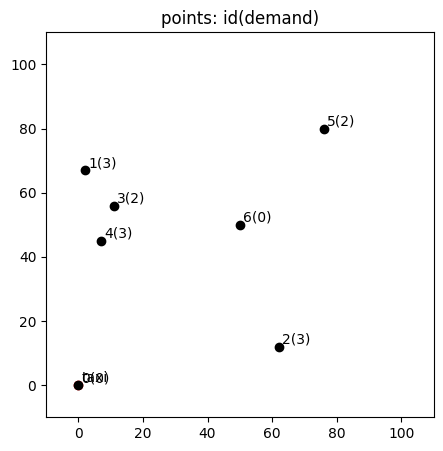

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 556.3553473049185


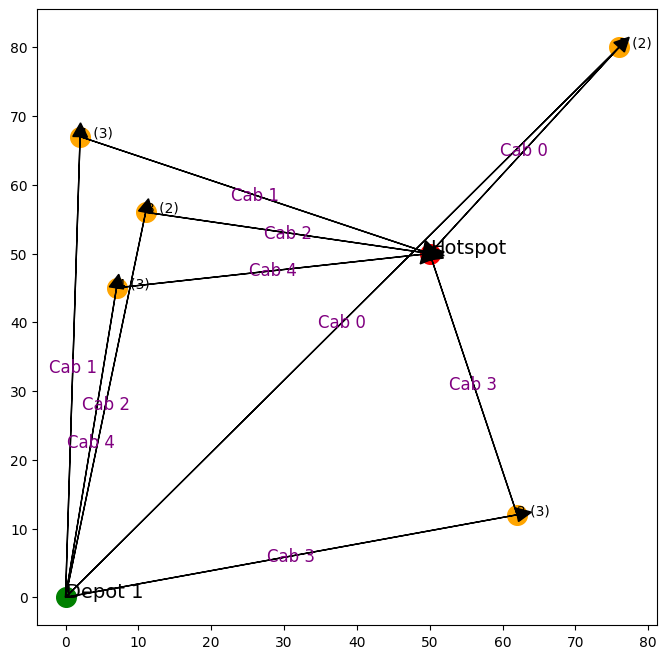

1 117.95135232537163 152.7645246776882 111.19543469116067
{1}
2 96.52897160741881 78.91767862779544 21.84754633427434
{3}
3 103.00033130573033 119.54915307102766 76.32339830081116
{2}
4 88.83091179076953 129.86916493148016 105.9728356064507
{4}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  136
    x   y  demand  priority
0   0   0       0         0
1   2  85       3         1
2  10  63       2         1
3  63  24       3         1
4  20  50       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   2  85       3         1
2  10  63       2         1
3  63  24       3         1
4  20  50       2         1
5  50  50       0         1


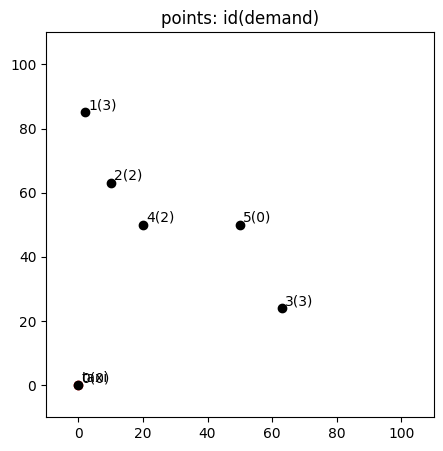

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 430.6142554835859


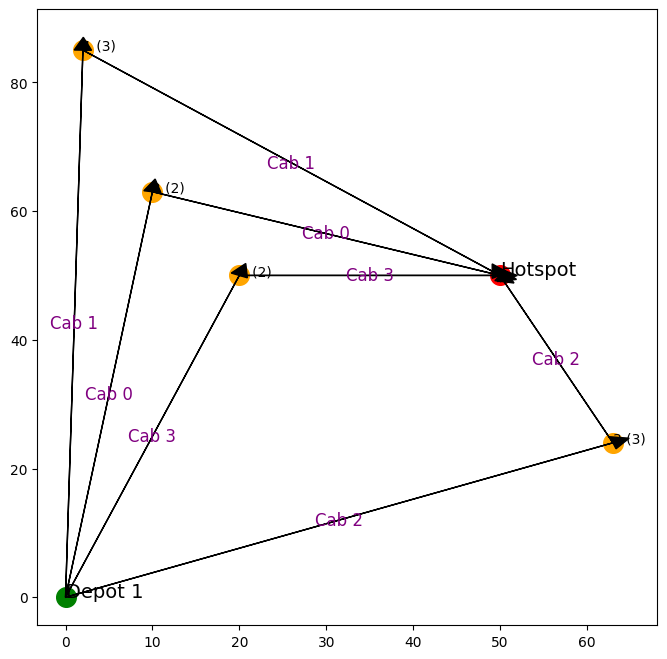

0 105.84819542489443 84.11896337925236 20.330249643984118
{2}
1 144.42891311711648 178.21616088334974 122.89532820790814
{1}
2 96.48549887022996 87.2066511224918 34.324477813507755
{3}
3 83.85164807134504 60.0 6.148351928654961
{4}
    x   y  demand  priority
4  20  50       2         2
Iteration  137
    x   y  demand  priority
0   0   0       0         0
1  81  17       3         1
2  73  14       2         1
3  86   5       1         1
4  52  88       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  81  17       3         1
2  73  14       2         1
3  86   5       1         1
4  52  88       3         1
5  20  50       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


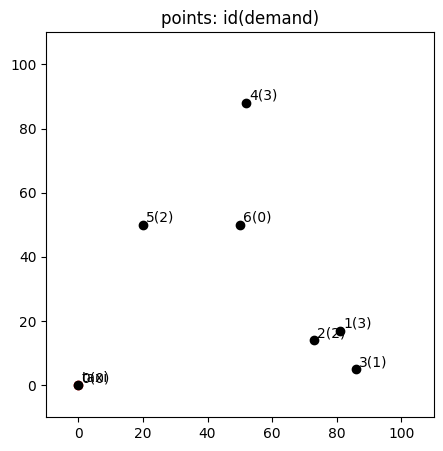

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 496.837987687149


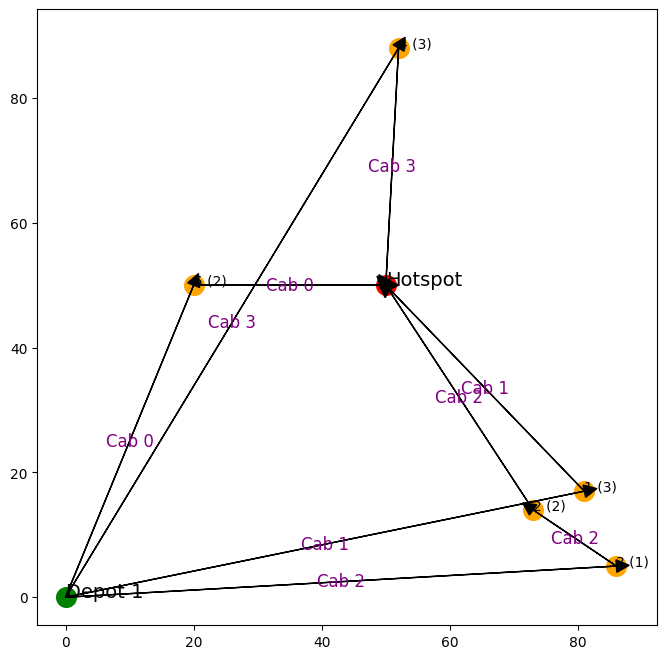

1 128.04165247692134 135.83077707206127 75.70451313117056
{1}
2 128.86524494371474 85.44003745317531 -0.7051887639517815
{2}
3 140.268053894326 114.15778554264267 30.96862441963802
{4}
    x   y  demand  priority
2  73  14       2         2
Iteration  138
    x   y  demand  priority
0   0   0       0         0
1  10  95       3         1
2  99  21       1         1
3  70  62       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  10  95       3         1
2  99  21       1         1
3  70  62       1         1
4  73  14       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


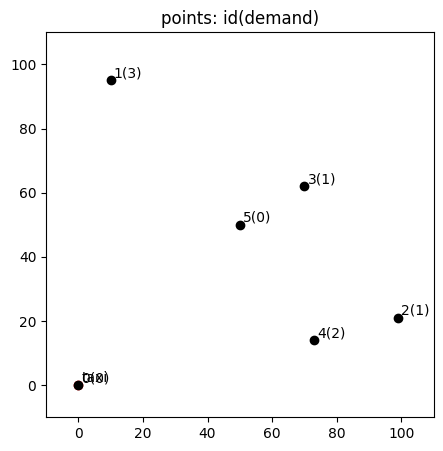

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 430.76073532075645


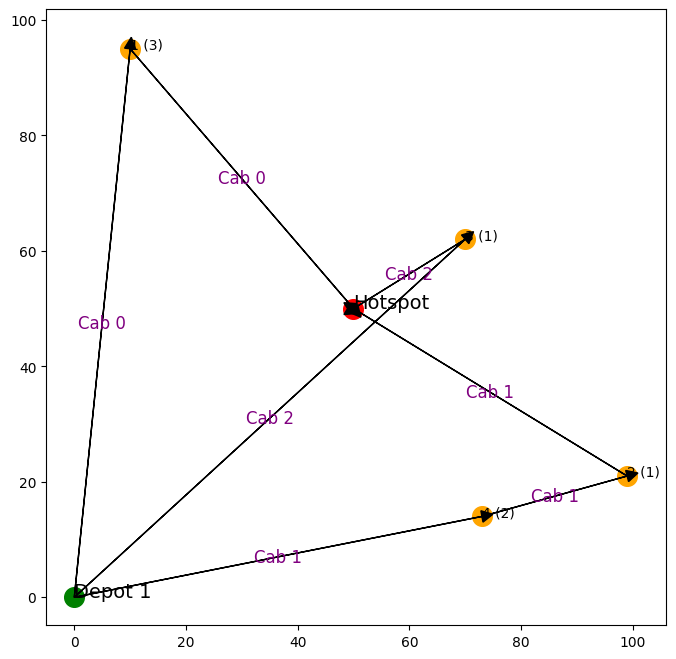

0 155.73283876667548 180.62391868188442 115.20303925615113
{1}
1 131.26890711853957 56.938563381947034 -45.86106204561902
{2}
2 116.83316539986888 23.323807579381203 -81.84745403079707
{3}
    x   y  demand  priority
2  99  21       1         2
3  70  62       1         2
Iteration  139
    x   y  demand  priority
0   0   0       0         0
1  46   2       2         1
2  98  92       1         1
3  55   7       2         1
4  39  81       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  46   2       2         1
2  98  92       1         1
3  55   7       2         1
4  39  81       3         1
5  99  21       1         2
6  70  62       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


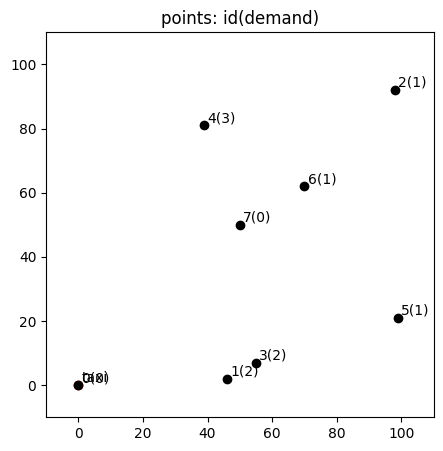

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 552.3071208854775


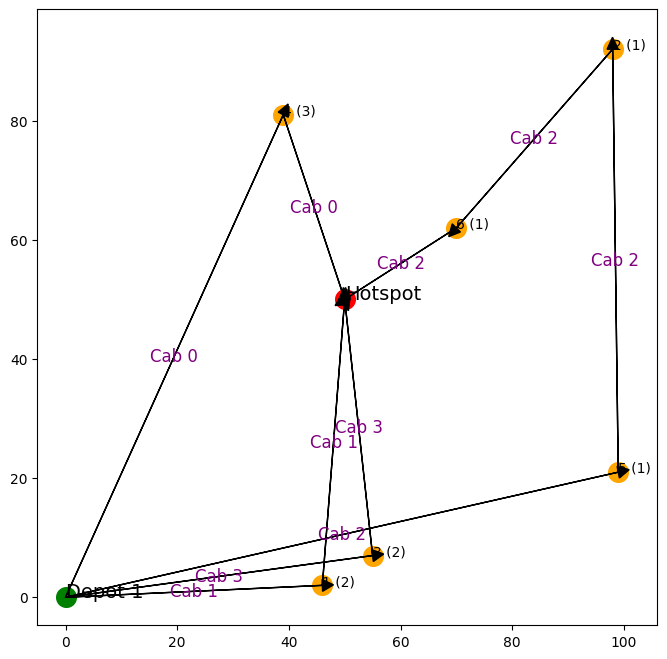

0 122.79371278942723 98.68130522039115 25.228245041159497
{4}
1 94.20983604805454 96.33275663033837 50.289298897452994
{1}
3 98.73338674634317 86.57944328765345 31.135778185136985
{3}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  140
    x   y  demand  priority
0   0   0       0         0
1  34  68       3         1
2  67  48       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  34  68       3         1
2  67  48       3         1
3  50  50       0         1


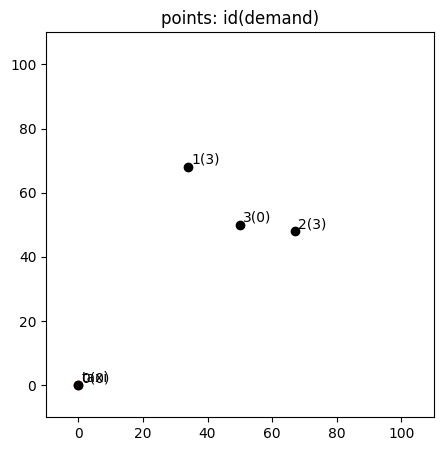

-1
1
Vehicle Requirements: 2
Moving Distance: 199.64640101052734


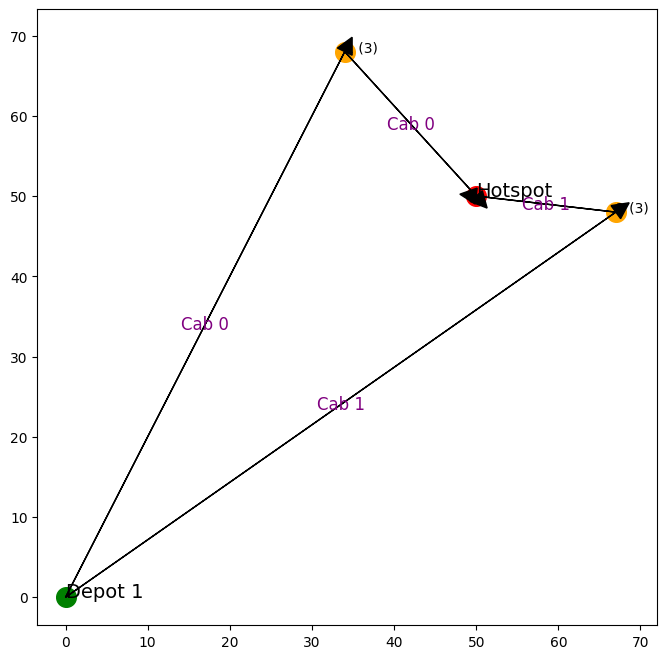

0 100.10950039257744 72.24956747275377 8.264850816553206
{1}
1 99.5369006179499 51.35172830587107 -22.509308159143288
{2}
    x   y  demand  priority
1  34  68       3         2
2  67  48       3         2
Iteration  141
    x   y  demand  priority
0   0   0       0         0
1  62  82       2         1
2   1   3       1         1
3   4  11       3         1
4  92  56       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  62  82       2         1
2   1   3       1         1
3   4  11       3         1
4  92  56       2         1
5  34  68       3         2
6  67  48       3         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


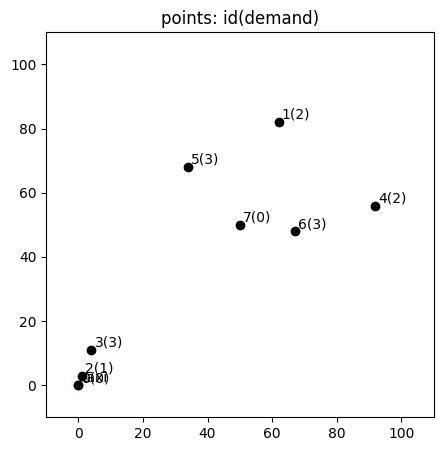

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 558.9364608660601


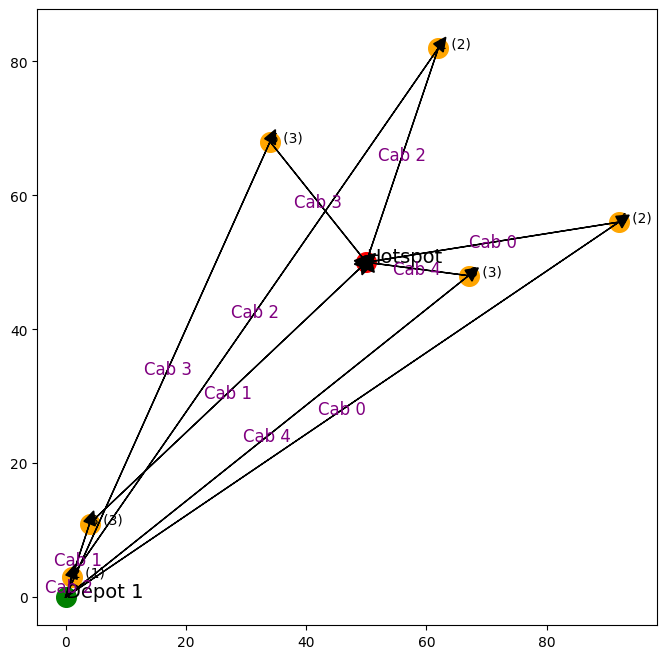

0 150.12970301388293 84.8528137423857 -22.850482400304372
{4}
1 72.01224504397803 180.92263539977523 199.37170805568482
{3}
2 37.3382926414385 68.35202996254024 65.18975230237186
{1}
    x   y  demand  priority
4  92  56       2         2
Iteration  142
    x   y  demand  priority
0   0   0       0         0
1   9  59       3         1
2  11  34       2         1
3  82   3       1         1
4  74  75       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   9  59       3         1
2  11  34       2         1
3  82   3       1         1
4  74  75       2         1
5  92  56       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


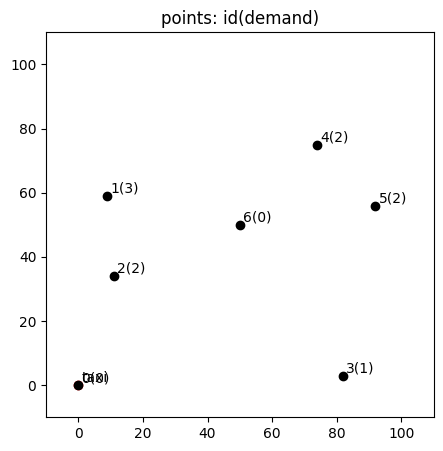

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 497.98143447969954


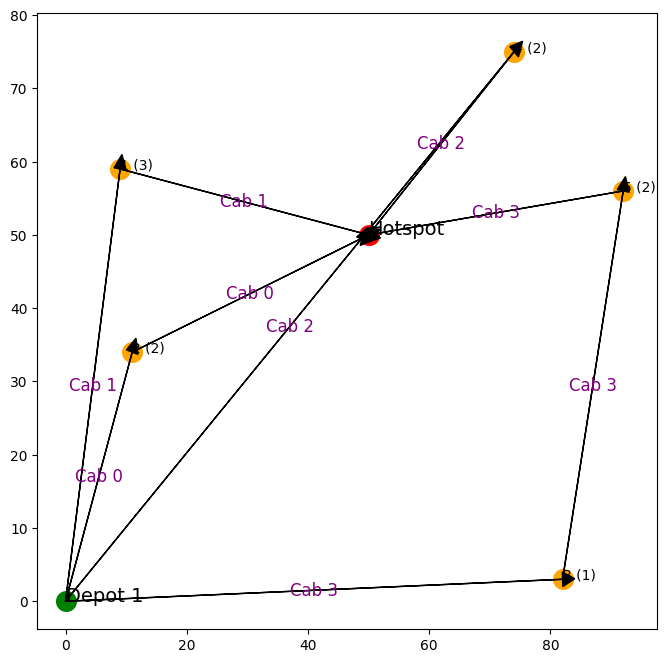

0 77.88961458712726 84.30895563343196 48.57381886302069
{2}
1 101.65867696913782 125.92855117089213 87.23414978720038
{1}
2 140.0167301139507 69.31089380465383 -36.050389406969956
{4}
    x   y  demand  priority
4  74  75       2         2
Iteration  143
    x   y  demand  priority
0   0   0       0         0
1  52  57       3         1
2  62   6       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  52  57       3         1
2  62   6       2         1
3  74  75       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


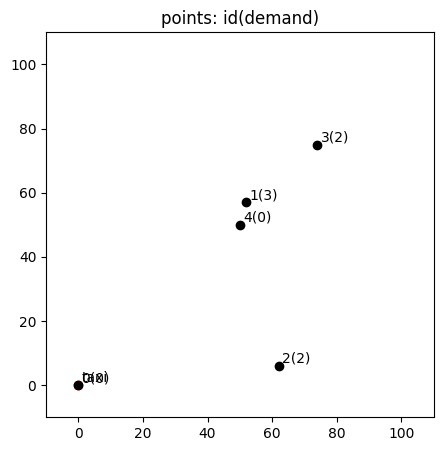

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 332.34918978062785


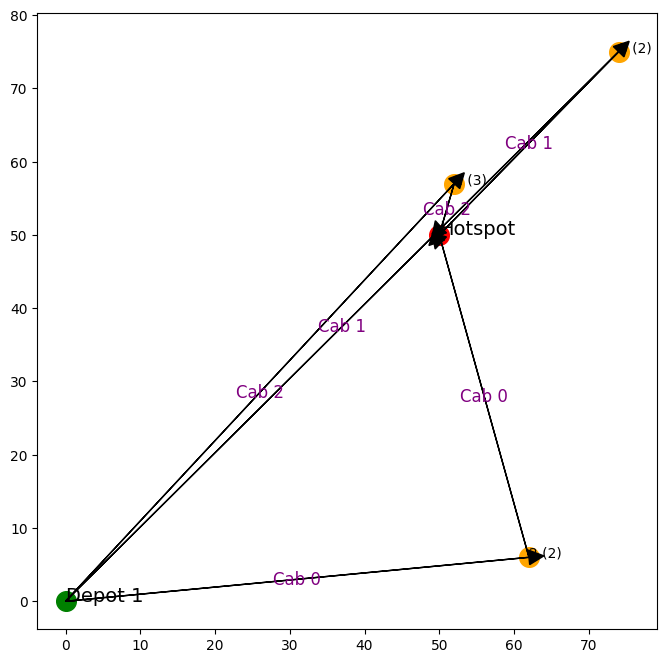

0 107.89666301355527 91.21403400793103 28.924387998341274
{2}
2 84.43579665312186 21.840329667841555 -51.675302151359524
{1}
    x   y  demand  priority
1  52  57       3         2
Iteration  144
    x   y  demand  priority
0   0   0       0         0
1  77  81       1         1
2  64  12       2         1
3  36  62       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  77  81       1         1
2  64  12       2         1
3  36  62       3         1
4  52  57       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


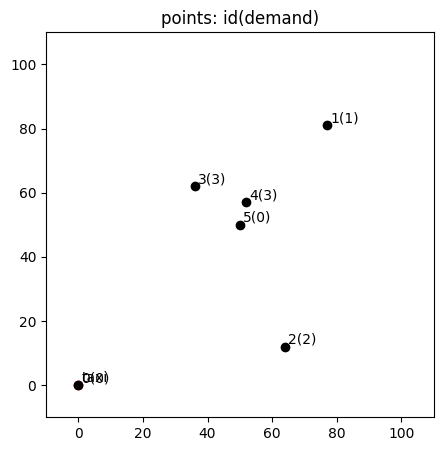

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 351.00752957620296


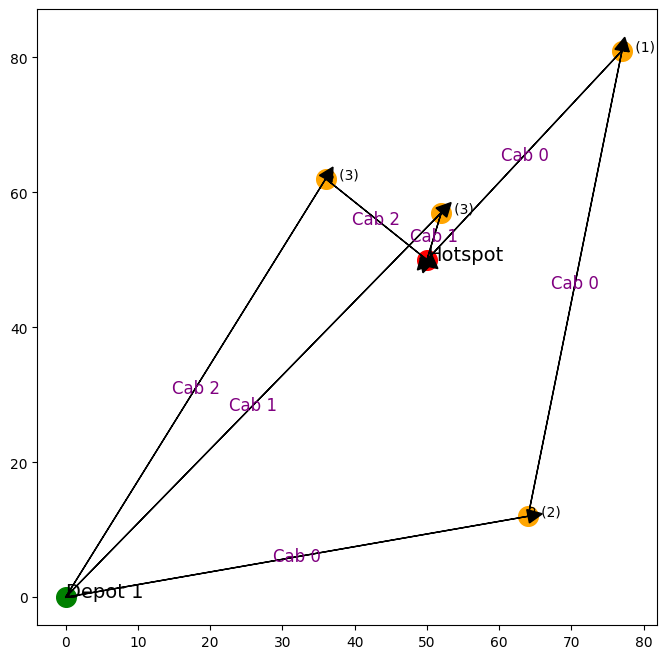

0 106.22489196658776 41.10960958218893 -44.56047759330437
{1}
2 90.13288223032546 55.31726674375732 -7.156982114689484
{3}
    x   y  demand  priority
1  77  81       1         2
3  36  62       3         2
Iteration  145
    x   y  demand  priority
0   0   0       0         0
1  71  60       3         1
2  95   2       2         1
3  41  69       2         1
4  58  76       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  71  60       3         1
2  95   2       2         1
3  41  69       2         1
4  58  76       1         1
5  77  81       1         2
6  36  62       3         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


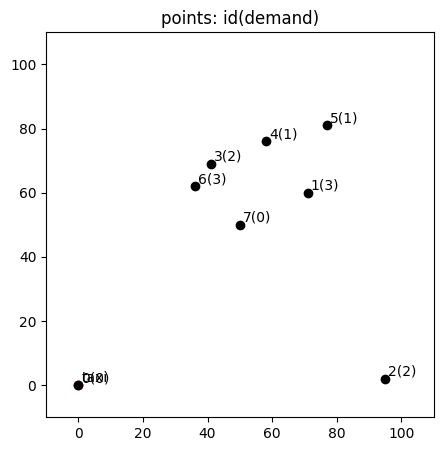

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 549.3544037754357


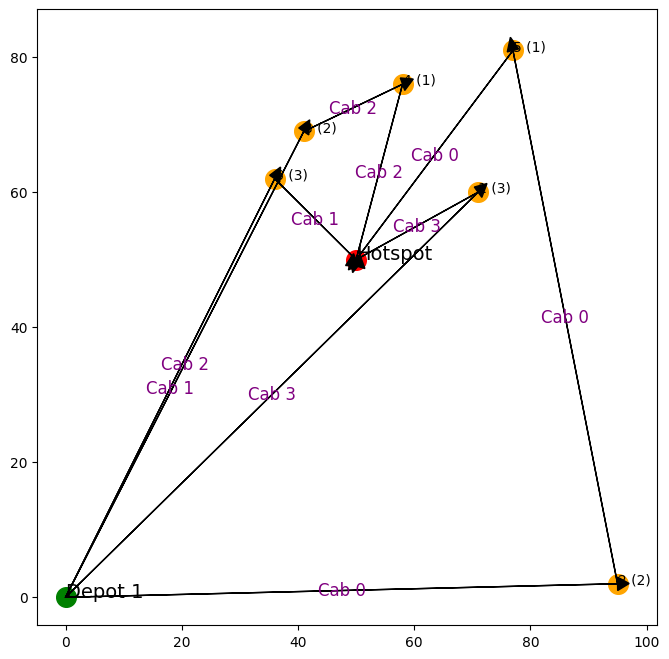

2 125.84978807160559 69.25053310072816 -21.973988420513336
{3, 4}
3 116.21638599610291 69.77822009767804 -11.549055849585855
{1}
    x   y  demand  priority
1  71  60       3         2
3  41  69       2         2
4  58  76       1         2
Iteration  146
    x   y  demand  priority
0   0   0       0         0
1   4  32       2         1
2  28  18       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   4  32       2         1
2  28  18       2         1
3  71  60       3         2
4  41  69       2         2
5  58  76       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


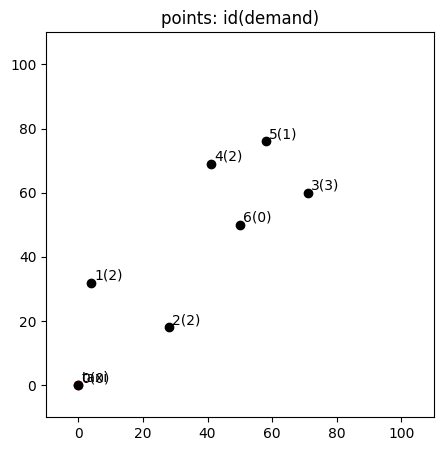

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 395.8311708338983


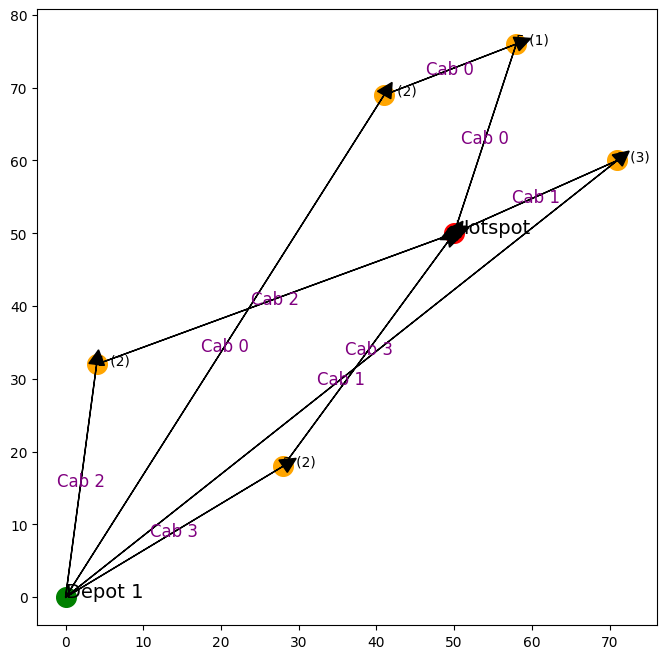

2 81.64538713410806 98.79271228182775 66.54368128863356
{1}
3 72.11960963208168 77.6659513557904 44.37931740160391
{2}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  147
    x   y  demand  priority
0   0   0       0         0
1  89  44       1         1
2  46  29       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  89  44       1         1
2  46  29       1         1
3  50  50       0         1


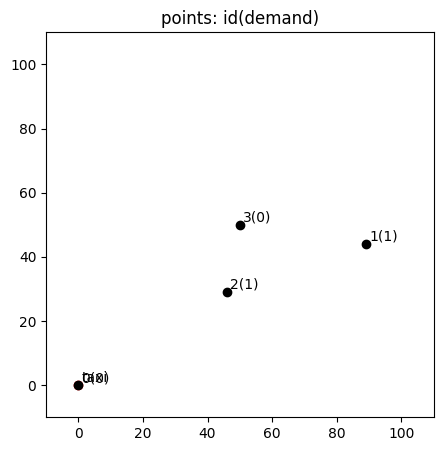

1
Vehicle Requirements: 1
Moving Distance: 139.3783339581306


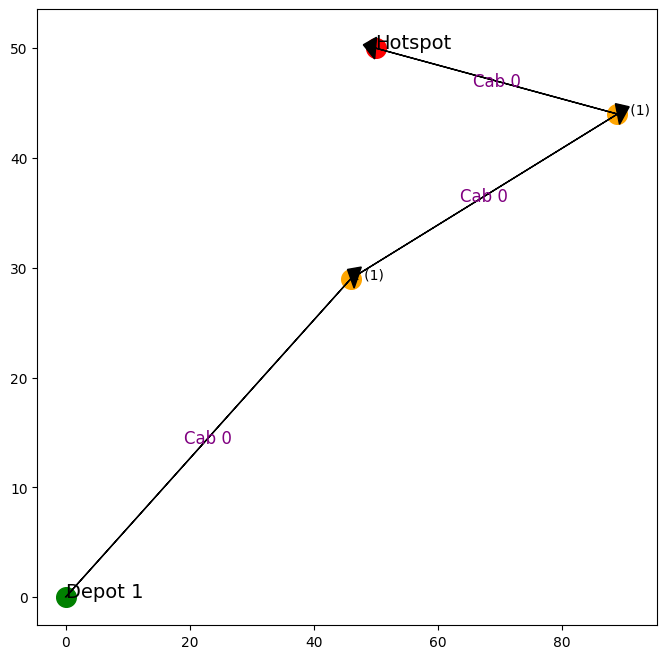

0 93.83714381118781 39.45883931389772 -34.64888484034124
{1}
    x   y  demand  priority
1  89  44       1         2
Iteration  148
    x   y  demand  priority
0   0   0       0         0
1  96  94       3         1
2  91  68       3         1
3  27   3       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  96  94       3         1
2  91  68       3         1
3  27   3       3         1
4  89  44       1         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


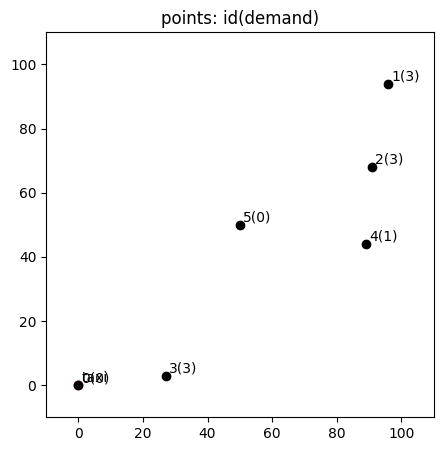

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 574.623777680407


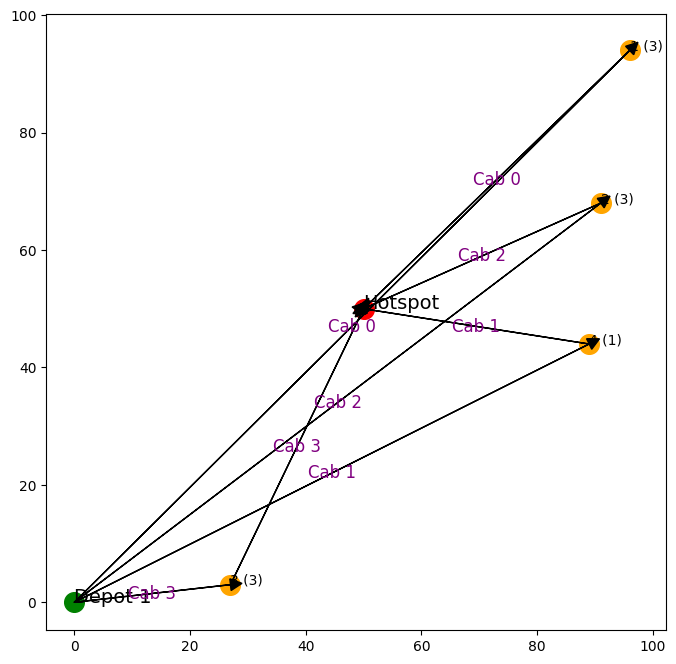

0 198.01305329990566 190.9659655540746 88.4358950312062
{1}
2 158.37740241067783 134.33167906342865 43.12011618446516
{2}
3 79.49205722221677 156.97770542341357 155.97450091290358
{3}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  149
    x   y  demand  priority
0   0   0       0         0
1  92   6       1         1
2  28  83       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  92   6       1         1
2  28  83       3         1
3  50  50       0         1


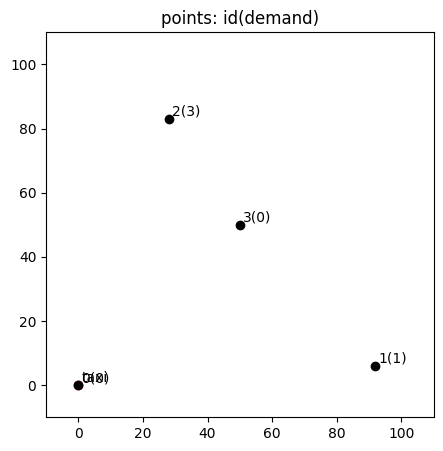

-1
1
Vehicle Requirements: 2
Moving Distance: 280.2797958990611


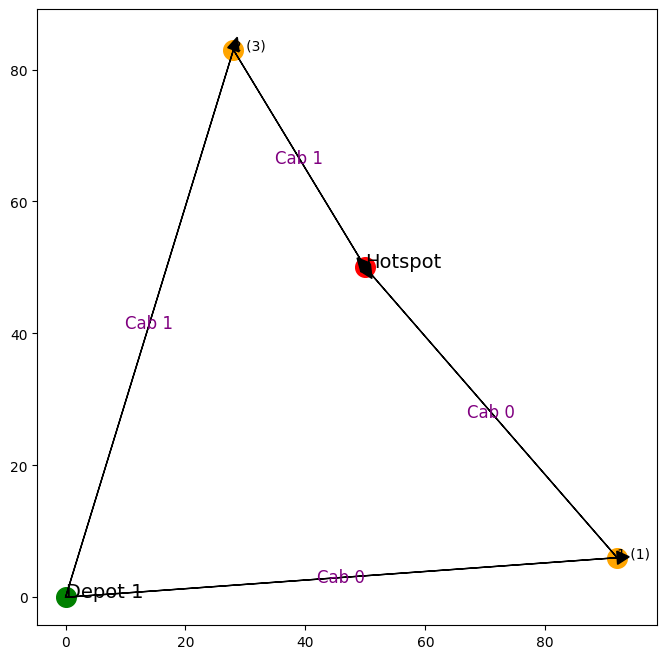

0 153.02306987591106 60.8276253029822 -61.781631921437764
{1}
1 127.2567260231501 118.98319209031163 51.21806211231737
{2}
    x  y  demand  priority
1  92  6       1         2
Iteration  150
    x   y  demand  priority
0   0   0       0         0
1  43  45       1         1
2  69  44       1         1
3  96  88       2         1
4   5  91       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  43  45       1         1
2  69  44       1         1
3  96  88       2         1
4   5  91       2         1
5  92   6       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


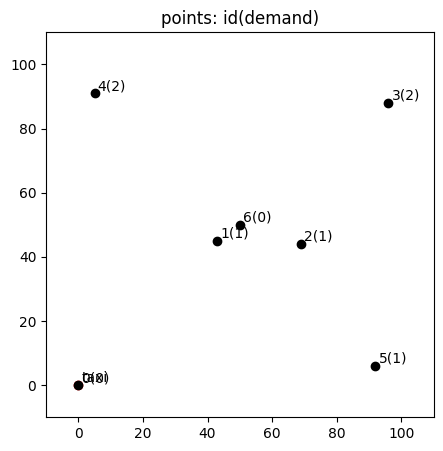

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 494.15841506821096


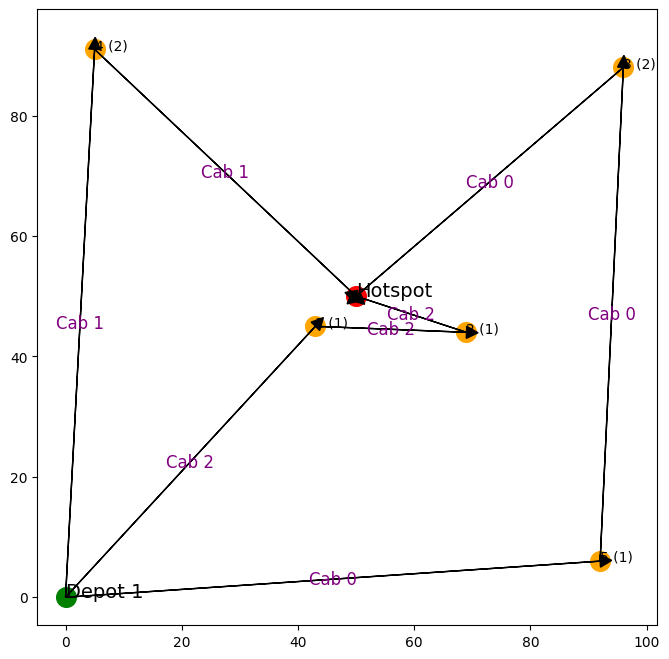

0 151.86118013363406 119.33147112141039 27.13602654848151
{3}
1 152.01418414141327 121.75385004179539 30.616590921279823
{4}
2 108.18554778606838 28.527184112213902 -65.39477161774752
{1, 2}
    x   y  demand  priority
1  43  45       1         2
2  69  44       1         2
Iteration  151
    x   y  demand  priority
0   0   0       0         0
1   7  52       2         1
2  11   3       2         1
3  29  12       1         1
4  32   4       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   7  52       2         1
2  11   3       2         1
3  29  12       1         1
4  32   4       3         1
5  43  45       1         2
6  69  44       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


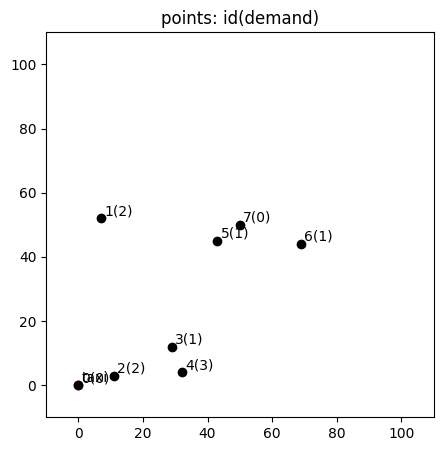

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 352.50106916894424


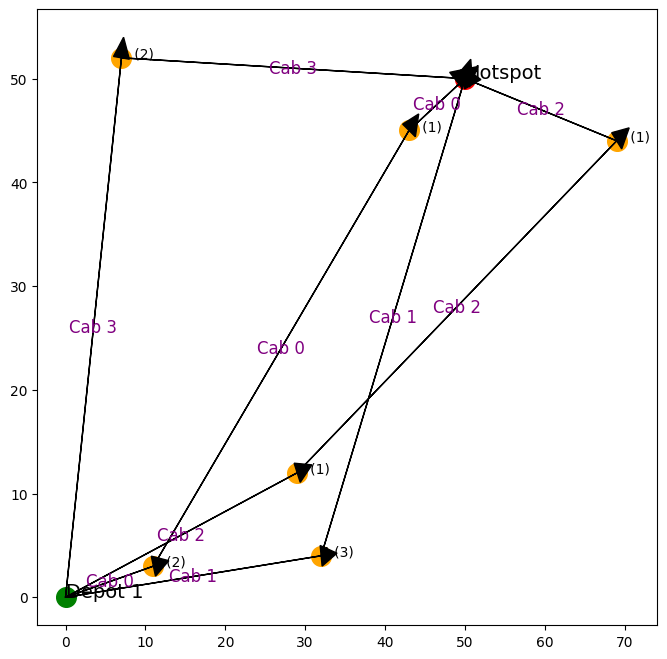

1 81.64538713410806 148.18906842274163 140.63821550000438
{4}
3 95.51552498944139 86.09297300012354 33.62393451074391
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  152
    x   y  demand  priority
0   0   0       0         0
1  52  76       2         1
2  23  68       2         1
3   9  18       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  52  76       2         1
2  23  68       2         1
3   9  18       3         1
4  50  50       0         1


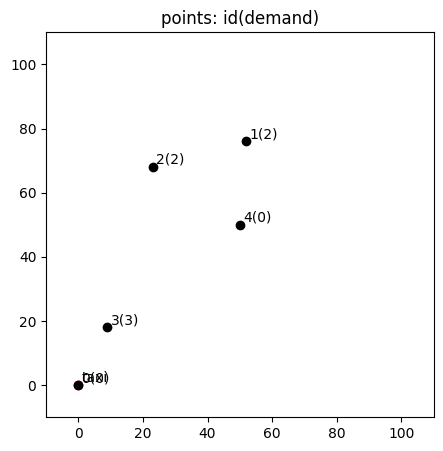

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 294.5323122784111


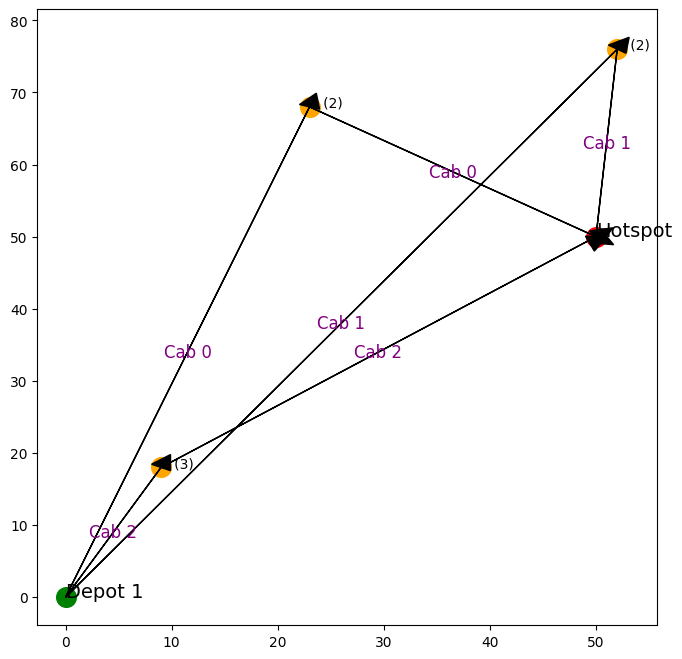

0 104.23436089854835 64.89992295835181 -6.8844764610206255
{2}
1 118.1637250865813 52.15361924162119 -39.9332962241495
{1}
2 72.13422629328149 156.02884348735012 161.90903893774367
{3}
    x   y  demand  priority
1  52  76       2         2
2  23  68       2         2
Iteration  153
    x   y  demand  priority
0   0   0       0         0
1  88  14       2         1
2  20  81       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  88  14       2         1
2  20  81       1         1
3  52  76       2         2
4  23  68       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


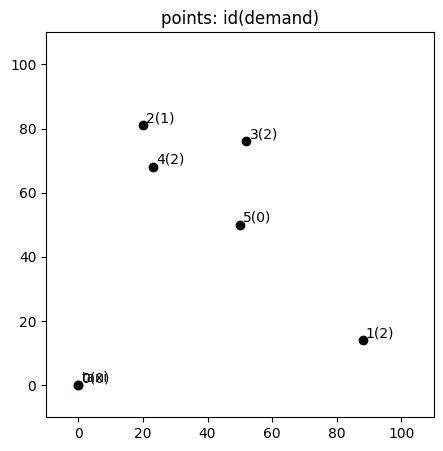

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 387.5837344882183


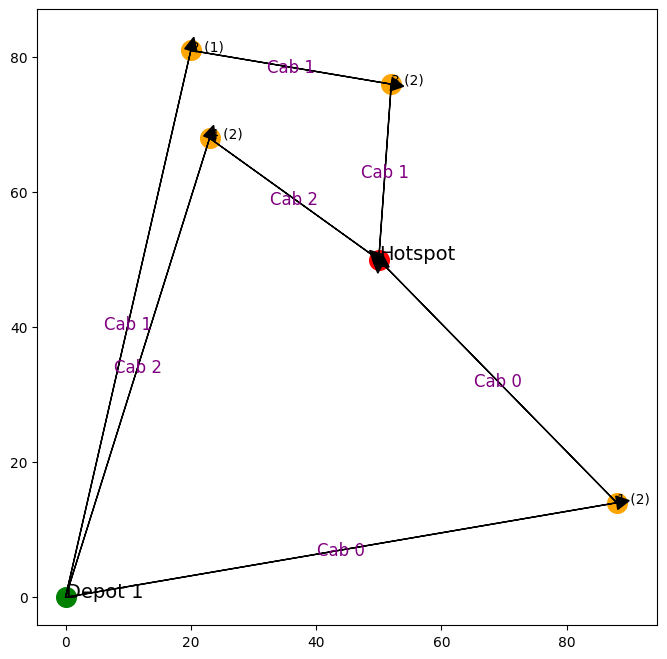

0 141.45168695299145 104.6900186264192 15.583340986637353
{1}
    x   y  demand  priority
1  88  14       2         2
Iteration  154
    x   y  demand  priority
0   0   0       0         0
1  46   7       2         1
2   0  42       1         1
3  66  67       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  46   7       2         1
2   0  42       1         1
3  66  67       2         1
4  88  14       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


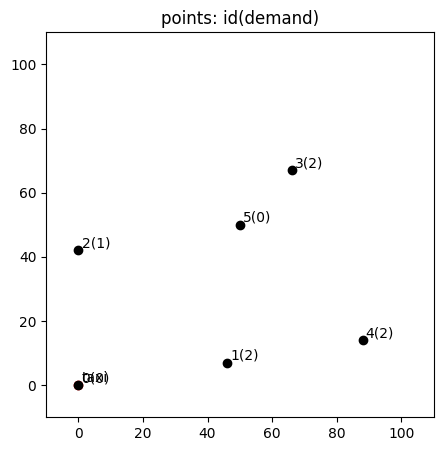

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 367.08832822713026


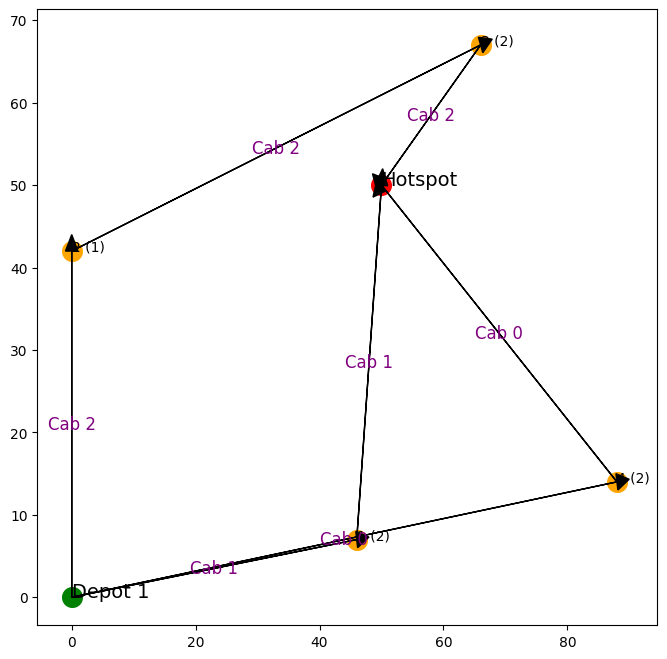

1 89.71520625990573 86.37129152675674 39.84173103022937
{1}
2 135.92143501423305 97.32642572440366 10.068203572372454
{2, 3}
    x   y  demand  priority
2   0  42       1         2
3  66  67       2         2
Iteration  155
    x   y  demand  priority
0   0   0       0         0
1  66  82       3         1
2  53  26       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  66  82       3         1
2  53  26       1         1
3   0  42       1         2
4  66  67       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


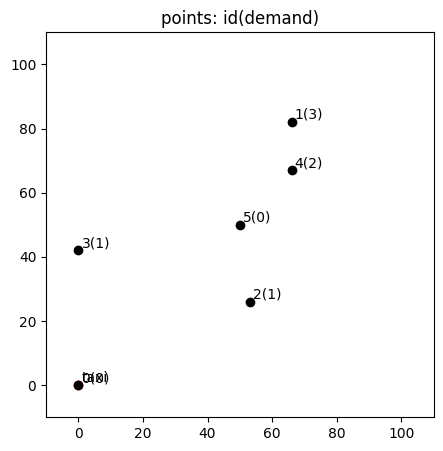

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 359.0653721478638


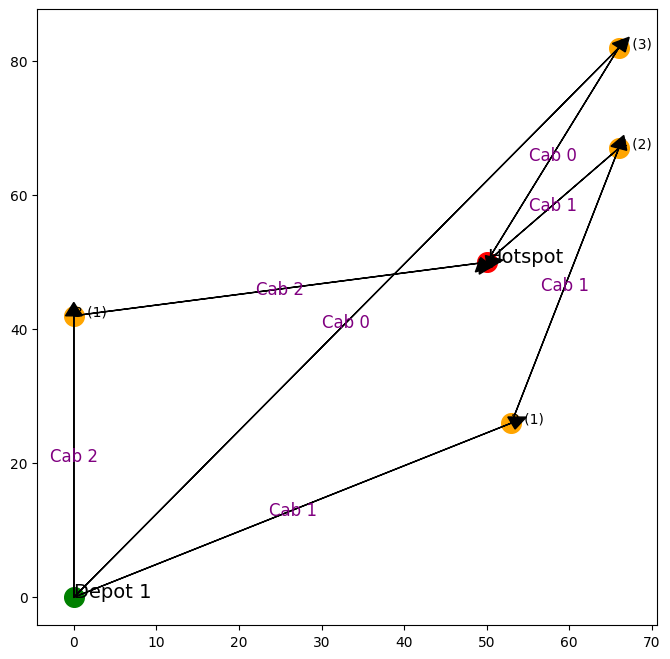

0 141.03866657552277 107.33126291998991 19.958227804462098
{1}
    x   y  demand  priority
1  66  82       3         2
Iteration  156
    x   y  demand  priority
0   0   0       0         0
1   3  75       1         1
2  72  12       1         1
3  72  18       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1   3  75       1         1
2  72  12       1         1
3  72  18       3         1
4  66  82       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


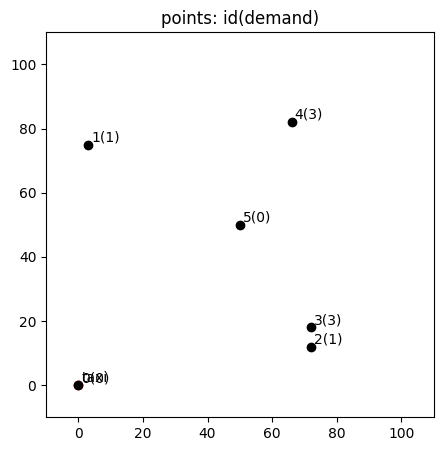

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 466.4909853483016


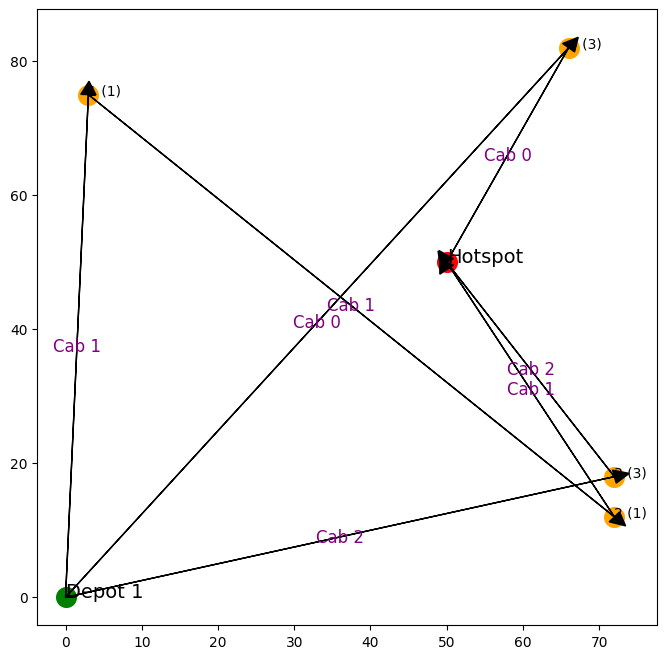

1 212.40344183376575 97.14432341702496 -66.68695670822831
{1, 2}
2 113.0488769390131 116.49892703368559 61.69951361151527
{3}
    x   y  demand  priority
1   3  75       1         2
2  72  12       1         2
Iteration  157
    x   y  demand  priority
0   0   0       0         0
1  55  18       3         1
2  84  56       2         1
3  10  12       1         1
4  84  78       3         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  55  18       3         1
2  84  56       2         1
3  10  12       1         1
4  84  78       3         1
5   3  75       1         2
6  72  12       1         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


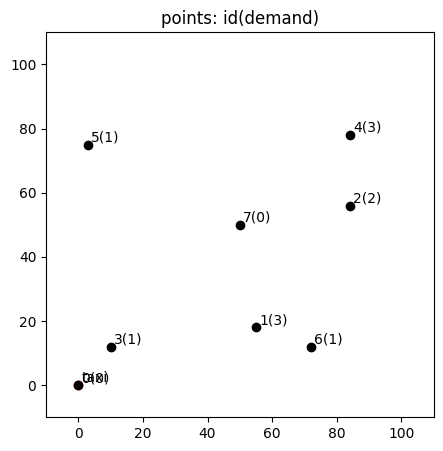

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 534.3031271110799


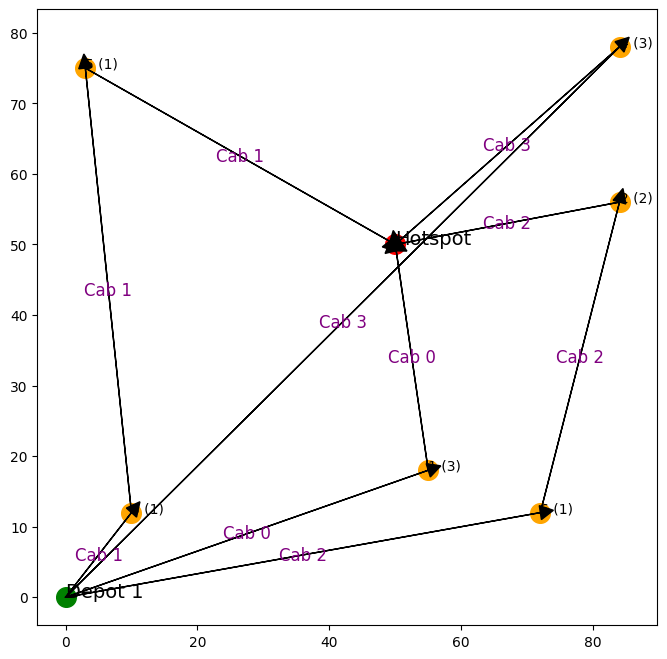

0 90.25881466632444 97.16480844420988 55.48839799999038
{1}
2 107.51850336684276 69.05070600652827 -3.9424443570503627
{2}
3 158.6752701383473 132.13629327327143 39.52916977155985
{4}
    x   y  demand  priority
2  84  56       2         2
Iteration  158
    x   y  demand  priority
0   0   0       0         0
1  39  50       3         1
2  63  42       2         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  39  50       3         1
2  63  42       2         1
3  84  56       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


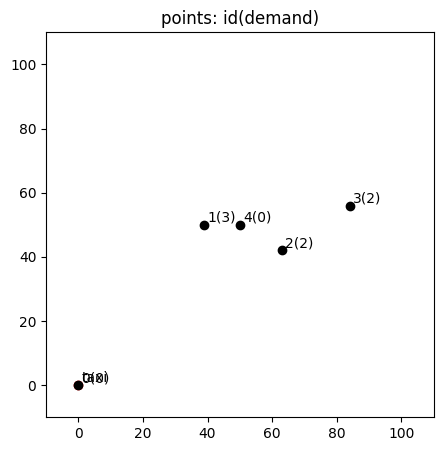

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 300.87305847342407


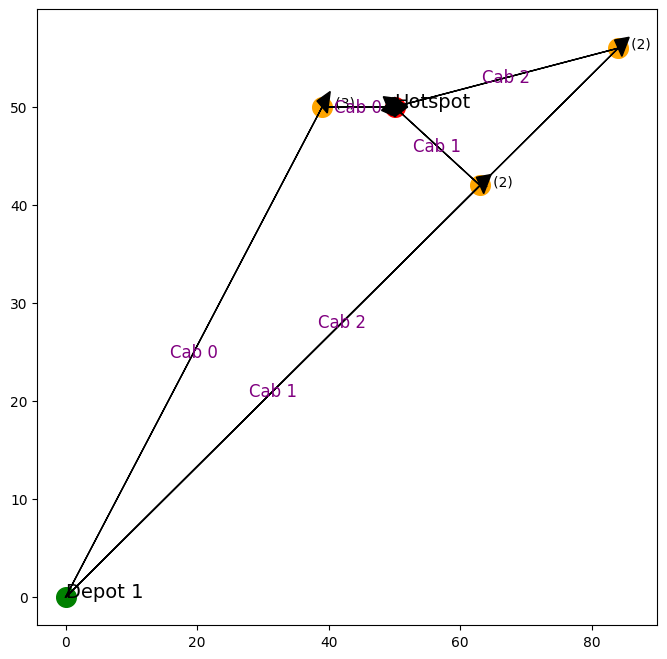

0 74.41135544995076 33.0 -24.91135544995076
{1}
1 90.98091430721753 30.528675044947494 -45.18790173979629
{2}
    x   y  demand  priority
1  39  50       3         2
2  63  42       2         2
Iteration  159
    x   y  demand  priority
0   0   0       0         0
1  67  81       3         1
2  81  73       2         1
3  18   0       1         1
4  33  96       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  67  81       3         1
2  81  73       2         1
3  18   0       1         1
4  33  96       1         1
5  39  50       3         2
6  63  42       2         2
7  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


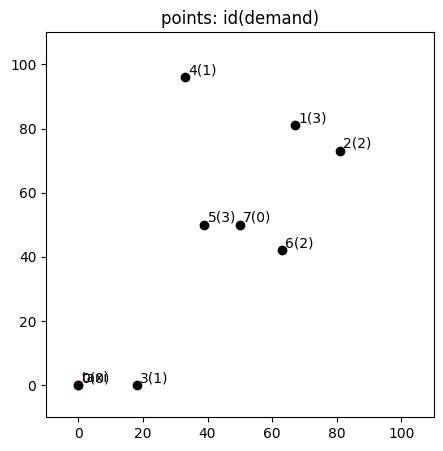

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 503.044863379999


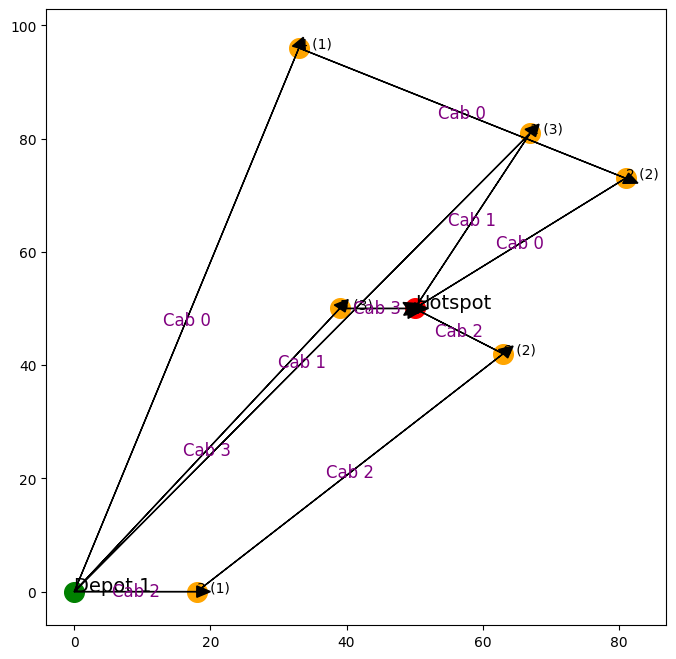

0 140.11406402536934 77.20103626247513 -24.312509631656653
{2}
1 140.47431926747055 106.06601717798213 18.62470649950265
{1}
    x   y  demand  priority
1  67  81       3         2
2  81  73       2         2
Iteration  160
    x   y  demand  priority
0   0   0       0         0
1  72  36       3         1
2  52   2       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  72  36       3         1
2  52   2       3         1
3  67  81       3         2
4  81  73       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


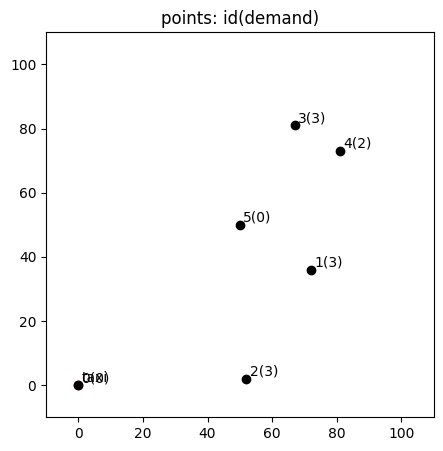

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 494.77146672067096


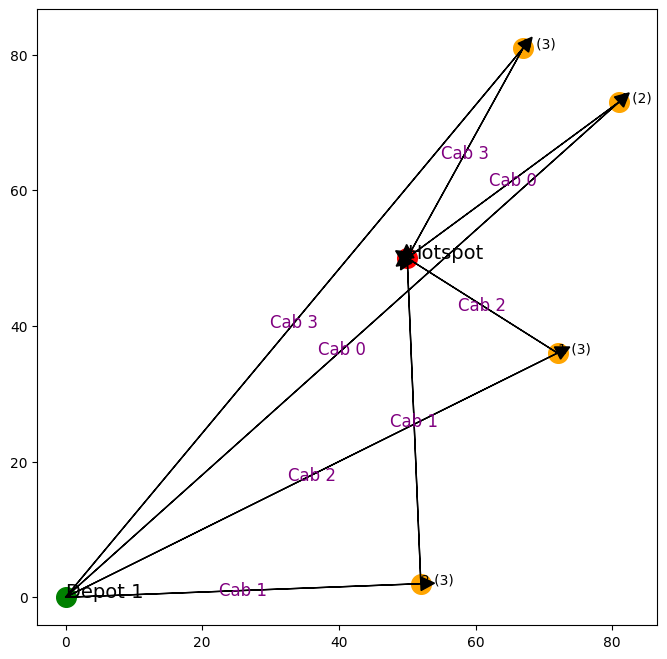

1 100.080095922888 144.12494579357175 116.10732276746961
{2}
2 106.57525681080303 78.2304288624318 10.770386482844671
{1}
    x   y  demand  priority
1  72  36       3         2
Iteration  161
    x   y  demand  priority
0   0   0       0         0
1  87  87       2         1
2  92  77       1         1
3  25  53       1         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  87  87       2         1
2  92  77       1         1
3  25  53       1         1
4  72  36       3         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


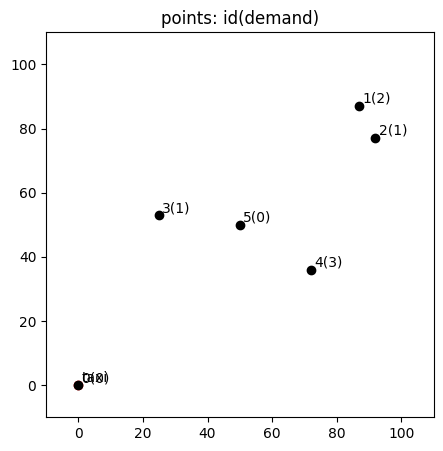

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 373.83202621398067


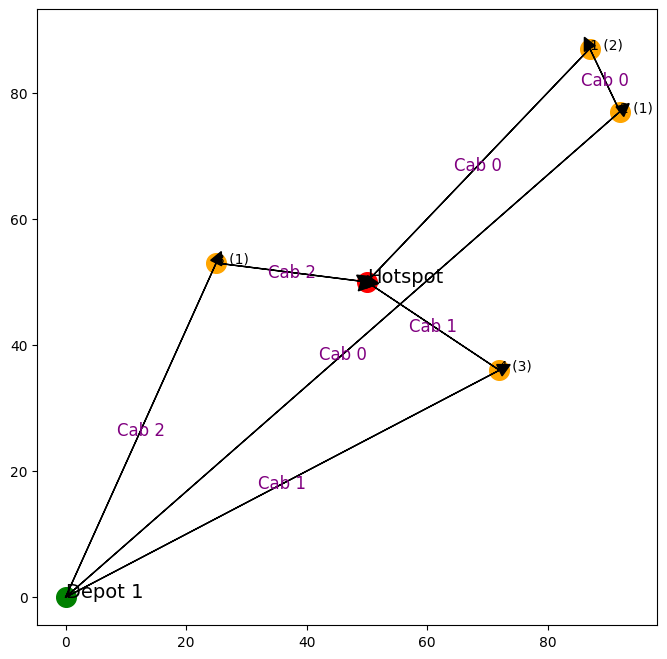

0 172.29673159571587 104.65180361560904 -15.319026172302301
{1}
2 83.77969791996279 25.179356624028344 -46.01066298392027
{3}
    x   y  demand  priority
1  87  87       2         2
3  25  53       1         2
Iteration  162
    x   y  demand  priority
0   0   0       0         0
1  34  88       2         1
2  89  36       1         1
3  47   7       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  34  88       2         1
2  89  36       1         1
3  47   7       3         1
4  87  87       2         2
5  25  53       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


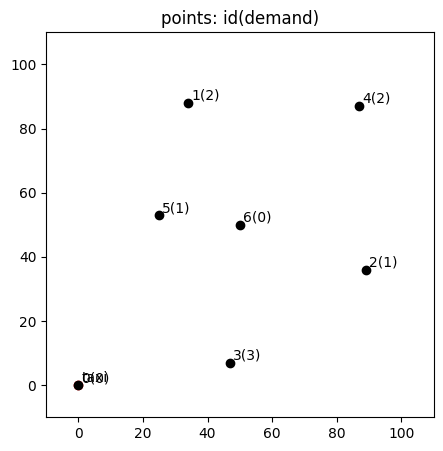

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 425.96327177842767


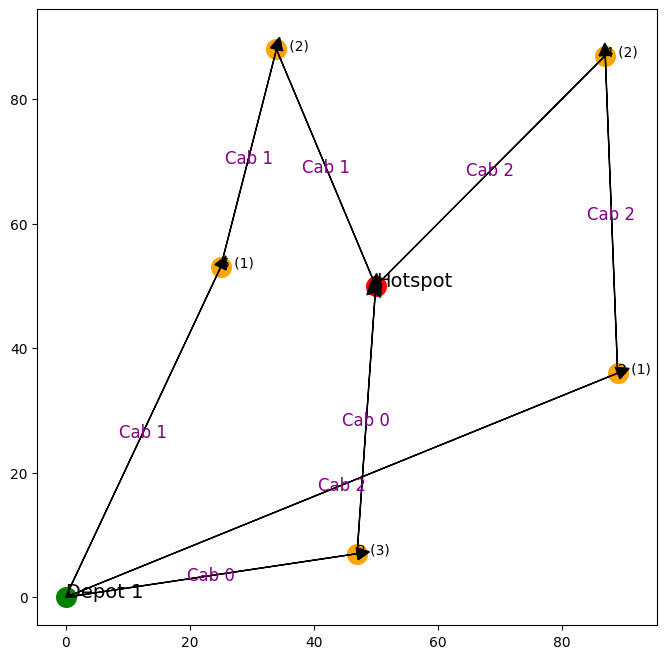

0 90.6229416065715 129.31357237351384 103.34741695369927
{3}
1 99.83139755211106 82.46211251235322 23.861771216418774
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  163
    x   y  demand  priority
0   0   0       0         0
1  81  73       1         1
2  90  32       2         1
3  40  87       2         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  81  73       1         1
2  90  32       2         1
3  40  87       2         1
4  50  50       0         1


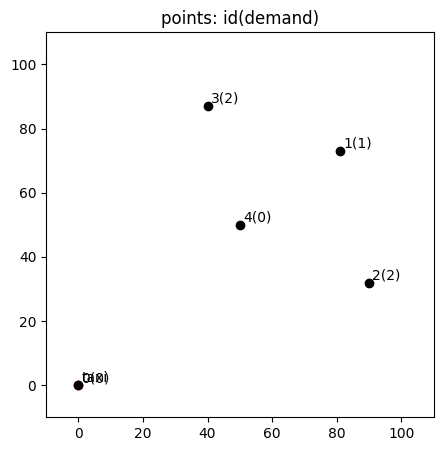

-1
1
Vehicle Requirements: 2
Moving Distance: 310.1787645746308


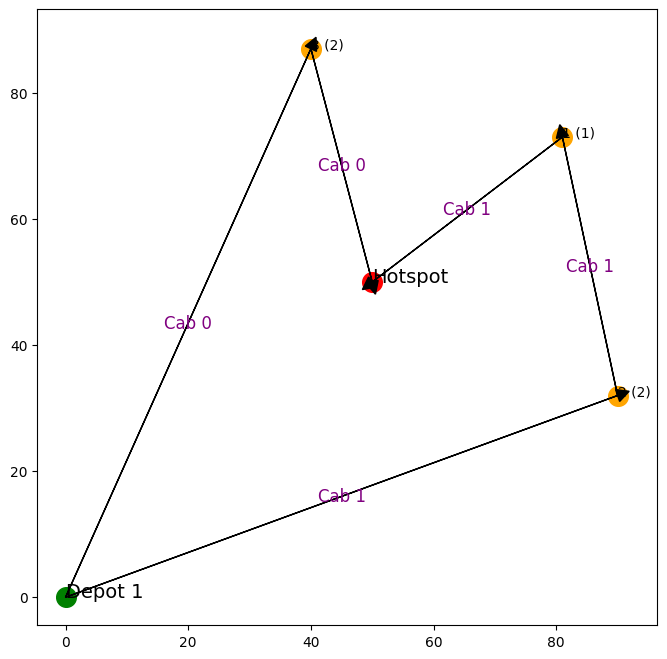

0 134.08243122968616 76.6550715869472 -19.099823849265363
{3}
1 134.120149621314 38.600518131237564 -76.21937242445765
{1}
    x   y  demand  priority
1  81  73       1         2
3  40  87       2         2
Iteration  164
    x   y  demand  priority
0   0   0       0         0
1  25  72       2         1
2  73  14       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  25  72       2         1
2  73  14       3         1
3  81  73       1         2
4  40  87       2         2
5  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


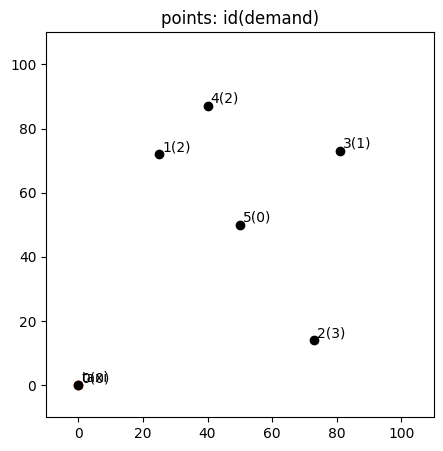

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 404.24858173535756


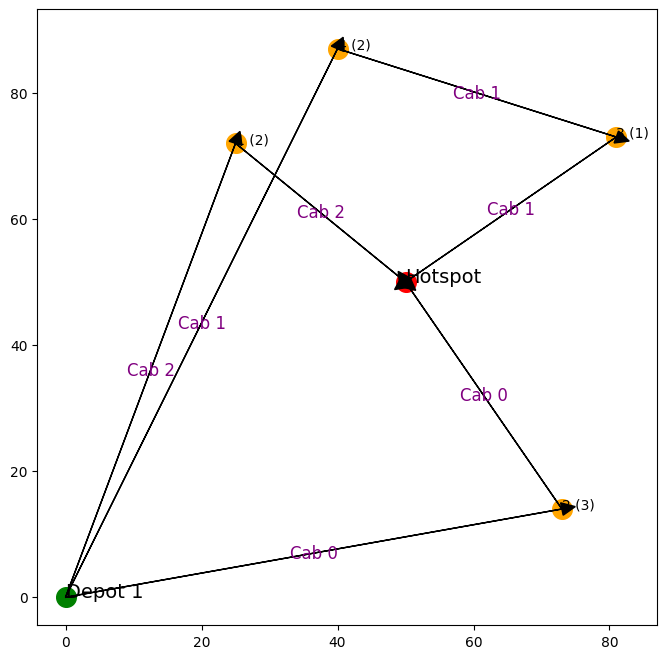

0 117.05036246318018 128.16005617976296 75.18972180646428
{2}
2 109.51844765985834 66.60330322138685 -9.61349282777806
{1}
    x   y  demand  priority
1  25  72       2         2
Iteration  165
    x   y  demand  priority
0   0   0       0         0
1  65  49       1         1
2  36  80       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  65  49       1         1
2  36  80       3         1
3  25  72       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


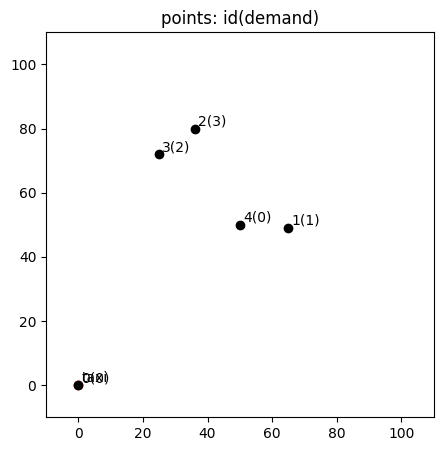

-1
1
Vehicle Requirements: 2
Moving Distance: 258.22391992011404


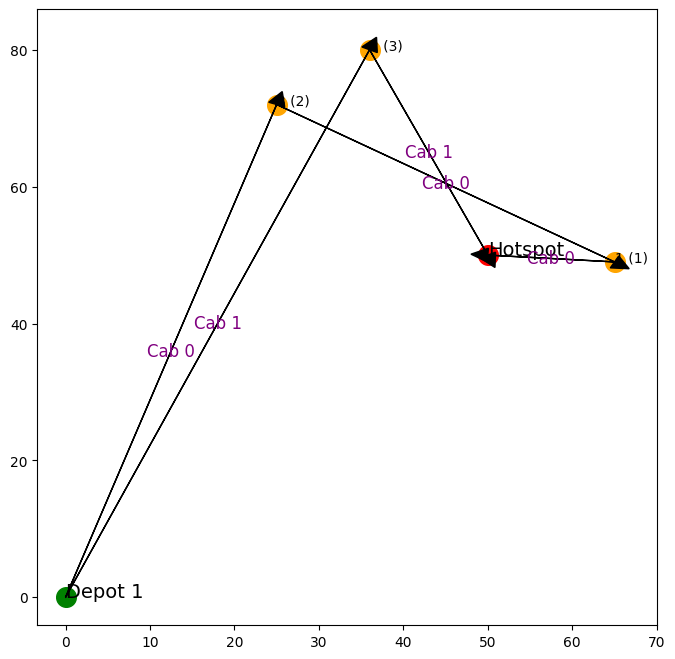

0 91.25009242753782 15.033296378372908 -68.70014785997846
{1}
1 120.83273951233893 99.31767214348109 28.143768702882696
{2}
    x   y  demand  priority
1  65  49       1         2
Iteration  166
    x   y  demand  priority
0   0   0       0         0
1  10  84       3         1
2  24  77       1         1
3  62  88       3         1
4  91  80       1         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  10  84       3         1
2  24  77       1         1
3  62  88       3         1
4  91  80       1         1
5  65  49       1         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


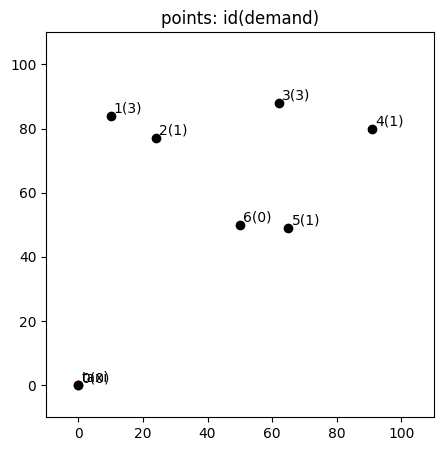

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 487.80191752138523


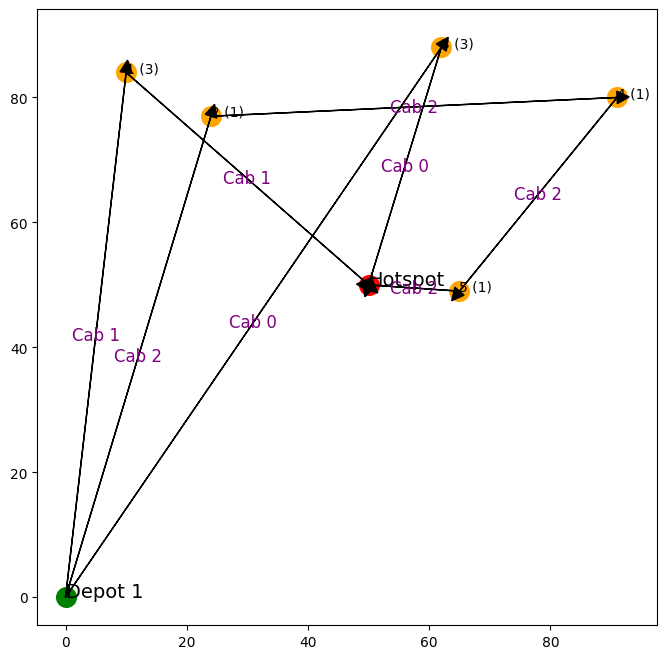

0 147.49729081672567 119.54915307102766 31.826438789815825
{3}
1 137.09076292385316 157.49285698088025 99.14852254746722
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  167
    x   y  demand  priority
0   0   0       0         0
1  23  90       3         1
2  38  45       3         1
3  34   8       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  23  90       3         1
2  38  45       3         1
3  34   8       3         1
4  50  50       0         1


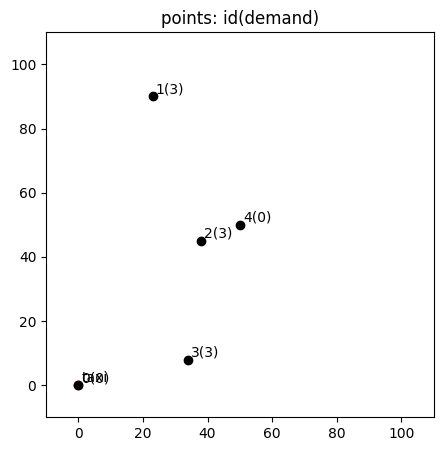

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 292.923250725049


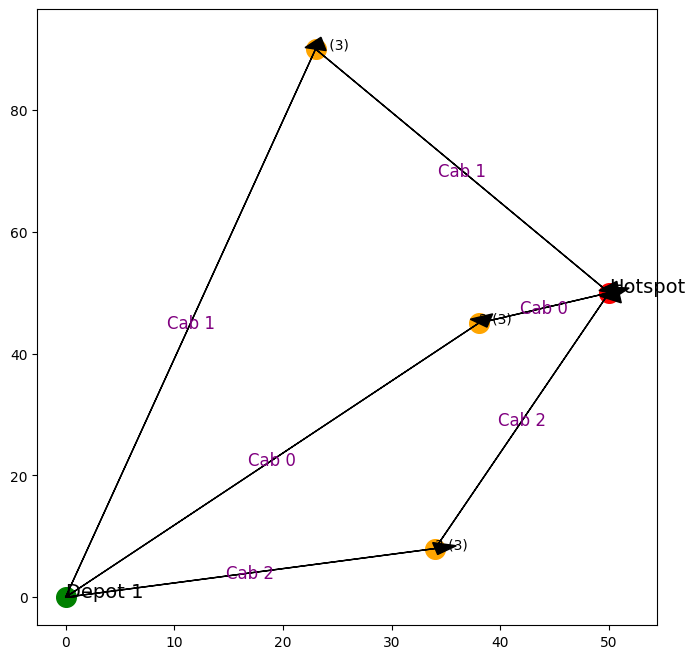

0 71.89821729050888 39.0 -13.398217290508882
{2}
1 141.1521249329057 144.77914214416387 76.0165882833401
{1}
2 79.87290850163441 134.8332303254654 122.37693698656369
{3}
    x   y  demand  priority
2  38  45       3         2
Iteration  168
    x   y  demand  priority
0   0   0       0         0
1  28  40       2         1
2  26  25       3         1
3  53  80       2         1
4  65  15       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  28  40       2         1
2  26  25       3         1
3  53  80       2         1
4  65  15       2         1
5  38  45       3         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


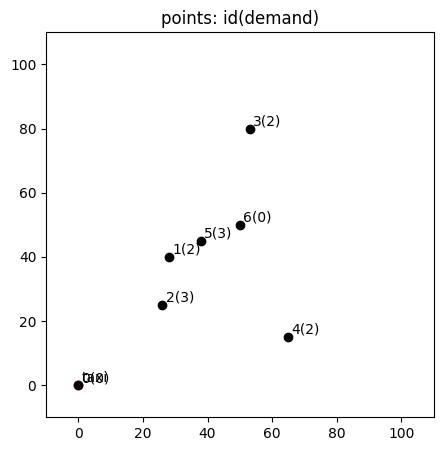

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 446.5157036510836


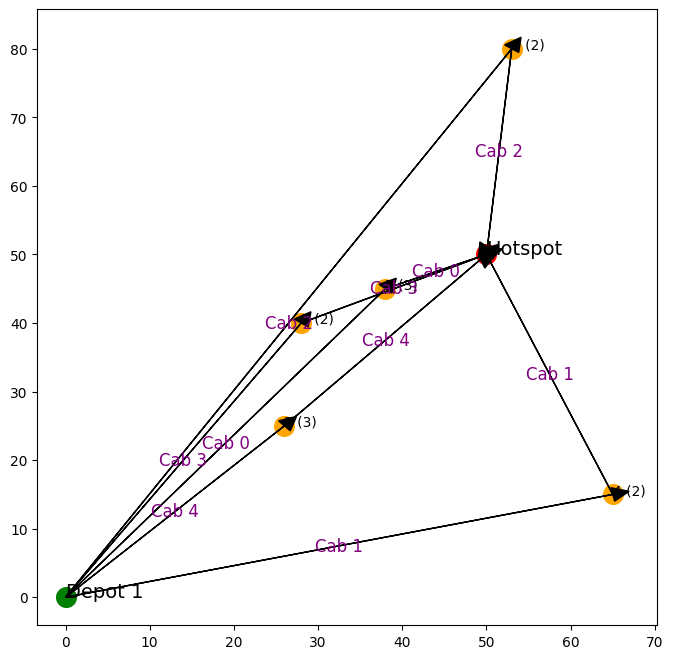

1 104.78718584995121 76.15773105863909 9.449410738007415
{4}
2 126.1131616044298 60.29925372672534 -35.664281014341796
{3}
3 72.99231441012395 48.33218389437829 -0.49403856855651895
{1}
4 70.72482449606977 103.96634070698074 85.22468656440134
{2}
    x   y  demand  priority
1  28  40       2         2
3  53  80       2         2
4  65  15       2         2
Iteration  169
    x   y  demand  priority
0   0   0       0         0
1  34  39       2         1
2  40   2       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  34  39       2         1
2  40   2       3         1
3  28  40       2         2
4  53  80       2         2
5  65  15       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


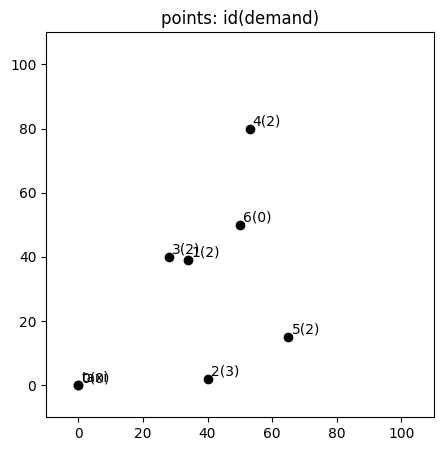

-1
-1
-1
-1
1
Vehicle Requirements: 5
Moving Distance: 464.12945446208533


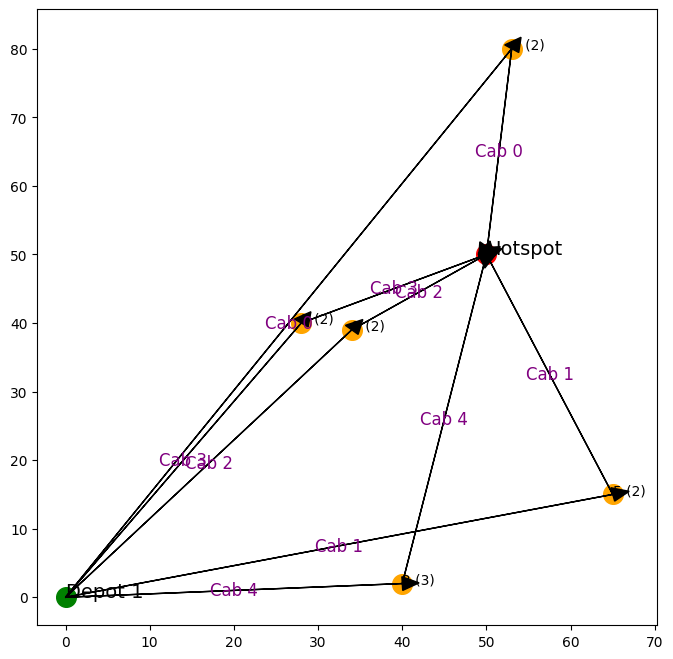

2 71.15622112005371 38.8329756778952 -12.90675760321092
{1}
4 89.08057147752663 147.09180806557515 131.5571406208361
{2}
    x   y  demand  priority
1  34  39       2         2
Iteration  170
    x   y  demand  priority
0   0   0       0         0
1  14  79       1         1
2  18  43       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  14  79       1         1
2  18  43       1         1
3  34  39       2         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


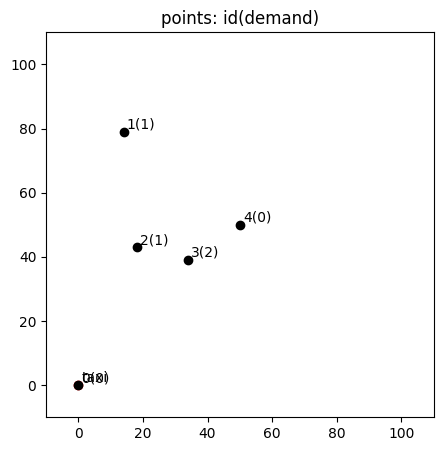

-1
1
Vehicle Requirements: 2
Moving Distance: 200.22090708113492


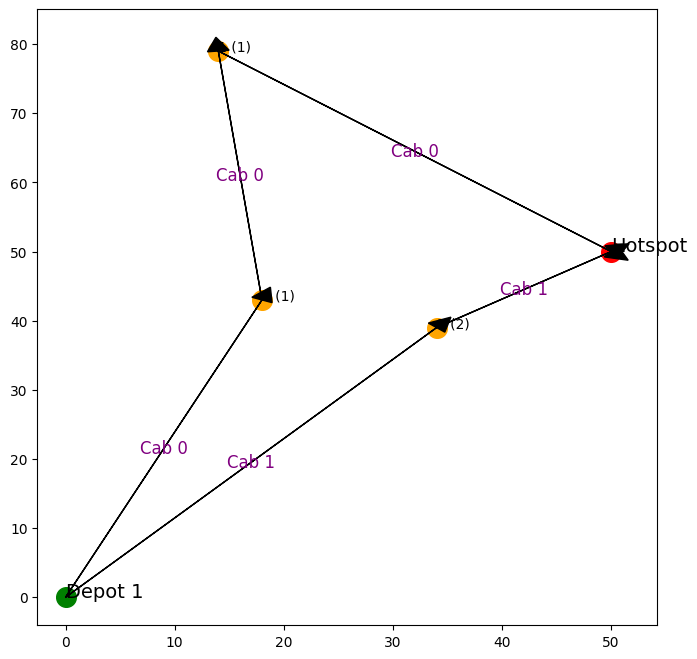

0 92.84314540853154 46.22769732530488 -23.501599420574223
{1}
    x   y  demand  priority
1  14  79       1         2
Iteration  171
    x   y  demand  priority
0   0   0       0         0
1  62  13       3         1
2  88  91       3         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  62  13       3         1
2  88  91       3         1
3  14  79       1         2
4  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


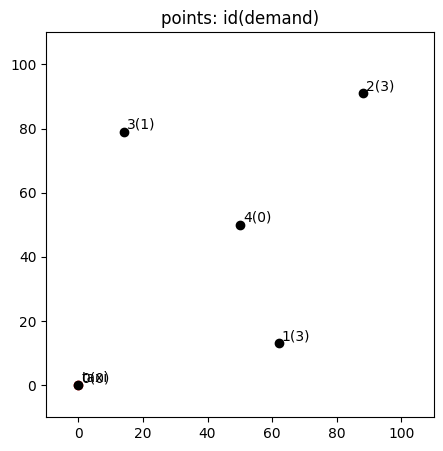

-1
-1
1
Vehicle Requirements: 3
Moving Distance: 411.1957470450589


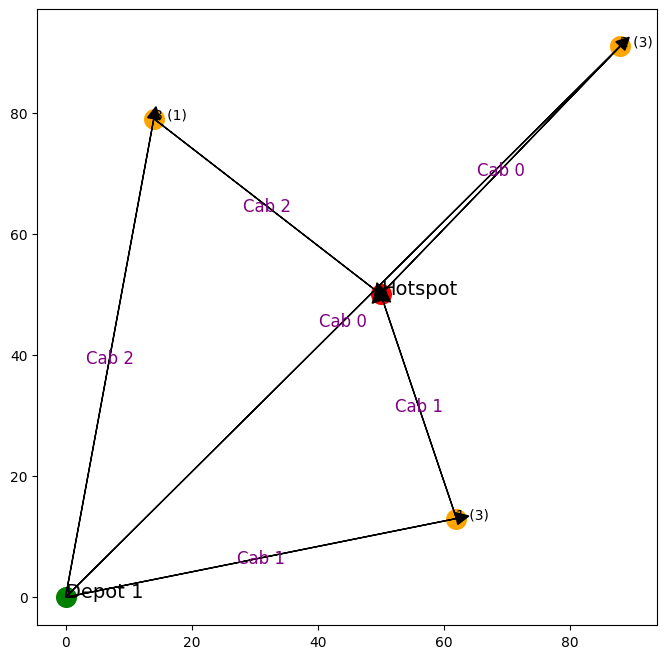

0 182.49158844921635 167.7050983124842 69.06605901950996
{2}
1 102.24554453640087 116.69190203266034 72.79230851258964
{1}
Empty DataFrame
Columns: [x, y, demand, priority]
Index: []
Iteration  172
    x   y  demand  priority
0   0   0       0         0
1  45  25       2         1
2  48   8       1         1
3  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  45  25       2         1
2  48   8       1         1
3  50  50       0         1


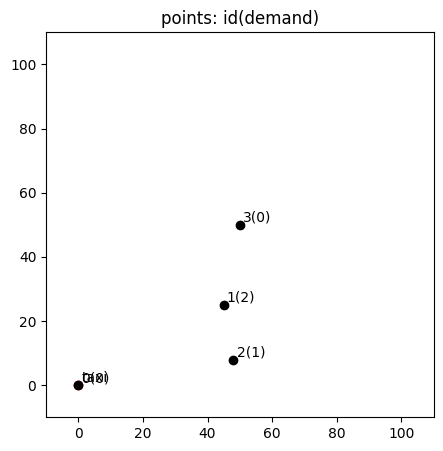

1
Vehicle Requirements: 1
Moving Distance: 91.41987431198174


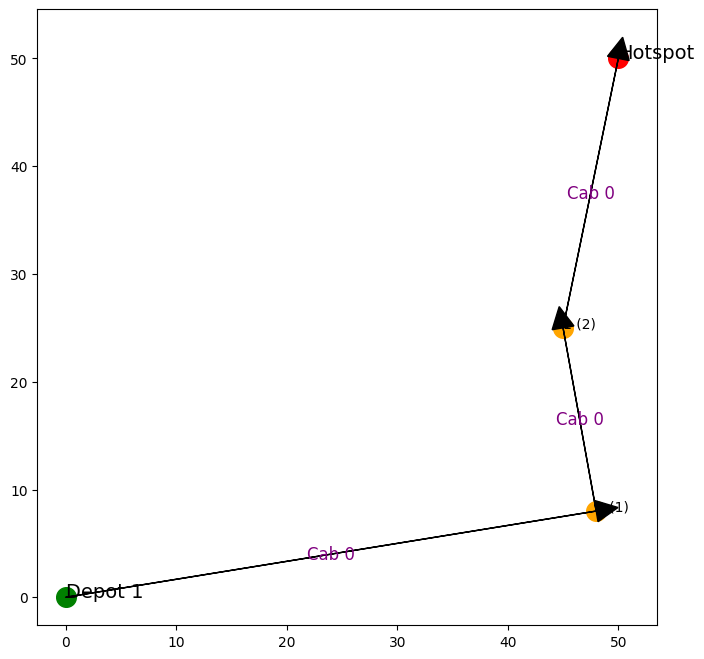

0 74.15719781034969 50.99019513592785 2.3280948935420867
{1}
    x   y  demand  priority
1  45  25       2         2
Iteration  173
    x   y  demand  priority
0   0   0       0         0
1  31  38       1         1
2  55  51       3         1
3  97  29       2         1
4  77  81       2         1
5  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  31  38       1         1
2  55  51       3         1
3  97  29       2         1
4  77  81       2         1
5  45  25       2         2
6  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


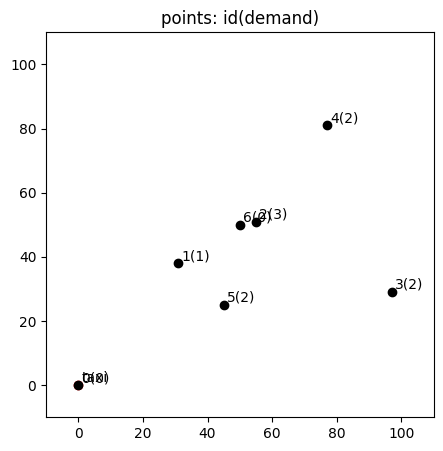

-1
-1
-1
1
Vehicle Requirements: 4
Moving Distance: 462.91802340727685


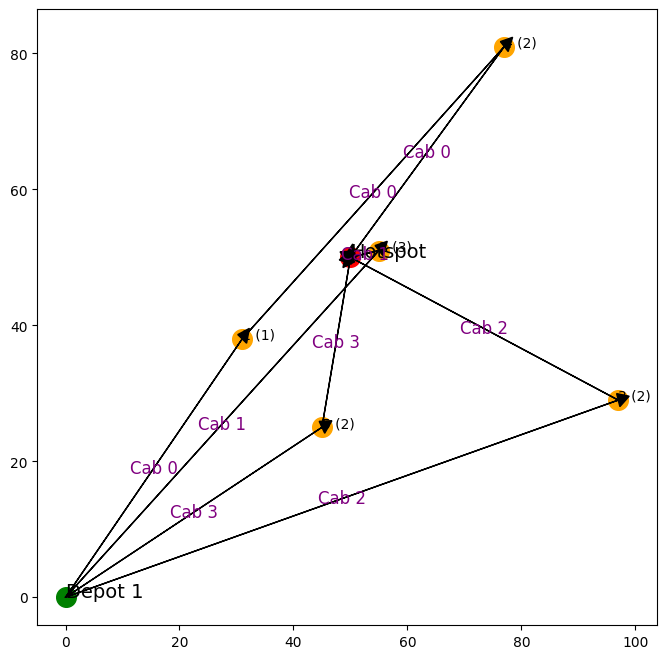

0 153.1186548888705 104.69142421862209 3.9184814390626173
{1, 4}
1 80.10568588398948 15.297058540778353 -57.16009807282195
{2}
2 152.72043436151796 102.95630140987001 1.7140177532870666
{3}
    x   y  demand  priority
1  31  38       1         2
2  55  51       3         2
3  97  29       2         2
4  77  81       2         2
Iteration  174
    x   y  demand  priority
0   0   0       0         0
1  20  22       2         1
2  54  91       3         1
3  56  97       3         1
4  50  50       0         1
    x   y  demand  priority
0   0   0       0         0
1  20  22       2         1
2  54  91       3         1
3  56  97       3         1
4  31  38       1         2
5  55  51       3         2
6  97  29       2         2
7  77  81       2         2
8  50  50       0         1


<ipython-input-5-5e9cf64ba5b7>:138: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rejected_df['priority'] = rejected_df['priority'].apply(lambda x: x*2)


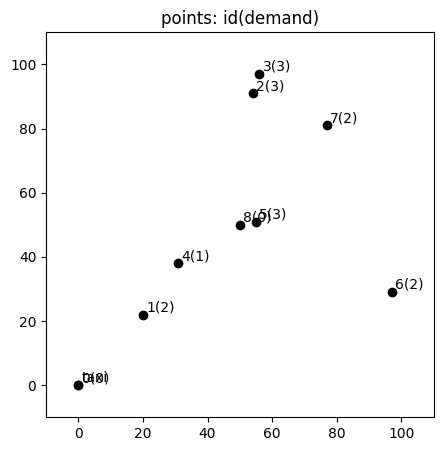

-1
-1


KeyboardInterrupt: 

In [ ]:
rejected_df = pd.DataFrame()
Optimizer(rejected_df)